# PROJECT -  A2Z CUSTOMER SEGMENTATION

## Introduction
Data herein presented pertains to a fictional insurance company in Portugal, A2Z Insurance. The goal is to develop a customer segmentation strategy that will enable the Marketing Department to better understand the different customers' profiles and develop adequate marketing strategies. <br>
This project is done within the cope of the **Data Mining** curricular unit of the Master's Degree in **Data Science and Advanced Analytics**.

#### Group elements:
* Ivan Jure Parać (20210689)
* Nuno de Bourbon e Carvalho Melo (20210681)
* Stuart Gallina Ottersen (20210703)


## Table of Contents
1. [Data exploration](#data-exploration)
2. [Data preprocessing](#data-preprocessing)
    1. [First steps](#preprocessing-first-steps)
    2. [Dealing with outliers](#preprocessing-outliers)
    3. [Handling missing values](#preprocessing-missing-values)
    4. [Feature creation and cross field validation](#preprocessing-transform-validate)
    5. [Feature selection](#preprocessing-feature-selection)
    6. [Feature skewness](#preprocessing-scaling)
3. [Clustering](#data-clustering)
    1. [Sociodemographic clustering](#clustering-sociodemographic)
    2. [Value clustering](#clustering-value)
    3. [Product clustering](#clustering-product)

***

<h2><center>BOILERPLATE</center></h2>

***

In [1]:
# uncomment next line of code to install package required for KPrototypes / missingno
# ! pip install kmodes
# ! pip install missingno
# ! pip install sompy
# ! pip install pyreadstat
# ! pip install graphviz

In [2]:
# import major libraries/modules
import pyreadstat
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import statsmodels.api as sm
import sklearn.metrics as metrics
import graphviz
import pydotplus
import missingno as msno

# others
from math import ceil
from collections import Counter
from regressors import stats
from scipy.cluster import hierarchy
from scipy.stats import chi2_contingency
from kmodes.kprototypes import KPrototypes
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor, NearestNeighbors
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.linear_model import LogisticRegression, LinearRegression, LassoCV
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, AffinityPropagation, OPTICS, MeanShift, Birch, SpectralClustering, estimate_bandwidth
from sklearn.feature_selection import RFE
from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestClassifier
from sklearn.semi_supervised import LabelSpreading

# self-organizing maps
# @misc{moosavi2014sompy,
#   title={SOMPY: A Python Library for Self Organizing Map (SOM)},
#   author={Moosavi, V and Packmann, S and Vall{\'e}s, I},
#   note={GitHub.[Online]. Available: https://github. com/sevamoo/SOMPY},
#   year={2014}
# }
import sompy
from sompy.visualization.mapview import View2D, View2DPacked
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView

In [3]:
# ignore warnings
import warnings
warnings.filterwarnings('ignore')
import logging
logging.getLogger('matplotlib').setLevel(logging.ERROR)

In [4]:
# load SAS file with the insurance company data
df, meta = pyreadstat.read_sas7bdat('a2z_insurance.sas7bdat')

# save copy of the original dataframe
original_df = df.copy()

<a class="anchor" id="data-exploration"></a>

***

<h2><center>DATA EXPLORATION</center></h2>

***

In [5]:
# first look at the dataframe
df.head()

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1.0,1985.0,1982.0,2 - High School,2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
1,2.0,1981.0,1995.0,2 - High School,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
2,3.0,1991.0,1970.0,1 - Basic,2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
3,4.0,1990.0,1981.0,3 - BSc/MSc,1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
4,5.0,1986.0,1973.0,3 - BSc/MSc,1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45


In [6]:
# check number of rows and columns
print("Number of observations:", df.shape[0])
print("Number of features:", df.shape[1])
print("Features:", list(df.columns))

Number of observations: 10296
Number of features: 14
Features: ['CustID', 'FirstPolYear', 'BirthYear', 'EducDeg', 'MonthSal', 'GeoLivArea', 'Children', 'CustMonVal', 'ClaimsRate', 'PremMotor', 'PremHousehold', 'PremHealth', 'PremLife', 'PremWork']


In [7]:
# describe the data
df.describe(include = "all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CustID,10296.0,NaN,NaN,NaN,5148.5,2972.34352,1.0,2574.75,5148.5,7722.25,10296.0
FirstPolYear,10266.0,NaN,NaN,NaN,1991.062634,511.267913,1974.0,1980.0,1986.0,1992.0,53784.0
BirthYear,10279.0,NaN,NaN,NaN,1968.007783,19.709476,1028.0,1953.0,1968.0,1983.0,2001.0
EducDeg,10296,5,3 - BSc/MSc,4799,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthSal,10260.0,NaN,NaN,NaN,2506.667057,1157.449634,333.0,1706.0,2501.5,3290.25,55215.0
GeoLivArea,10295.0,NaN,NaN,NaN,2.709859,1.266291,1.0,1.0,3.0,4.0,4.0
Children,10275.0,NaN,NaN,NaN,0.706764,0.455268,0.0,0.0,1.0,1.0,1.0
CustMonVal,10296.0,NaN,NaN,NaN,177.892605,1945.811505,-165680.42,-9.44,186.87,399.7775,11875.89
ClaimsRate,10296.0,NaN,NaN,NaN,0.742772,2.916964,0.0,0.39,0.72,0.98,256.2
PremMotor,10262.0,NaN,NaN,NaN,300.470252,211.914997,-4.11,190.59,298.61,408.3,11604.42


In [8]:
# more information about the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10296 entries, 0 to 10295
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CustID         10296 non-null  float64
 1   FirstPolYear   10266 non-null  float64
 2   BirthYear      10279 non-null  float64
 3   EducDeg        10296 non-null  object 
 4   MonthSal       10260 non-null  float64
 5   GeoLivArea     10295 non-null  float64
 6   Children       10275 non-null  float64
 7   CustMonVal     10296 non-null  float64
 8   ClaimsRate     10296 non-null  float64
 9   PremMotor      10262 non-null  float64
 10  PremHousehold  10296 non-null  float64
 11  PremHealth     10253 non-null  float64
 12  PremLife       10192 non-null  float64
 13  PremWork       10210 non-null  float64
dtypes: float64(13), object(1)
memory usage: 1.1+ MB


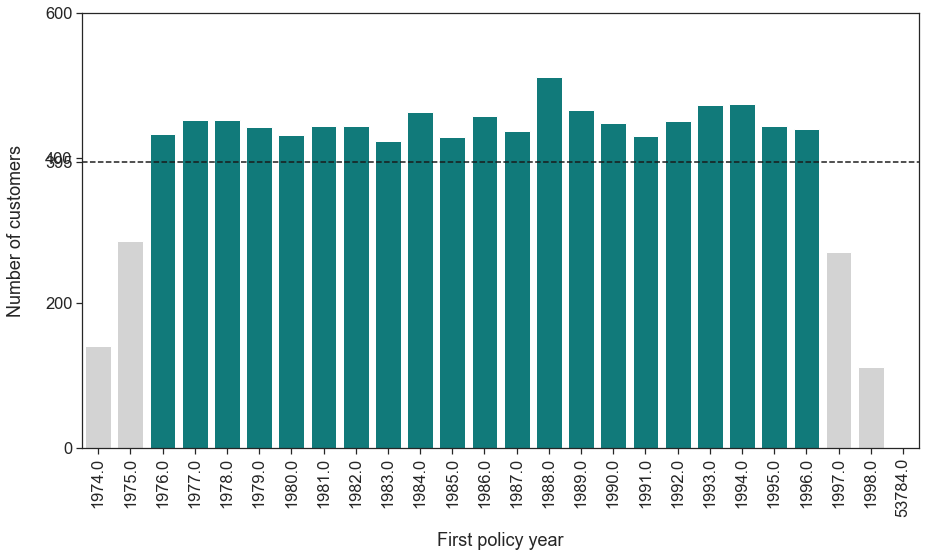

In [9]:
# plot the number of new customers per year
custs_mean = round(df.groupby("FirstPolYear").size().mean())

sns.set(style = "ticks", font_scale = 1.5)
fig, axes = plt.subplots(figsize = [15, 8])
sns.barplot(
    data = df,
    x = df.groupby("FirstPolYear").size().index,
    y = df.groupby("FirstPolYear").size().values,
    palette = ["darkcyan" if x > custs_mean else "lightgray" for x in df.groupby("FirstPolYear").size().values]
)
plt.axhline(custs_mean, c = "k", linestyle = "--")
plt.yticks([0, 200, custs_mean, 400, 600])
plt.ylim([0, 600])
plt.xticks(rotation=90)
plt.xlabel("First policy year", labelpad = 15)
plt.ylabel("Number of customers", labelpad = 20)

plt.savefig('Fig1_NewCustomersPerYear.jpeg', dpi=300, bbox_inches='tight')

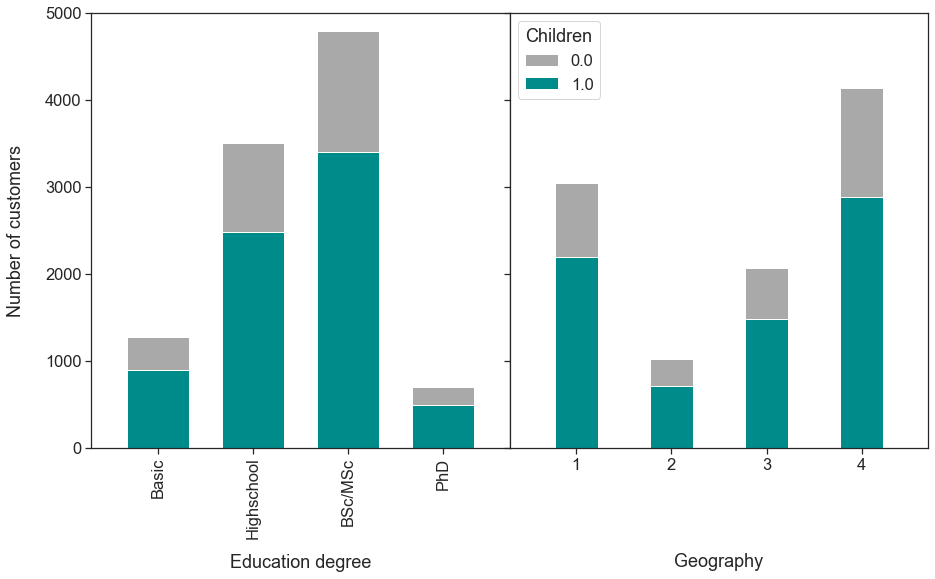

In [10]:
# function to modify bar width with patches
def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)


# plot the number of customers per education degree and geolivarea, children as hue
educ_plot = df[~(df.EducDeg == "")].sort_values("EducDeg")

sns.set(style = "ticks", font_scale = 1.5)
fig, axes = plt.subplots(1, 2, figsize = [15, 8])
plt.subplots_adjust(wspace=0, hspace=0)

for ax, feat in zip(axes.flatten(), ["EducDeg", "GeoLivArea"]):
    sns.histplot(
        data = educ_plot,
        x = feat,
        hue = "Children",
        multiple = "stack",
        palette = ["darkgray", "darkcyan"],
        alpha = 1,
        ax = ax,
        discrete = True
    )

# formatting
axes[0].set_xlabel("Education degree", labelpad = 15)
axes[0].set_ylabel("Number of customers", labelpad = 20)
axes[0].set_xticklabels(["Basic", "Highschool", "BSc/MSc", "PhD"], rotation = 90)
axes[0].set_ylim([0, 5000])
axes[0].legend().set_visible(False)
axes[1].set_xticks([1, 2, 3, 4])
axes[1].set_xlabel("Geography", labelpad = 80)
axes[1].set_ylabel(None)
axes[1].yaxis.set_ticklabels([])
axes[1].set_ylim([0, 5000])
change_width(axes[0], 0.65)
change_width(axes[1], 0.45)

plt.savefig('Fig2_CatFeaturesExploration.jpeg', dpi=300, bbox_inches='tight')

In [11]:
Counter(df.EducDeg)

Counter({'2 - High School': 3510,
         '1 - Basic': 1272,
         '3 - BSc/MSc': 4799,
         '4 - PhD': 698,
         '': 17})

In [12]:
# number of observations with at least one negative premium
df[(df.PremMotor < 0) | (df.PremHousehold < 0) | (df.PremHealth < 0) | (df.PremLife < 0) | (df.PremWork < 0)].shape

(2234, 14)

In [13]:
# number of observations with a negative CMV
df[df.CustMonVal < 0]

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
1,2.0,1981.0,1995.0,2 - High School,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3,4.0,1990.0,1981.0,3 - BSc/MSc,1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5,6.0,1986.0,1956.0,2 - High School,2566.0,4.0,1.0,-24.33,1.00,440.75,18.90,114.80,7.00,7.67
6,7.0,1979.0,1943.0,2 - High School,4103.0,4.0,0.0,-66.01,1.05,156.92,295.60,317.95,14.67,26.34
7,8.0,1988.0,1974.0,2 - High School,1743.0,4.0,1.0,-144.91,1.13,248.27,397.30,144.36,66.68,53.23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10281,10282.0,1996.0,1945.0,2 - High School,3670.0,3.0,1.0,-54.67,1.04,381.96,167.80,148.25,7.78,37.45
10282,10283.0,1996.0,1974.0,3 - BSc/MSc,1868.0,3.0,1.0,-16.00,0.99,417.08,108.90,133.47,4.78,13.78
10284,10285.0,1980.0,1987.0,3 - BSc/MSc,1504.0,4.0,1.0,-1.55,0.96,390.63,29.45,179.70,-6.00,NaN
10285,10286.0,1985.0,1948.0,3 - BSc/MSc,3878.0,4.0,1.0,-57.45,1.04,269.05,217.25,219.93,32.45,NaN


<a class="anchor" id="data-preprocessing"></a>

***

<h2><center>2. DATA PREPROCESSING</center></h2>

***

In [14]:
def plot_multiple(df, features, plot_type, fig_dimensions = [15, 8], nr_rows = 1, save_fig = "no", fig_name = "default"):

    '''
    Takes in a dataframe, df, a list of features, features,
    a plot type, plot_type, the dimensions of the figure,
    fig_dimensions, and the number of rows of the figure,
    nr_rows, as argument, and plots the specified plot type
    for the features passed as arguments.

    Arguments:
     df (dataframe): dataframe
     features (list): features from df to plot (min. 2 features)
     plot_type (str): type of plot (box, violin, or histogram)
     fig_dimensions (list, tuple): figure dimensions
     nr_rows (int): number of rows in the figure

    Returns:
     None
    '''

    sns.set(style = "ticks", font_scale = 1.5)

    fig, axes = plt.subplots(nr_rows, ceil(len(features) / nr_rows), figsize = fig_dimensions)
    
    # iterate through axes and associate each plot to one
    for ax, feat in zip(axes.flatten(), features):
        if (plot_type.lower() == "box") or (plot_type.lower() == "boxplot"):
            sns.boxplot(
                data = df,
                x = feat,
                color = "darkcyan",
                ax = ax
            )

        if (plot_type.lower() == "violin" or (plot_type.lower() == "violinplot")):
            sns.violinplot(
                data = df,
                x = feat,
                color = "darkcyan",
                ax = ax
            )

        if (plot_type.lower() == "histogram" or (plot_type.lower() == "histplot")):
            sns.histplot(
                data = df,
                x = feat,
                color = "darkcyan",
                ax = ax
            )

    if save_fig == "yes":
        plt.savefig(fig_name + '.jpeg', dpi=300, bbox_inches='tight')
        
    return

<a class="anchor" id="preprocessing-first-steps"></a>

<h3><right>2.1. First steps</right></h3>

* Set customer ID as index
* Remove duplicated observations
* Encode EducDeg and change to float
* Swap incoherent birth and first policy years

In [15]:
# set customer ID as index
df.CustID = df.CustID.astype("int")
df.set_index("CustID", inplace = True)

In [16]:
# check for duplicated rows
print("Number of duplicates:", df.duplicated().sum())

# remove duplicate rows
df.drop_duplicates(inplace = True)
print("Removing duplicates...")
print("Number of duplicates:", df.duplicated().sum())

# store initial number of rows (after duplicate removal)
initial_len = len(df)

# check number of rows and columns again
print("\nCurrent number of observations:", df.shape[0])
print("Current number of features:", df.shape[1])

df.head()

Number of duplicates: 3
Removing duplicates...
Number of duplicates: 0

Current number of observations: 10293
Current number of features: 13


,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1,1985.0,1982.0,2 - High School,2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2,1981.0,1995.0,2 - High School,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3,1991.0,1970.0,1 - Basic,2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4,1990.0,1981.0,3 - BSc/MSc,1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5,1986.0,1973.0,3 - BSc/MSc,1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45


In [17]:
# checking data types

# extract number from EducDeg, save as float
df.EducDeg = df.EducDeg.str.extract("(\d+)").astype("float")
# education degree mapper (to replace numbers when needed)
educ_mapper = {1: "Basic", 2: "High School", 3: "BSc/MSc", 4: "PhD"}

# check data types
df.dtypes

FirstPolYear     float64
BirthYear        float64
EducDeg          float64
MonthSal         float64
GeoLivArea       float64
Children         float64
CustMonVal       float64
ClaimsRate       float64
PremMotor        float64
PremHousehold    float64
PremHealth       float64
PremLife         float64
PremWork         float64
dtype: object

In [18]:
# swaps years if policy seems to be made before birth
nr_incoherences = len(df[df.BirthYear > df.FirstPolYear])
pc_incoherences = round(nr_incoherences/len(df)*100, 1)

print(f"Number of people with a policy before birth: {nr_incoherences} "
    f"({pc_incoherences}% of the dataset)")

# such high number of inconsistencies suggests systematic error
# assumption: in these cases BirthYear and FirstPolYear were introduced in the wrong fields
print("Swapping birth and first policy years...")

# swap FirstPolYear and BirthYear values when birth occurs after first policy creation
row_filter = df.BirthYear > df.FirstPolYear
df.loc[row_filter, ["FirstPolYear", "BirthYear"]] = df.loc[row_filter, ["BirthYear", "FirstPolYear"]].values

# check if the years were correctly swapped
nr_incoherences = len(df[df.BirthYear > df.FirstPolYear])
print(f"Number of people with a policy before birth: {nr_incoherences}")

Number of people with a policy before birth: 1997 (19.4% of the dataset)
Swapping birth and first policy years...
Number of people with a policy before birth: 0


<a class="anchor" id="preprocessing-outliers"></a>

<h3><right>2.2. Dealing with outliers</right></h3>

* Remove outliers and store them in a separate dataframe

In [19]:
def remove_outliers(df, filters):

    # create a separate dataframe for the outliers
    outliers = pd.DataFrame()

    # remove outliers from main dataframe
    # add outliers to a separate dataframe
    for filter_ in filters:
        outliers = outliers.append(df[filter_])
        df = df[~filter_]
        
    # determine number of outliers removed
    n_outliers = len(outliers)
    pc_removed = round(n_outliers/initial_len*100, 2)
    print(f"Number of outliers removed: {n_outliers} ({pc_removed}% of all observations)")

    return (df, outliers)

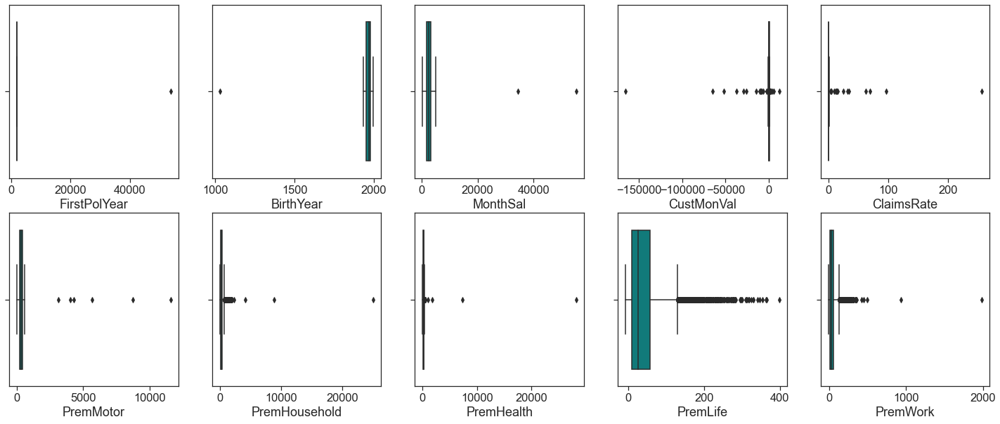

In [20]:
# define metric and non-metric features
metric_features = df.columns.drop(["EducDeg", "GeoLivArea", "Children"])
non_metric_features = ["EducDeg", "GeoLivArea", "Children"]

# boxplots of metric features
plot_multiple(df, metric_features, "box", [25, 10], nr_rows = 2, save_fig = "yes", fig_name = "Boxplots_BeforeRemovingOutliers")

Number of outliers removed: 44 (0.43% of all observations)


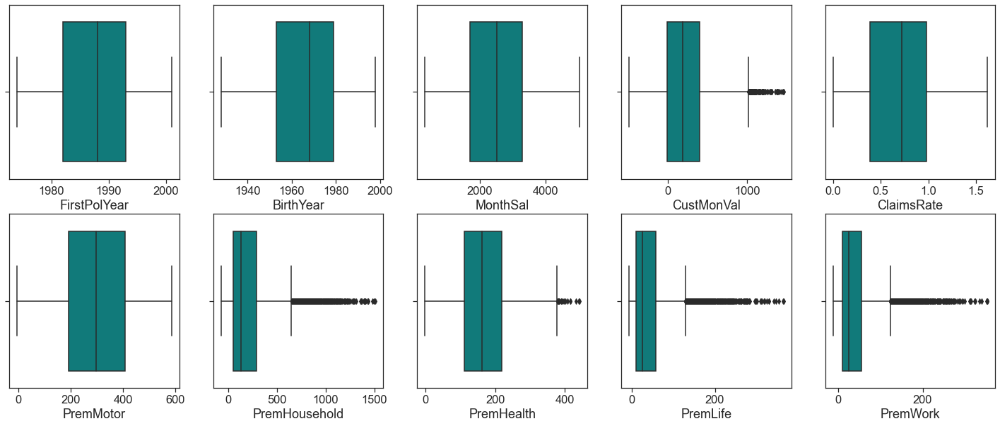

In [21]:
# BirthYear 1028 assumed to be a typo
# 0 and 9 are fairly close in a qwerty keyboard, replaced with 1928
df.loc[df.BirthYear == 1028, "BirthYear"] = 1928

# remove outliers from df, store them in df_outliers1
filters = (
    (df.FirstPolYear.ge(2017)),
    (df.MonthSal.ge(20000)),
    (df.CustMonVal.le(-2000)),
    (df.CustMonVal.ge(1460)),
    (df.ClaimsRate.ge(3)),
    (df.PremMotor.ge(3000)),
    (df.PremHousehold.ge(1700)),
    (df.PremHealth.ge(8000)),
    (df.PremLife.ge(385)),
    (df.PremWork.ge(400)),
)

df, df_outliers1 = remove_outliers(df, filters)

# boxplots of metric features after removing outliers
plot_multiple(df, metric_features, "box", [25, 10], nr_rows = 2, save_fig = "yes", fig_name = "Boxplots_AfterRemovingOutliers")

<a class="anchor" id="preprocessing-missing-values"></a>

<h3><right>2.3. Handling missing values</right></h3>

* Check feature and row completeness (in df and df_outliers)
* Remove customers with no information about Premiums
* Remove customers with missing FirstPolYear or BirthYear
* Remove customers with missing EducDeg
* Fill Premium missing values with zero
* Create Linear Regression model to impute MonthSal
* Create Logistic Regression model to impute Children

In [22]:
def check_completeness(df):

    '''
    Takes in a dataframe, df, as argument and
    computes the number/percentage of missing
    values per feature, and the number of rows
    with the maximum number of missing values.

    Arguments:
     df (dataframe): dataframe

    Returns:
     None
    '''

    # number and percentage of NaN values per feature
    nr_nans = df.isna().sum()
    pc_nans = df.isna().mean()*100
    feature_nans = pd.concat([nr_nans, pc_nans], axis = 1)
    feature_nans.rename(columns = {0: "nr", 1: "%"}, inplace = True)

    # show number of missing values per feature
    print("Missing values per feature:\n", feature_nans)

    # check row completeness
    # max number of NaN values in a row and number of rows with that many NaN
    max_row_nan = df.isnull().sum(axis = 1).max()
    
    print(f"\nMaximum number of NaN values per row: {max_row_nan} "
        f"({len(df[df.isnull().sum(axis = 1) == max_row_nan])} rows)")

    return

In [23]:
def remove_missing_values(df, cols, max_nan_per_row):

    '''
    Takes in a dataframe, df, a list of columns, cols,
    and the maximum number of nan per row, max_nan_per_row,
    and removes rows that have missing values in the columns
    passed on as arguments as well as rows that exceed the
    maximum number of missing values allowed.

    Arguments:
     df (dataframe): dataframe
     cols (list): column(s) in df to remove NaN
     max_nan_per_row (int): max number of NaN allowed per row

    Returns:
     df (dataframe): dataframe after removing NaN
     df_nan (dataframe): dataframe with the NaN rows removed from df
    '''

    # create dataframe to store rows discarded due to missing values
    df_nan = pd.DataFrame()

    # removing rows above the threshold of maximum missing values allowed
    max_nan_rows = df[df.isnull().sum(axis = 1) >= max_nan_per_row]
    df_nan = df_nan.append(max_nan_rows)
    df.drop(max_nan_rows.index, inplace = True)

    print(
        f"Removed {len(max_nan_rows)} row(s) "
        f"(missing {round(max_nan_per_row/len(df.columns)*100, 1)}% of their data)"
    )

    # remove rows with missing values from features passed as arguments
    # add these rows to df_nan
    for col in cols:
        nan_ = df[col].isna()
        nr_removed = sum(nan_)

        df_nan = df_nan.append(df[nan_])
        df = df[~nan_]

        print(f"Removed {nr_removed} row(s) (NaN in {col})")

    # show total number of missing values removed
    nr_rows_removed = len(df_nan)
    total_removed = initial_len - len(df)

    print(
        f"Total number of rows removed: {nr_rows_removed}\n"
        f"Total number of rows removed so far: {total_removed} "
        f"({round(total_removed/initial_len*100, 2)}%)"
    )

    return (df, df_nan)

In [24]:
def zero_imputer(df, cols):

    '''
    Takes in a dataframe, df, and a list of columns,
    cols, and replaces existing missing values in
    those columns with zero.

    Arguments:
     df (dataframe): dataframe
     cols (list): column(s) in df to impute NaN with 0
    
    Returns:
     df (dataframe): dataframe after value imputation
    '''

    # save the total number of imputed values
    total_imputations = 0

    # impute each NaN value in cols with zero
    for col in cols:
        col_nan = sum(df[col].isna())
        df[col].fillna(0, inplace = True)

        # print number of imputed values per column
        print(f"Imputed {col_nan} out of {col_nan} missing value(s) in {col}")
        
        total_imputations += col_nan

    print(f"Total number of imputations: {total_imputations}")

    return df

In [25]:
def linreg_imputer(df, regressors, regressand):

    '''
    Takes in a dataframe, df, a list of regressor names,
    regressors, and the name of the regressand, regressand,
    and uses a linear regression model to predict missing
    values in the regressand based on the regressors.

    Arguments:
     df (dataframe): dataframe
     regressors (str, list): list of columns in df to be used
    in linear regression to predict the regressand
     regressand (str): name of column in df whose missing values
    will be imputed with values predicted by linear regression

    Returns:
     df (dataframe): dataframe after value imputation
    '''

    # independent, X, and dependent, y, variables
    X = df.dropna()[regressors]
    y = df.dropna()[regressand]

    # split train and validation data
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.3, random_state = 15)

    # reshaping needed if a string and not a list is passed as argument for regressors
    if (type(regressors) is not list) and (type(regressors) is str):
        X_train = np.array(X_train).reshape(-1, 1)
        X_val = np.array(X_val).reshape(-1, 1)

    # scale features using MinMaxScaler() with parameters from X_train
    scaler = MinMaxScaler().fit(X_train)
    # scale the training and test sets
    X_train_scaled = scaler.transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    # create and fit model
    lin_reg = LinearRegression()
    lin_reg.fit(X_train_scaled, y_train)

    # predict salary of the validation set
    y_pred = lin_reg.predict(X_val_scaled)

    # compute metrics for the predictions made
    mse = metrics.mean_squared_error(y_val, y_pred)
    rmse = metrics.mean_squared_error(y_val, y_pred, squared = False)
    mae = metrics.mean_absolute_error(y_val, y_pred)

    print("")
    print("======================================================")
    print("                Linear regression model               ")
    print("======================================================")
    print("Mean square error:", round(mse, 2))
    print("Root mean square error:", round(rmse, 2))
    print("Mean absolute error:", round(mae, 2))
    stats.summary(clf = lin_reg, X = X_train_scaled, y = y_train)
    print("======================================================")

    # predict missing values in the regressand column
    X_test = df.loc[df[regressand].isna(), regressors]

    # reshaping needed if a string and not a list is passed as argument for regressors
    if type(regressors) is not list:
        X_test = np.array(X_test).reshape(-1, 1)

    X_test_scaled = scaler.transform(X_test)
    y_pred = lin_reg.predict(X_test_scaled)

    # impute missing values in the regressand column
    df.loc[df[regressand].isna(), regressand] = y_pred
    
    print(f"\nImputed {len(y_pred)} values in {regressand}")

    return df

In [26]:
def knreg_choose_k(df, regressors, regressand, max_n_neighbors):

    neighborhood_sizes = np.arange(1, max_n_neighbors+1)

    # independent, X, and dependent, y, variables
    X = df.dropna()[regressors]
    y = df.dropna()[regressand]

    # split train and validation data
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.3, random_state = 15)

    # reshaping needed if a string and not a list is passed as argument for regressors
    if (type(regressors) is not list) and (type(regressors) is str):
        X_train = np.array(X_train).reshape(-1, 1)
        X_val = np.array(X_val).reshape(-1, 1)

    # scale features using MinMaxScaler() with parameters from X_train
    scaler = MinMaxScaler().fit(X_train)
    # scale the training and test sets
    X_train_scaled = scaler.transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    # set up lists for the metrics
    rmse_values = list()
    mae_values = list()
    adj_r2_values = list()

    for n in neighborhood_sizes:
        # create and fit model for each number of neighbors
        kn_reg = KNeighborsRegressor(n_neighbors = n, weights = "distance")
        kn_reg.fit(X_train_scaled, y_train)
        # predict salary of the validation set
        y_pred = kn_reg.predict(X_val_scaled)

        # compute metrics
        rmse = metrics.mean_squared_error(y_val, y_pred, squared = False)
        mae = metrics.mean_absolute_error(y_val, y_pred)
        r2 = metrics.r2_score(y_val, y_pred)
        adj_r2 = 1 - (1 - r2)*((X_val.shape[0] - 1)/(X_val.shape[0] - X_val.shape[1] - 1))

        # append values to corresponding list
        rmse_values.append(rmse)
        mae_values.append(mae)
        adj_r2_values.append(adj_r2)

    # get number of neighbors that provide the 'best' the metrics evaluated
    n_min_rmse = rmse_values.index(np.min(rmse_values)) + 1
    n_min_mae = mae_values.index(np.min(mae_values)) + 1
    n_max_adj_r2 = adj_r2_values.index(np.max(adj_r2_values)) + 1

    print(
        f"k = {n_min_rmse} minimises RMSE ({round(np.min(rmse_values), 2)})\n"
        f"k = {n_min_mae} minimises MAE ({round(np.min(mae_values), 2)})\n"
        f"k = {n_max_adj_r2} maximises adjusted R-squared ({round(np.max(adj_r2_values), 2)})"
    )

    # list of computed metrics
    metrics_ = [rmse_values, mae_values, adj_r2_values]
    y_labels = ["RMSE", "MAE", "R2 (adjusted)"]

    # plot the error and adjusted R2 values
    sns.set(style = "ticks")

    fig, axes = plt.subplots(1, 3, figsize=(20, 6))

    for ax, metric, y_label in zip(axes.flatten(), metrics_, y_labels):
        sns.lineplot(x = neighborhood_sizes,
            y = metric,
            marker = "o",
            mew = 0,
            ax = ax,
            color = "C9",
            linewidth = 4    
        )
        ax.set_xlabel("Number of neighbors, k")
        ax.set_ylabel(y_label)
    
    return

In [27]:
def logreg_feat_selection(df, regressand):

    # independent, X, and dependent, y, variables
    X = df.dropna().drop(columns = regressand)
    y = df.dropna()[regressand]

    # split data into train (70%) and validation (30%) datasets
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.3, random_state = 5, stratify = y)

    # scale features using MinMaxScaler with parameters from X_train
    scaler = MinMaxScaler().fit(X_train)
    # scale the training set
    X_train_scaled = scaler.transform(X_train)
    # scale the test set
    X_val_scaled = scaler.transform(X_val)

    # recursive feature elimination
    numfeats_list = np.arange(1, len(df.columns))
    scores = {}

    for n in range(len(numfeats_list)):
        log_reg = LogisticRegression()
        rfe = RFE(estimator=log_reg, n_features_to_select=numfeats_list[n])
        
        X_train_rfe = rfe.fit_transform(X_train_scaled, y_train)
        X_val_rfe = rfe.transform(X_val_scaled)
        log_reg.fit(X_train_rfe, y_train)
        
        score = log_reg.score(X_val_rfe, y_val)
        scores[n+1] = score

    # RFE selected 1 single feature
    best_num_feats = max(scores, key = scores.get)
    rfe = RFE(estimator = log_reg, n_features_to_select = best_num_feats)
    rfe.fit(X = X_train_scaled, y = y_train)
    selected_features = pd.Series(rfe.support_, index = X_train.columns, name = "RFE")

    # compute correlation between Children and other features
    correlations = pd.Series(df.corr()[regressand], name = "Correlation")

    # compute Lasso coefficients
    reg = LassoCV()
    reg.fit(X_train_scaled, y_train)
    lasso_coef = pd.Series(reg.coef_, index = X_train.columns, name = "Lasso")

    # concatenate features selected by rfe, correlations, and lasso coefficients
    selection_df = pd.concat([selected_features, correlations, lasso_coef], axis = 1).drop(regressand)

    # plot correlation and lasso coefficients
    coef_names = ["Correlation", "Lasso"]

    sns.set()
    sns.set_style("white")
    fig, axes = plt.subplots(1, ceil(len(coef_names)), figsize = (24, 10))

    for ax, coef in zip(axes.flatten(), coef_names):
        sns.barplot(data = selection_df,
                    x = coef,
                    y = selection_df.index,
                    hue = "RFE",
                    palette = ["darkgray", "C9"],
                    order = selection_df.sort_values(coef).index,
                    ax = ax)
        ax.axvline(x = 0, linestyle = "--", color = "darkgray", label = "_nolegend_")
        ax.set_xlabel(coef + " coefficient", fontsize = 16)
        ax.legend(title = "RFE", loc = "upper right", fontsize = 14)

    plt.show()

    return

In [28]:
def logreg_imputer(df, regressors, regressand):
            
    # imputing missing Children values
    # conclusion based on previous feature selection: use only BirthYear

    # independent, X, and dependent, y, variables
    X = df.dropna()[regressors]
    y = df.dropna()[regressand]

    # split data into train (70%) and validation (30%) datasets
    # 70% have children, 30% dont, decided to stratify
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.3, random_state = 5, stratify = y)

    # reshaping needed if a string and not a list is passed as argument for regressors
    if type(regressors) is not list:
        X_train = np.array(X_train).reshape(-1, 1)
        X_val = np.array(X_val).reshape(-1, 1)

    # scale features using MinMaxScaler with parameters from X_train
    scaler = MinMaxScaler().fit(X_train)
    # scale the training and test sets
    X_train_scaled = scaler.transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    # create a logistic regression model
    log_reg = LogisticRegression()
    log_reg.fit(X_train_scaled, y_train)

    # predict y
    y_pred = log_reg.predict(X_val_scaled)

    # evaluate the predictions of the logistic reg model
    conf_matrix = metrics.confusion_matrix(y_val, y_pred)
    conf_matrix = pd.DataFrame(conf_matrix)
    accuracy = round(metrics.accuracy_score(y_val, y_pred)*100, 2)
    precision = round(metrics.precision_score(y_val, y_pred)*100, 2)
    recall = round(metrics.recall_score(y_val, y_pred)*100, 2)
    f1 = round(metrics.f1_score(y_val, y_pred)*100, 2)

    print("==============================================")
    print("           Logistic regression model          ")
    print("==============================================")
    print("Accuracy:", accuracy, "%")
    print("Precision:", precision, "%")
    print("Recall:", recall, "%")
    print("F1 score:", f1, "%")
    print("Confusion matrix:\n", conf_matrix)
    print("==============================================")

    # predict missing values in the regressand column
    X_test = df.loc[df[regressand].isna(), regressors]

    # reshaping needed if a string and not a list is passed as argument for regressors
    if type(regressors) is not list:
        X_test = np.array(X_test).reshape(-1, 1)
    
    X_test_scaled = scaler.transform(X_test)
    y_pred = log_reg.predict(X_test_scaled)

    # impute missing values in the regressand column
    df.loc[df[regressand].isna(), regressand] = y_pred

    print(f"\nImputed {len(y_pred)} values in {regressand}") 

    return df

In [29]:
def knclassif_choose_k(df, regressors, regressand, max_n_neighbors):

    neighborhood_sizes = np.arange(1, max_n_neighbors+1)

    # independent, X, and dependent, y, variables
    X = df.dropna()[regressors]
    y = df.dropna()[regressand]

    # split data into train (70%) and validation (30%) datasets
    # 70% have children, 30% dont, decided to stratify
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.3, random_state = 5, stratify = y)

    # reshaping needed if a string and not a list is passed as argument for regressors
    if type(regressors) is not list:
        X_train = np.array(X_train).reshape(-1, 1)
        X_val = np.array(X_val).reshape(-1, 1)

    # scale features using MinMaxScaler with parameters from X_train
    scaler = MinMaxScaler().fit(X_train)
    # scale the training and test sets
    X_train_scaled = scaler.transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    # set up lists for metrics
    accuracy_values = list()
    precision_values = list()
    recall_values = list()
    f1_values = list()

    for n in neighborhood_sizes:
        # create a logistic regression model
        log_reg = KNeighborsClassifier(n_neighbors = n, weights = "distance").fit(X_train_scaled, y_train)
        # predict y
        y_pred = log_reg.predict(X_val_scaled)

        # compute metrics
        accuracy = round(metrics.accuracy_score(y_val, y_pred)*100, 2)
        precision = round(metrics.precision_score(y_val, y_pred)*100, 2)
        recall = round(metrics.recall_score(y_val, y_pred)*100, 2)
        f1 = round(metrics.f1_score(y_val, y_pred)*100, 2)

        # append values to corresponding list
        accuracy_values.append(accuracy)
        precision_values.append(precision)
        recall_values.append(recall)
        f1_values.append(f1)

    # get number of neighbors that provide the 'best' metrics
    n_max_accuracy = accuracy_values.index(np.max(accuracy_values)) + 1
    n_max_precision = precision_values.index(np.max(precision_values)) + 1
    n_max_recall = recall_values.index(np.max(recall_values)) + 1
    n_max_f1 = f1_values.index(np.max(f1_values)) + 1

    print(
        f"k = {n_max_accuracy} maximises accuracy ({round(np.max(accuracy_values), 2)})\n"
        f"k = {n_max_precision} maximises precision ({round(np.max(precision_values), 2)})\n"
        f"k = {n_max_recall} maximises recall ({round(np.max(recall_values), 2)})\n"
        f"k = {n_max_f1} maximises F1 score ({round(np.max(f1_values), 2)})\n"
    )

    # list of computed metrics
    metrics_ = [accuracy_values, precision_values, recall_values, f1_values]
    y_labels = ["Accuracy, %", "Precision, %", "Recall, %", "F1 score"]

    # plot the error and adjusted R2 values
    sns.set(style = "ticks")

    fig, axes = plt.subplots(2, 2, figsize=(20, 12))

    for ax, metric, y_label in zip(axes.flatten(), metrics_, y_labels):
        sns.lineplot(x = neighborhood_sizes,
            y = metric,
            marker = "o",
            mew = 0,
            ax = ax,
            color = "darkcyan",
            linewidth = 4    
        )
        ax.set_xlabel("Number of neighbors, k")
        ax.set_ylabel(y_label)  

    return

In [30]:
# check missing values in the dataframe
check_completeness(df)

Missing values per feature:
                 nr         %
FirstPolYear    30  0.292711
BirthYear       17  0.165870
EducDeg         17  0.165870
MonthSal        36  0.351254
GeoLivArea       1  0.009757
Children        21  0.204898
CustMonVal       0  0.000000
ClaimsRate       0  0.000000
PremMotor       33  0.321983
PremHousehold    0  0.000000
PremHealth      42  0.409796
PremLife       104  1.014733
PremWork        86  0.839106

Maximum number of NaN values per row: 4 (12 rows)


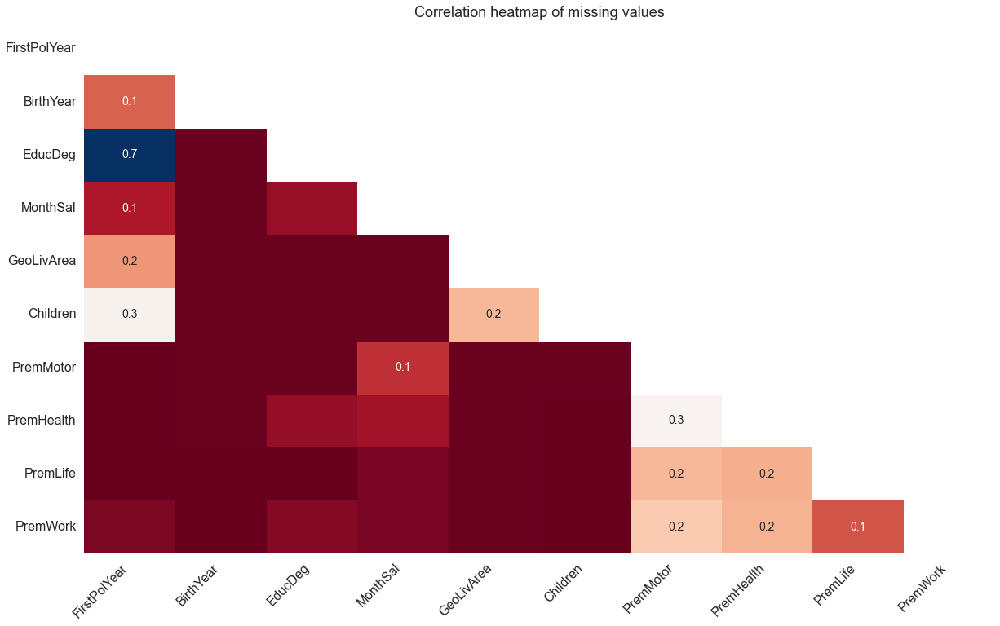

In [31]:
# visualize distribution of missing values
# people with no information about their educ degree tend to have no information about the year of the first policy
msno.heatmap(df)
plt.title("Correlation heatmap of missing values")

plt.savefig('CorrHeatmapMissingValues.jpeg', dpi=300, bbox_inches='tight')

In [32]:
# drops rows with missing values in FirstPolYear, BirthYear, EducDeg
# drop highly incomplete rows (no information about Premiums)
max_nan_per_row = df.isnull().sum(axis = 1).max()
cols = ["FirstPolYear", "BirthYear", "EducDeg"]
df, df_nan = remove_missing_values(df, cols, max_nan_per_row)

Removed 12 row(s) (missing 30.8% of their data)
Removed 30 row(s) (NaN in FirstPolYear)
Removed 14 row(s) (NaN in BirthYear)
Removed 2 row(s) (NaN in EducDeg)
Total number of rows removed: 58
Total number of rows removed so far: 102 (0.99%)


In [33]:
# impute missing values in the Premium features
cols = [col for col in df if col.startswith("Prem")]
df = zero_imputer(df, cols)

Imputed 21 out of 21 missing value(s) in PremMotor
Imputed 0 out of 0 missing value(s) in PremHousehold
Imputed 29 out of 29 missing value(s) in PremHealth
Imputed 92 out of 92 missing value(s) in PremLife
Imputed 73 out of 73 missing value(s) in PremWork
Total number of imputations: 215


In [34]:
# choose feature(s) to use for linear regression of MonthSal
corr_salary = pd.Series(df.corr().MonthSal, name = "Correlation").sort_values()
print("Correlation between salary and other features:")
print(round(corr_salary, 3))

Correlation between salary and other features:
BirthYear       -0.904
Children        -0.461
FirstPolYear    -0.300
PremLife        -0.242
PremWork        -0.241
PremHousehold   -0.233
CustMonVal      -0.059
ClaimsRate       0.002
GeoLivArea       0.010
PremHealth       0.028
EducDeg          0.180
PremMotor        0.225
MonthSal         1.000
Name: Correlation, dtype: float64


In [35]:
# MonthSal imputation

# Option 1: KNReg
# sal_regressors = df.columns.drop("MonthSal")
# regressand = "MonthSal"
# knreg_choose_k(df, sal_regressors, regressand, max_n_neighbors = 20)


# Option 2: LinReg
# using all features (MSE 171009, RMSE 414, MAE 331, Adj R2 0.817)
# sal_regressors = df.columns.drop("MonthSal")
# regressand = "MonthSal"
# df = linreg_imputer(df, sal_regressors, regressand)

# using BirthYear and Children (MSE 177996, RMSE 422, MAE 334, Adj R2 0.818)
# sal_regressors = ["BirthYear", "Children"]
# regressand = "MonthSal"
# df = linreg_imputer(df, sal_regressors, regressand)

# using BirthYear only (very high correlation of -0.9)
sal_regressors = ["BirthYear"]
regressand = "MonthSal"
df = linreg_imputer(df, sal_regressors, regressand)

# better predictions with linear regression than KNRegressor
# similar results using a simple linear regression with BirthYear and using a multiple regression with all features


                Linear regression model               
Mean square error: 182626.75
Root mean square error: 427.35
Mean absolute error: 336.08
Residuals:
       Min        1Q   Median       3Q       Max
-1509.3943 -288.0634 -14.6173 267.0031 1736.1596


Coefficients:
               Estimate  Std. Error   t value  p value
_intercept  4305.697301    8.359926  515.0401      0.0
x1         -3612.868544   18.798373 -192.1905      0.0
---
R-squared:  0.81755,    Adjusted R-squared:  0.81752
F-statistic: 31809.68 on 1 features

Imputed 33 values in MonthSal


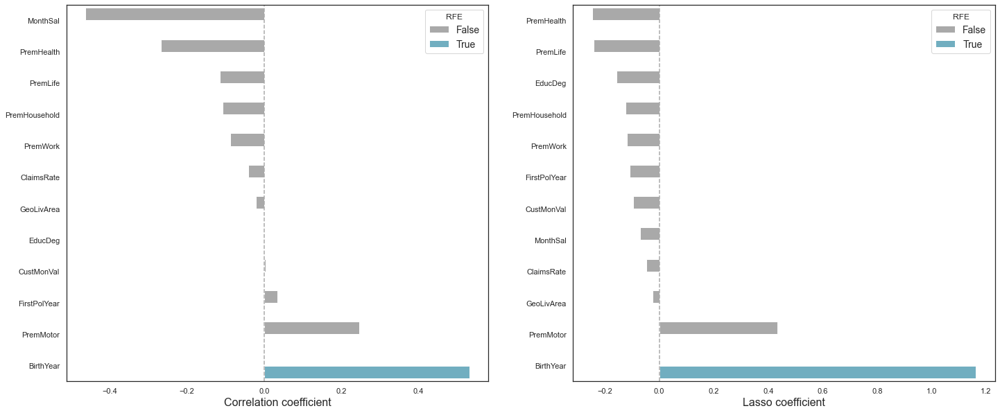

           Logistic regression model          
Accuracy: 85.1 %
Precision: 86.76 %
Recall: 93.15 %
F1 score: 89.84 %
Confusion matrix:
      0     1
0  587   307
1  148  2012

Imputed 13 values in Children


In [36]:
# Children imputation

# Option 1: KNClassifier
# child_regressors = list(df.columns.drop("Children"))
# regressand = "Children"
# knclassif_choose_k(df, child_regressors, regressand, max_n_neighbors = 25)


# Option 2: LogReg
# choose features (RFE, correlations, Lasso)
logreg_feat_selection(df, "Children")

# KNClassifier (all features, k = 23, weights = distance) and logistic regression with BirthYear provide similar predictions
# impute children missing values with Logistic Regression
children_regressors = ["BirthYear"]
df = logreg_imputer(df, children_regressors, "Children")

In [37]:
# check if all NaN values were dealt with
check_completeness(df)

Missing values per feature:
                nr    %
FirstPolYear    0  0.0
BirthYear       0  0.0
EducDeg         0  0.0
MonthSal        0  0.0
GeoLivArea      0  0.0
Children        0  0.0
CustMonVal      0  0.0
ClaimsRate      0  0.0
PremMotor       0  0.0
PremHousehold   0  0.0
PremHealth      0  0.0
PremLife        0  0.0
PremWork        0  0.0

Maximum number of NaN values per row: 0 (10191 rows)


In [38]:
# check missing values in df_outliers1
check_completeness(df_outliers1)

# deal with Premium missing values in df_outliers1
cols = ["PremMotor", "PremHealth", "PremLife", "PremWork"]
df_outliers1 = zero_imputer(df_outliers1, cols)

Missing values per feature:
                nr         %
FirstPolYear    0  0.000000
BirthYear       0  0.000000
EducDeg         0  0.000000
MonthSal        0  0.000000
GeoLivArea      0  0.000000
Children        0  0.000000
CustMonVal      0  0.000000
ClaimsRate      0  0.000000
PremMotor       1  2.272727
PremHousehold   0  0.000000
PremHealth      1  2.272727
PremLife        0  0.000000
PremWork        0  0.000000

Maximum number of NaN values per row: 2 (1 rows)
Imputed 1 out of 1 missing value(s) in PremMotor
Imputed 1 out of 1 missing value(s) in PremHealth
Imputed 0 out of 0 missing value(s) in PremLife
Imputed 0 out of 0 missing value(s) in PremWork
Total number of imputations: 2


<a class="anchor" id="preprocessing-transform-validate"></a>

<h3><right>2.4. Feature creation</right></h3>

* Add columns: Age, FirstPolAge, CustYears, Generation, PremTotal, Premium ratios
* Check if EducDeg makes sense given the customer's age
* Convert MonthSal to YearSal
* Remove outliers from newly created features
* Transform skewed metric features

In [39]:
def feature_creator(df):
    
    # save columns originally present in the dataframe
    initial_cols = df.columns

    # create Age column
    # (customers age as of 2016)
    curr_year = 2016
    cust_ages = curr_year - df.BirthYear
    df["Age"] = cust_ages
    
    # create FirstPolAge column
    # (customers age at the time of the first policy creation)
    firstpol_ages = df.FirstPolYear - df.BirthYear
    df["FirstPolAge"] = firstpol_ages
    
    # create CustYears column
    # (number of years as a customer to the company)
    df["CustYears"] = curr_year - df.FirstPolYear
    
    # create Generation column
    # (generation customers belongs to)
    df.loc[(df.BirthYear >= 1928) & (df.BirthYear <= 1945), "Generation"] = 1 # Silent Gen
    df.loc[(df.BirthYear >= 1946) & (df.BirthYear <= 1964), "Generation"] = 2 # Baby Boomer
    df.loc[(df.BirthYear >= 1965) & (df.BirthYear <= 1980), "Generation"] = 3 # Gen X
    df.loc[(df.BirthYear >= 1981) & (df.BirthYear <= 1996), "Generation"] = 4 # Millennial
    df.loc[(df.BirthYear >= 1997) & (df.BirthYear <= 2012), "Generation"] = 5 # Gen Z
    df.Generation = df.Generation.astype("float")
    
    # create YearSal column
    # (customers yearly income)
    year_sals = df.MonthSal * 12
    df["YearSal"] = year_sals
    
    # create a PremTotal column
    # (customers total money spent on premiums)
    premium_cols = ["PremMotor", "PremHousehold", "PremHealth", "PremLife", "PremWork"]
    df["PremTotal"] = df[premium_cols].sum(axis = 1)

    # create Effort column
    # (proportion of the yearly salary each customer spends on the company)
    efforts = df.PremTotal / df.YearSal
    df["EffortRatio"] = efforts
    
    # create PremiumRatio columns
    # (proportion of the total premium spent on each type of policy)
    for col in premium_cols:
        newcol_vals = df[col]/df["PremTotal"]
        newcol_name = col + "Ratio"
        df[newcol_name] = newcol_vals

    # verbose: list of newly created columns
    new_cols = df.columns.drop(initial_cols)
    print(f"Created {len(new_cols)} new features:\n{list(new_cols)}")
        
    return df

In [40]:
# update dataframe with new features
df = feature_creator(df)

# also add the new features to df_outliers1
# needed so that they can be assigned to clusters later on
df_outliers1 = feature_creator(df_outliers1)

# update metric and non-metric features
metric_features = df.columns.drop(["EducDeg", "GeoLivArea", "Children", "Generation"])
non_metric_features = ["EducDeg", "GeoLivArea", "Children", "Generation"]

Created 12 new features:
['Age', 'FirstPolAge', 'CustYears', 'Generation', 'YearSal', 'PremTotal', 'EffortRatio', 'PremMotorRatio', 'PremHouseholdRatio', 'PremHealthRatio', 'PremLifeRatio', 'PremWorkRatio']
Created 12 new features:
['Age', 'FirstPolAge', 'CustYears', 'Generation', 'YearSal', 'PremTotal', 'EffortRatio', 'PremMotorRatio', 'PremHouseholdRatio', 'PremHealthRatio', 'PremLifeRatio', 'PremWorkRatio']


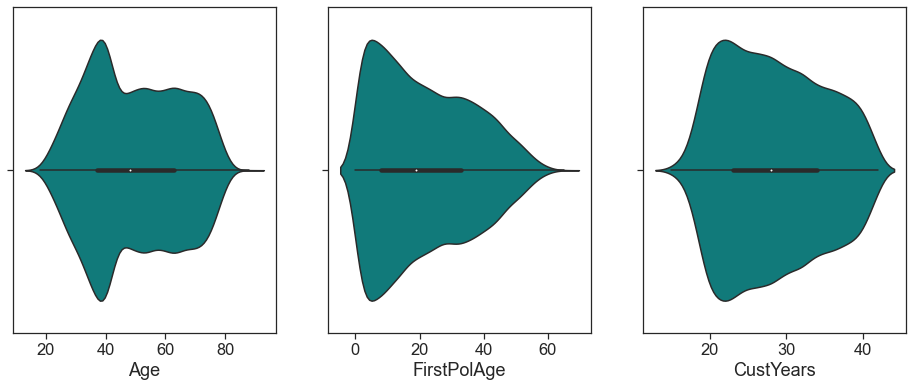

In [41]:
# violinplots of the newly created year-related features
features = ["Age", "FirstPolAge", "CustYears"]
plot_multiple(df, features, "violin", fig_dimensions = [16, 6])

Text(0, 0.5, 'Count')

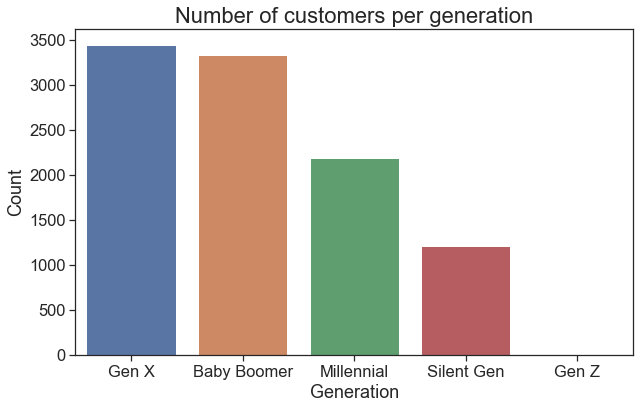

In [42]:
# visualize Generation feature
# generation mapper
gen_mapper = {
    1: "Silent Gen",
    2: "Baby Boomer",
    3: "Gen X",
    4: "Millennial",
    5: "Gen Z"
}

# count number of customers per generation
gen_count = df.groupby("Generation").size().sort_values(ascending = False)
gen_count.rename(index = gen_mapper, inplace = True)

# visualize number of customers per generation
fig, ax = plt.subplots(figsize = (10, 6))
sns.barplot(x = gen_count.index, y = gen_count.values, order = gen_count.index)
plt.title("Number of customers per generation", fontsize = 22)
plt.xlabel("Generation", fontsize = 18)
plt.ylabel("Count", fontsize = 18)

# plt.show()

# almost no customers from the younger generation, Gen Z

In [43]:
# cross-validate EducDeg and Age
# minimum age is 18 - meaning everyone can have an education up to High School
# minimum age of 20 for a BSc
# minimum age of 23 for a PhD (skipping MSc and finishing in 3 years, UK or outside of the EU)
educdeg_min_age = df.groupby("EducDeg").Age.min().rename(index = educ_mapper)
print("======================================")
print("   Cross-validating EducDeg and Age   ")
print("======================================")
print("Minimum age associated to each EducDeg")
print(educdeg_min_age)

# no incoherences found

   Cross-validating EducDeg and Age   
Minimum age associated to each EducDeg
EducDeg
Basic          18.0
High School    19.0
BSc/MSc        20.0
PhD            23.0
Name: Age, dtype: float64


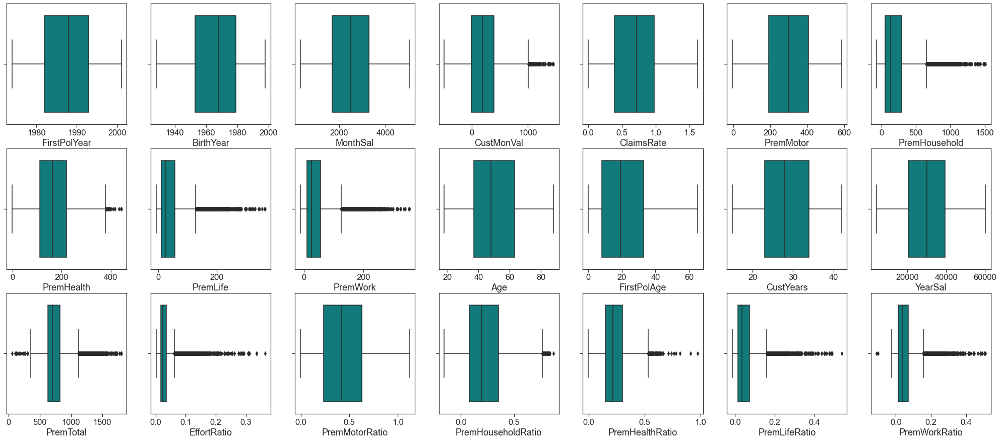

In [44]:
# plot metric features
plot_multiple(df, metric_features, "box", fig_dimensions = [35, 15], nr_rows = 3)

Number of outliers removed: 27 (0.26% of all observations)


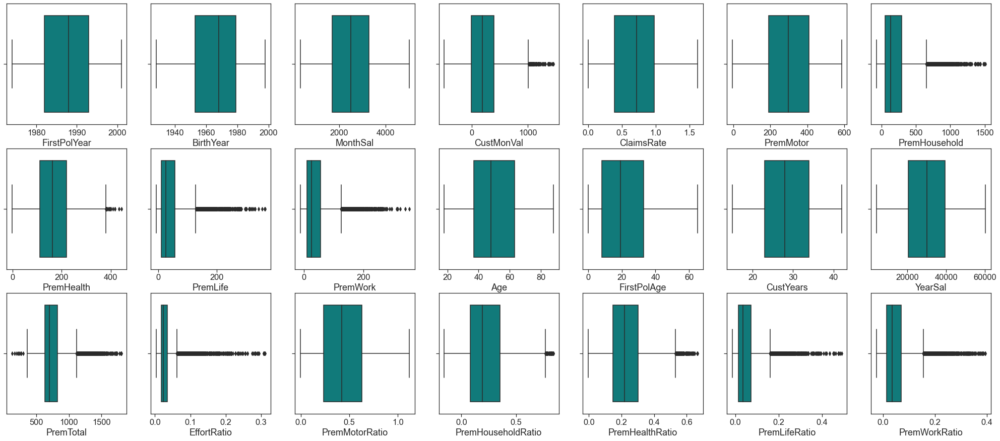

In [45]:
# conditions to remove outliers
filters = (
    (df.PremHouseholdRatio.ge(0.85)),
    (df.PremHealthRatio.ge(0.70)),
    (df.PremLifeRatio.ge(0.50)),
    (df.PremWorkRatio.ge(0.40)),
    (df.PremWorkRatio.le(-0.05)),
    # (df.PremTotal.le(2000)),
    (df.PremTotal.ge(1900)),
    (df.EffortRatio.ge(0.32))
)

# remove outliers from newly created features, store them in outliers2
df, df_outliers2 = remove_outliers(df, filters)

# merge the two outliers dataframes
df_outliers = pd.concat([df_outliers1, df_outliers2])

# boxplot of metric features after removing outliers
plot_multiple(df, metric_features, "box", [35, 15], 3)

<a class="anchor" id="preprocessing-feature-selection"></a>

<h3><right>2.5. Feature selection</right></h3>

* Remove redundant features
* Remove irrelevant features
* Prepare dataframe for cluster analysis

In [46]:
def corr_heatmap(df, corrlimit, method = "pearson"):

    '''
    Takes in a dataframe, df, and a coefficient, method,
    as arguments and creates a correlation heatmap showing
    the correlations between all pairs of features in the
    dataframe.
    '''

    sns.set(style = "ticks")
    plt.subplots(figsize = (20, 15))

    mask = np.triu(np.ones_like(df.corr(method = method), dtype = bool))
    correlationmatrix=df.corr(method = method)
    annot_labels = correlationmatrix
    annot_mask = abs(correlationmatrix) <corrlimit
    annot_labels=round(annot_labels,2).astype(str)
    annot_labels[annot_mask] ='' 
    corr_heatmap = sns.heatmap(correlationmatrix, mask = mask, vmin = -1, vmax = 1, annot = annot_labels, cmap = 'BrBG',fmt='')
    corr_heatmap.set_title('Triangle Correlation Heatmap', fontdict = {'fontsize': 14}, pad = 8)

    return

In [47]:
def restructure_df(df):
    
    # reorganise column order
    df = df.loc[:, [
        "Generation",
        "Age",
        "YearSal",
        "EducDeg",
        "Children",
        "FirstPolAge",
        "CustYears",
        "CustMonVal",
        "ClaimsRate",
        "PremMotor",
        "PremMotorRatio",
        "PremHousehold",
        "PremHouseholdRatio",
        "PremHealth",
        "PremHealthRatio",
        "PremLife",
        "PremLifeRatio",
        "PremWork",
        "PremWorkRatio",
        "PremTotal",
        "EffortRatio"
        ]
    ]
    
    # rename a few columns
    df = df.rename(columns = {
        "CustMonVal": "CMV",
        "PremMotor": "Motor",
        "PremMotorRatio": "MotorRatio",
        "PremHousehold": "House",
        "PremHouseholdRatio": "HouseRatio",
        "PremHealth": "Health",
        "PremHealthRatio": "HealthRatio",
        "PremLife": "Life",
        "PremLifeRatio": "LifeRatio",
        "PremWork": "Work",
        "PremWorkRatio": "WorkRatio"
        }
    )
    
    return df

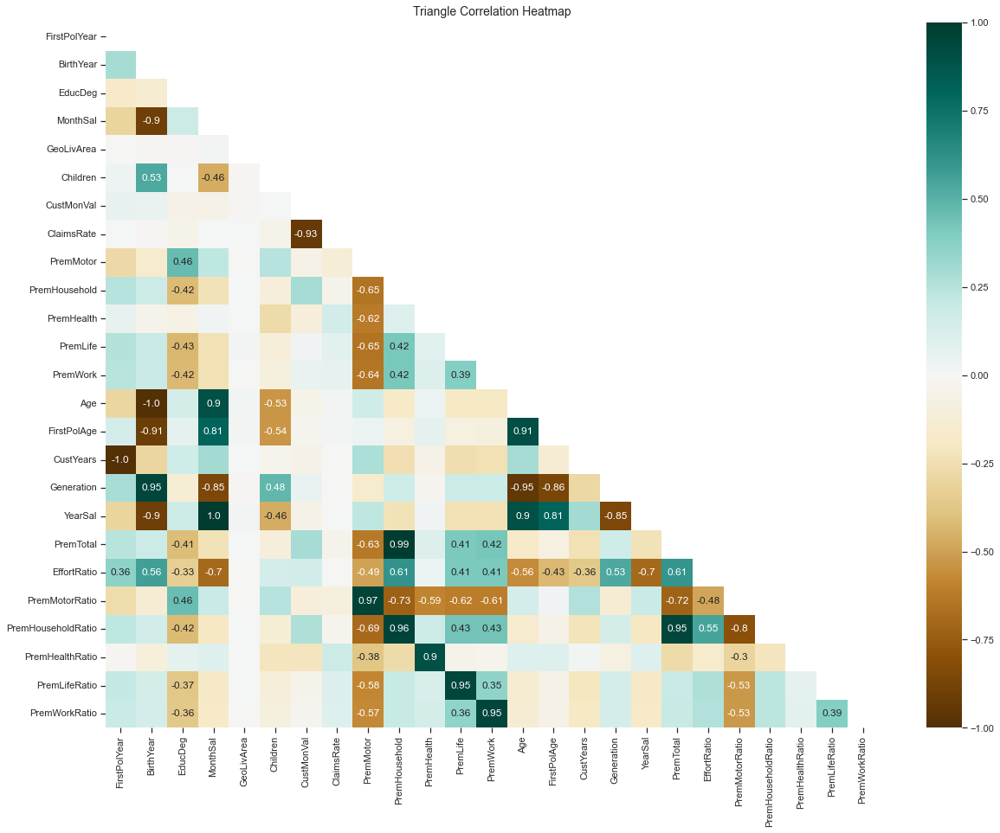

In [48]:
# correlation heatmap of features in the dataframe
# show value only for correlations higher than 0.4 or lower than -0.4
corr_heatmap(df, 0.3)

In [49]:
# remove perfetly redundant features from main dataframe
df.drop(columns = ["FirstPolYear", "BirthYear", "MonthSal"], inplace = True)

Metric features: ['CustMonVal', 'ClaimsRate', 'PremMotor', 'PremHousehold', 'PremHealth', 'PremLife', 'PremWork', 'Age', 'FirstPolAge', 'CustYears', 'YearSal', 'PremTotal', 'EffortRatio', 'PremMotorRatio', 'PremHouseholdRatio', 'PremHealthRatio', 'PremLifeRatio', 'PremWorkRatio']
Non-metric features: ['EducDeg', 'GeoLivArea', 'Children', 'Generation']


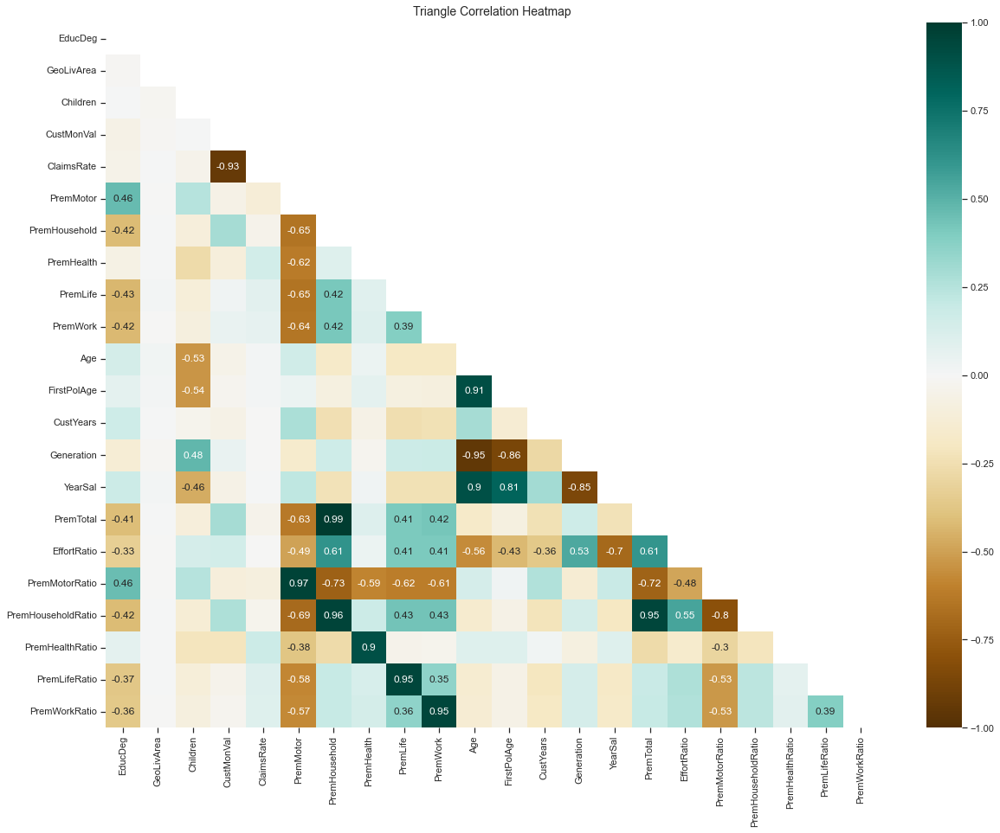

In [50]:
# correlation heatmap after updating features
corr_heatmap(df, 0.3)

# update metric and non-metric features
metric_features = list(df.columns.drop(["EducDeg", "GeoLivArea", "Children", "Generation"]))
non_metric_features = ["EducDeg", "GeoLivArea", "Children", "Generation"]

print("Metric features:", metric_features)
print("Non-metric features:", non_metric_features)

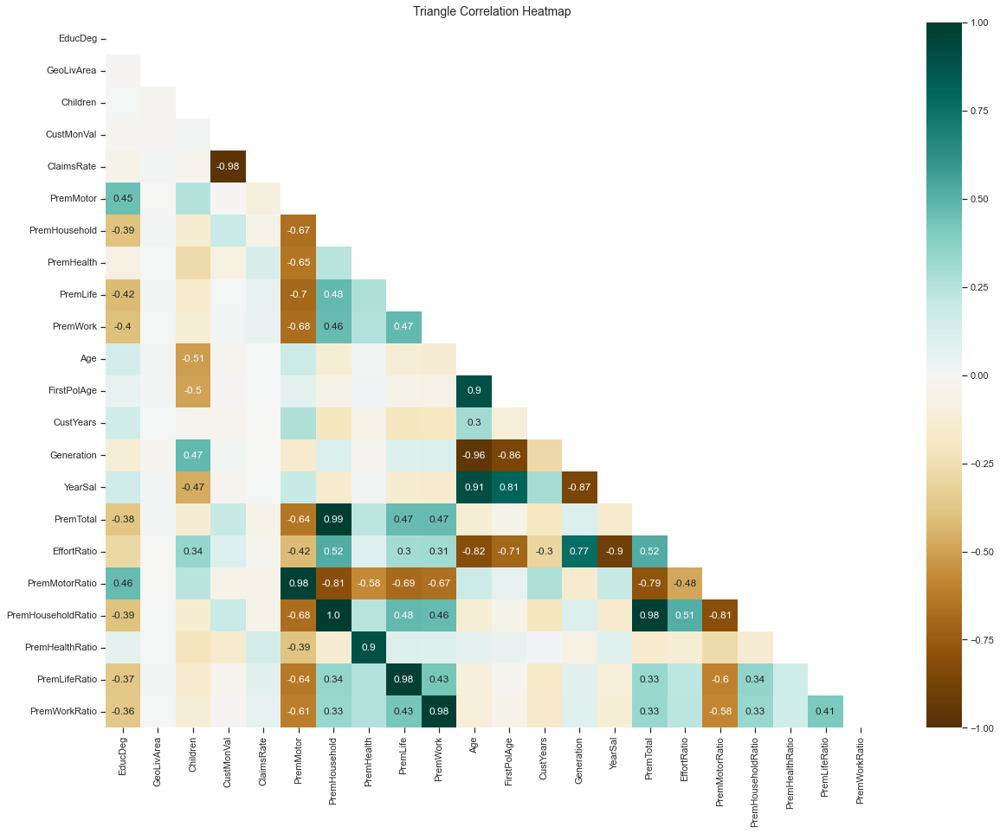

In [51]:
# correlation heatmap after updating features (spearman)
corr_heatmap(df, 0.3, "spearman")

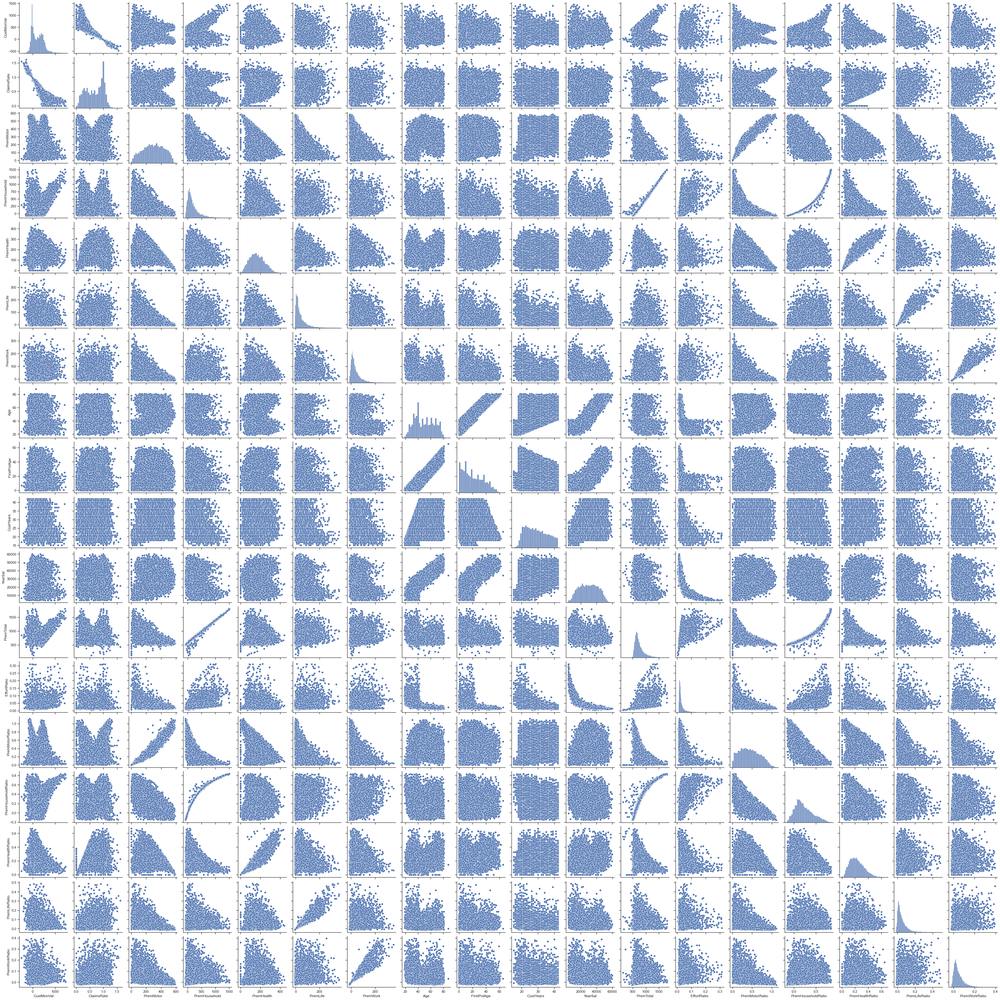

In [52]:
# pairplot of current (metric) features
sns.pairplot(df[metric_features])

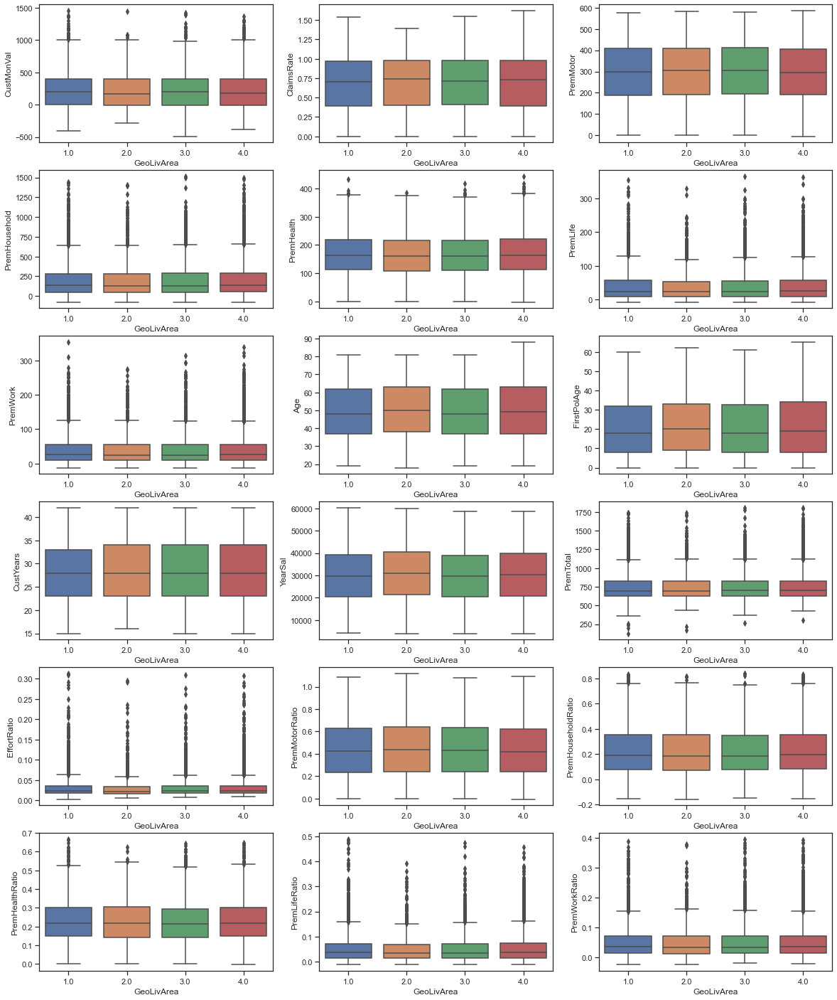

In [53]:
# Correlation heatmap hinted at GeoLivArea having no meaningful correlation with any of the features
# visual representation of GeoLivArea and its relation with other features
sns.set(style = "ticks")

fig, axes = plt.subplots(6, 3, figsize=(20, 25))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x = df["GeoLivArea"], y = df[feat], ax = ax)
    
plt.show()

# confirms that GeoLivArea appears to have no discriminative power

In [54]:
# remove GeoLivArea from the main dataframe
df.drop(columns = "GeoLivArea", inplace = True)

# remove GeoLivArea from df_outliers
df_outliers.drop(columns = "GeoLivArea", inplace = True)

In [55]:
# restructure and visualize the main dataframe before cluster analysis
df = restructure_df(df)
df.head()

,Generation,Age,YearSal,EducDeg,Children,FirstPolAge,CustYears,CMV,ClaimsRate,Motor,...,House,HouseRatio,Health,HealthRatio,Life,LifeRatio,Work,WorkRatio,PremTotal,EffortRatio
CustID,,,,,,,,,,,,,,,,,,,,,
1,4.0,34.0,26124.0,2.0,1.0,3.0,31.0,380.97,0.39,375.85,...,79.45,0.119373,146.36,0.219905,47.01,0.070632,16.89,0.025377,665.56,0.025477
2,4.0,35.0,8124.0,2.0,1.0,14.0,21.0,-131.13,1.12,77.46,...,416.20,0.456881,116.69,0.128096,194.48,0.213489,106.13,0.116503,910.96,0.112132
3,3.0,46.0,27324.0,1.0,0.0,21.0,25.0,504.67,0.28,206.15,...,224.50,0.303133,124.58,0.168215,86.35,0.116595,99.02,0.133702,740.60,0.027104
4,4.0,35.0,13188.0,3.0,1.0,9.0,26.0,-16.99,0.99,182.48,...,43.35,0.072168,311.17,0.518030,35.34,0.058833,28.34,0.047180,600.68,0.045547
5,3.0,43.0,21156.0,3.0,1.0,13.0,30.0,35.23,0.90,338.62,...,47.80,0.075965,182.59,0.290175,18.78,0.029846,41.45,0.065873,629.24,0.029743


In [56]:
# restructure and visualize the outliers dataframe before cluster analysis
df_outliers = restructure_df(df_outliers)
df_outliers.head()

,Generation,Age,YearSal,EducDeg,Children,FirstPolAge,CustYears,CMV,ClaimsRate,Motor,...,House,HouseRatio,Health,HealthRatio,Life,LifeRatio,Work,WorkRatio,PremTotal,EffortRatio
CustID,,,,,,,,,,,,,,,,,,,,,
9295,2.0,68.0,39216.0,3.0,0.0,51836.0,-51768.0,348.85,0.37,351.40,...,15.00,0.025253,187.37,0.315438,22.45,0.037795,17.78,0.029933,594.00,0.015147
5883,2.0,60.0,662580.0,2.0,1.0,39.0,21.0,122.25,0.79,281.83,...,147.25,0.207161,130.58,0.183708,84.46,0.118824,66.68,0.093810,710.80,0.001073
8262,4.0,35.0,413880.0,2.0,0.0,10.0,25.0,608.89,0.28,57.01,...,358.95,0.405062,195.26,0.220344,113.80,0.128419,161.14,0.181841,886.16,0.002141
52,3.0,50.0,38808.0,3.0,1.0,16.0,34.0,-14714.08,25.36,557.44,...,20.00,0.033167,29.56,0.049022,5.00,0.008292,-9.00,-0.014925,603.00,0.015538
113,3.0,37.0,28248.0,4.0,1.0,18.0,19.0,-8719.04,15.65,518.32,...,4.45,0.007499,55.90,0.094195,3.89,0.006555,10.89,0.018350,593.45,0.021009


<a class="anchor" id="preprocessing-scaling"></a>

<h3><right>2.6. Feature skewness</right></h3>

In [57]:
def transform_skewed_features(df, features, transformation):

    # create dataframe with the transformed features
    df_transformed = df.copy()

    for feat in features:
        # ensure all values are non-negative and apply square root transformation
        if transformation.lower() == "sqrt":
            df_transformed[feat] = np.sqrt(df_transformed[feat] + abs(df_transformed[feat].min()))

        # ensure all values are positive and apply log10 transformation
        if transformation.lower() == "log10":
            df_transformed[feat] = np.log10(df_transformed[feat] + abs(df_transformed[feat].min()) + 1)

    return df_transformed

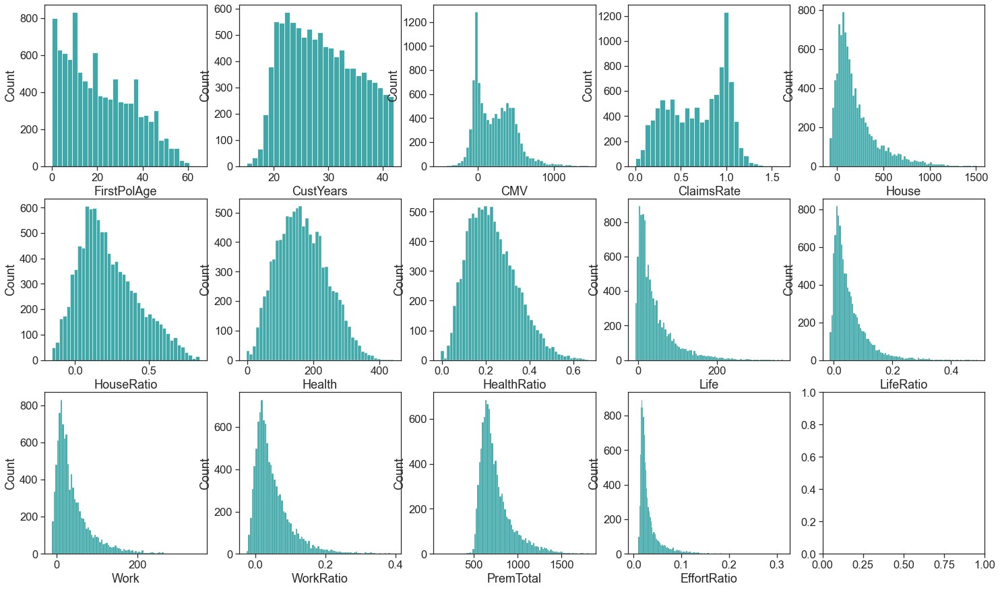

In [58]:
features = [
    "FirstPolAge",
    "CustYears",
    "CMV",
    "ClaimsRate",
    "House",
    "HouseRatio",
    "Health",
    "HealthRatio",
    "Life",
    "LifeRatio",
    "Work",
    "WorkRatio",
    "PremTotal",
    "EffortRatio"
]

# plot histogram of the potentially skewed metric features
plot_multiple(df, features, "histogram", [25, 15], nr_rows = 3)

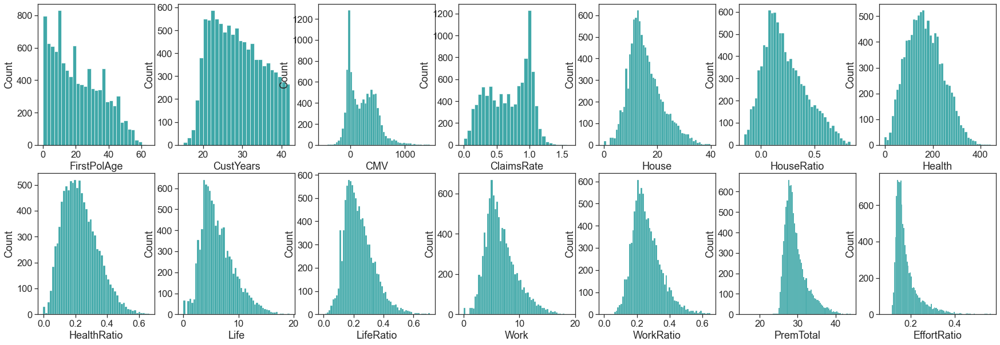

In [59]:
# list of skewed metric features
skewed_features = [
    "House",
    "Life",
    "LifeRatio",
    "Work",
    "WorkRatio",
    "PremTotal",
    "EffortRatio"
]

# apply transformation to the skewed features  (could maybe apply log10 to PremTotal alone???????????????????????)
# save transformed features (and the others) in a copy of the original dataframe to preserve original values
df_transformed = transform_skewed_features(df, skewed_features, transformation = "sqrt")

# plot histogram of transformed features
plot_multiple(df_transformed, features, "histogram", [30, 10], nr_rows = 2)

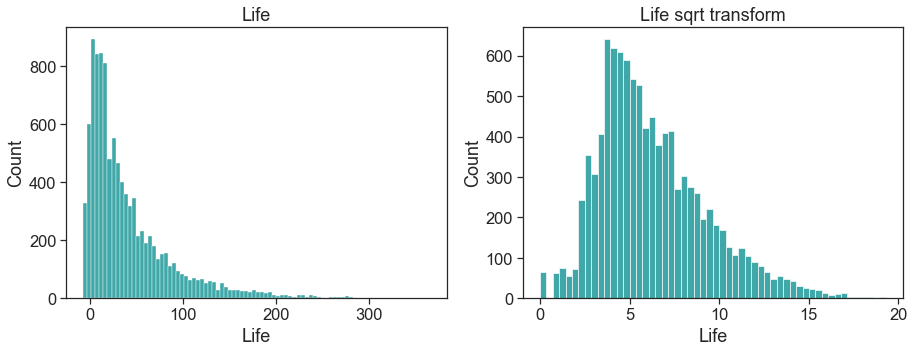

In [60]:
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))
ax1.title.set_text("Life")
ax2.title.set_text("Life sqrt transform")
sns.histplot(data=df_transformed.Life,ax=ax2,color = "darkcyan")
sns.histplot(data=df.Life,ax=ax1,color = "darkcyan")
plt.savefig('SkewTransformationLife.jpeg', dpi=300, bbox_inches='tight')

In [61]:
# seeing PremTotal and EffortRatio still had big right tails, decided to clip
df_transformed.EffortRatio = df_transformed.EffortRatio.clip(upper = 0.4)
df_transformed.PremTotal = df_transformed.PremTotal.clip(upper = 40)

In [62]:
# At this point there are 3 important dataframes
#  df             - original, not transformed values (no square root transformation of skewed features)
#  df_transformed - identical to df except that square root transformation was applied to skewed metric features
#  df_outliers    - all of the outliers removed from df

<a class="anchor" id="data-clustering"></a>

***

<h2><center>3. CLUSTERING</center></h2>

***

In [63]:
def data_scaler(df, scaler_name):

    '''
    Takes in a dataframe, df, and the name of the scaler,
    scaler_name, as arguments and applies the corresponding
    scaling method to the dataframe.

    Arguments:
     df (dataframe): dataframe without the target, y
     scaler_name (str): name of the scaler (minmax,
    standard, robust)

    Returns:
     df_scaled (dataframe): scaled version of the original df
    '''

    df_scaled = df.copy()
    features = list(df.columns)

    if scaler_name.lower() == "minmax":
        scaler = MinMaxScaler().fit(df)
        df_scaled[features] = scaler.transform(df)

    if scaler_name.lower() == "standard":
        scaler = StandardScaler().fit(df)
        df_scaled[features] = scaler.transform(df)

    if scaler_name.lower() == "robust":
        scaler = RobustScaler().fit(df)
        df_scaled[features] = scaler.transform(df)
    
    return (scaler, df_scaled)

In [64]:
def kmeans_clustering(df, k):

    '''
    Takes in a dataframe, df, and a number of clusters, k,
    and assigns rows of the dataframe to clusters based on
    the KMeans algorithm.

    Arguments:
     df (dataframe): dataframe
     k (int): number of clusters

    Returns:
     centroids (ndarray): center of each cluster
     labels (ndarray): label of each row indicating the
    cluster it was assigned to
    '''
    
    clusters = KMeans(
        n_clusters = k,
        init = "k-means++",
        random_state = 15
    ).fit(df)
    labels = clusters.labels_
    centroids = clusters.cluster_centers_

    return (centroids, labels)

In [65]:
def kprototypes_clustering(df, k, cat_index, init = "Huang"):

    clusters = KPrototypes(
        n_clusters = k,
        init = init,
        random_state = 15
    ).fit(df, categorical = cat_index)
    labels = clusters.labels_
    centroids = clusters.cluster_centroids_

    return (centroids, labels)

In [66]:
def hierarchical_clustering(df, n_clusters = None, threshold = 10000, affinity = "euclidean", linkage = "ward"):
    
    # determine clusters
    clusters = AgglomerativeClustering(
        n_clusters = n_clusters,
        affinity = affinity,
        linkage = linkage,
        distance_threshold = threshold
    ).fit(df)
    
    # retrieve cluster labels and distances
    labels = clusters.labels_
    distances = clusters.distances_
    
    counts = np.zeros(clusters.children_.shape[0])
    n_samples = len(labels)
    
    for i, merge in enumerate(clusters.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count
    
    linkage_matrix = np.column_stack([clusters.children_, distances, counts]).astype(float)
    
    return (distances, labels, linkage_matrix)

In [67]:
def db_scan(df, k):
    for eps in range(1,8):
        for min_samples in range(1,10):
            clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(df)
            print(set(clustering.labels_))
            if len(set(clustering.labels_))==k+1:
                return (None, clustering.labels_)
            if len(set(clustering.labels_))==2 or len(set(clustering.labels_))==1:
                return None
    return (None)


In [68]:
def plot_elbow(df, nmax_clusters, algorithm, cat_index = None, init = "Huang"):
    
    # store inertia values in a list
    y_vals = []
    
    # determine inertia for each number of clusters
    for n in np.arange(2, nmax_clusters + 1):
        if algorithm.lower() == "kmeans":
            km_clusters = KMeans(n_clusters = n, random_state = 15).fit(df)
            inertia = km_clusters.inertia_
            y_vals.append(inertia)

        if algorithm.lower() == "kprototypes":
            if type(cat_index) is int:
                cat_index = [cat_index]
            kp_clusters = KPrototypes(
                n_clusters = n,
                init = init,
                random_state = 15
            ).fit(df, categorical = cat_index)
            cost = kp_clusters.cost_
            y_vals.append(cost)
    
    # plot elbow graph
    sns.set_style("ticks")
    plt.subplots(figsize = (8, 6))
    sns.lineplot(x = np.arange(2, nmax_clusters + 1),
        y = y_vals,
        color = "k",
        marker = 'o',
        mew = 0,
        linewidth = 3)
    plt.title("Elbow plot", fontsize = 22)
    plt.xticks(fontsize = 14)
    plt.yticks(fontsize = 14)
    plt.xlim([0, nmax_clusters+1])
    plt.xlabel("Number of clusters, k", fontsize = 18)

    if algorithm.lower() == "kmeans":
        plt.ylabel("Inertia", fontsize = 18)
    elif algorithm.lower() == "kprototypes":
        plt.ylabel("Cost", fontsize = 18)

    return

In [69]:
# Adapted from the following link and DM practical class:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

def plot_silhouette(df, nmax_clusters):

    # Storing average silhouette metric
    avg_silhouette = []
    for nclus in np.arange(1, nmax_clusters + 1):
        # Skip nclus == 1
        if nclus == 1:
            continue
        
        # Create a figure
        fig = plt.figure(figsize=(13, 7))

        # Initialize the KMeans object with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
        cluster_labels = kmclust.fit_predict(df)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed clusters
        silhouette_avg = metrics.silhouette_score(df, cluster_labels)
        avg_silhouette.append(silhouette_avg)
        print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

        # Compute the silhouette scores for each sample
        sample_silhouette_values = metrics.silhouette_samples(df, cluster_labels)

        y_lower = 10
        for i in range(nclus):
            # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()
            
            # Get y_upper to demarcate silhouette y range size
            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i
            
            # Filling the silhouette
            color = cm.nipy_spectral(float(i) / nclus)
            plt.fill_betweenx(np.arange(y_lower, y_upper),
                            0, ith_cluster_silhouette_values,
                            facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        plt.title("The silhouette plot for the various clusters.")
        plt.xlabel("The silhouette coefficient values")
        plt.ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        plt.axvline(x=silhouette_avg, color="red", linestyle="--")
        
        # The silhouette coefficient can range from -1, 1
        xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
        plt.xlim([xmin, xmax])
        
        # The (nclus+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        plt.ylim([0, len(df) + (nclus + 1) * 10])

        plt.yticks([])  # Clear the yaxis labels / ticks
        plt.xticks(np.arange(xmin, xmax, 0.1))

    return

In [70]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    hierarchy.dendrogram(linkage_matrix, **kwargs)

    return

In [71]:
#takes in the results from one of the clustering algorithms and the data and presents the means
def summarise_clustering(df, labels, sort_by = None):

    df_temp = df.copy()
    df_temp["Cluster"] = labels

    # number of observations per cluster
    cluster_obs_num = pd.Series(df_temp.groupby("Cluster").size(), name = "obs")
    cluster_obs_pc = pd.Series(round(cluster_obs_num / df_temp.shape[0] * 100, 1), name = "%")
    cluster_size = pd.concat([cluster_obs_num, cluster_obs_pc], axis = 1)

    print("Cluster sizes:\n", cluster_size)

    # mean value of features for each cluster
    if sort_by == None:
        return df_temp.groupby("Cluster").mean()
    else:
        return df_temp.groupby("Cluster").mean().sort_values(sort_by)

In [72]:
def evaluate_clustering(df, labels):

    # remove points regarded as outliers
    df["Label"] = labels
    df_nonoise = df.loc[df["Label"] != -1]
    # update labels after removing outliers
    labels = df_nonoise["Label"]
    # drop Label column
    df_nonoise.drop(columns = "Label", inplace = True)

    # cluster metrics
    silhouette = metrics.silhouette_score(df_nonoise, labels, random_state = 15)
    dbs = metrics.davies_bouldin_score(df_nonoise, labels)
    chs = metrics.calinski_harabasz_score(df_nonoise, labels)

    print(
        f"Silhouette score: {round(silhouette, 2)}\n"
        f"Davies-Bouldin score: {round(dbs, 2)}\n"
        f"Calinski-Harabasz score: {round(chs, 2)}"
    )

    return

In [73]:
def visualize_clustering(df, labels, metric_features, categorical_features = None):

    temp_df = df.copy()
    temp_df["Label"] = labels

    for label in set(temp_df.Label):
        label_df = temp_df[temp_df.Label == label]

        fig, axes = plt.subplots(1, len(metric_features), figsize = [15, 4])

        for ax, feat in zip(axes.flatten(), metric_features):
            sns.histplot(
                data = label_df,
                x = feat,
                hue = "Label",
                alpha = 1,
                bins = 20,
                ax = ax,
            )

            ax.set_xlim([temp_df[feat].min()*0.9, temp_df[feat].max()*1.1])

    return

In [74]:
def get_ss_variables(df):
    """Get the SS for each variable
    """
    ss_vars = df.var() * (df.count() - 1)
    return ss_vars


def r2_variables(df, labels):
    """Get the R² for each variable
    """
    sst_vars = get_ss_variables(df)
    ssw_vars = np.sum(df.groupby(labels).apply(get_ss_variables))
    return 1 - ssw_vars/sst_vars

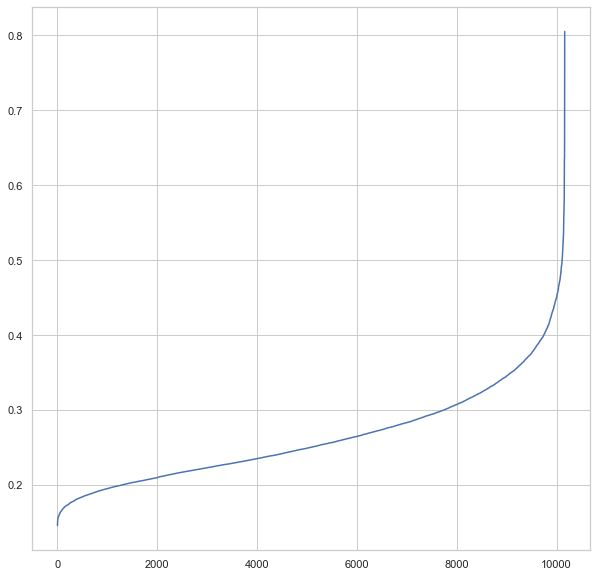

Counter({0: 10072, -1: 92})

In [75]:
# detecting outliers using DBSCAN
# only removed outliers based on univariate analysis so far
metric_features = [
    "Age",
    "YearSal",
    "FirstPolAge",
    "CustYears",
    "CMV",
    # "ClaimsRate", 
    "Motor", 
    "House", 
    "Health", 
    "Life", 
    "Work", 
    "PremTotal", 
    "EffortRatio"
]

df_temp = df_transformed[metric_features]
scaler, df_temp_scaled = data_scaler(df_temp, "minmax")

sns.set(style = "whitegrid")
plt.subplots(figsize = (10, 10))
neigh = NearestNeighbors(n_neighbors=30)
neigh.fit(df_temp_scaled)
distances, _ = neigh.kneighbors(df_temp_scaled)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

dbscan = DBSCAN(eps=0.36, min_samples=30, n_jobs=-1)
dbscan_labels = dbscan.fit_predict(df_temp_scaled)

# overview of the cluster
Counter(dbscan_labels)

In [76]:
# add outliers (92, as per DBSCAN) to df_outliers
df["Label"] = dbscan_labels
df_outliers = pd.concat([df_outliers, df[(df.Label == -1)].drop(columns = "Label")])

# remove outliers from df and df_transformed
df_transformed["Label"] = dbscan_labels

df = df[~(df.Label == -1)].drop(columns = "Label")
df_transformed = df_transformed[~(df_transformed.Label == -1)].drop(columns = "Label")

# drop Label columns
# df.drop(columns = "Label")
# df_transformed.drop(columns = "Label")

In [77]:
# update metric and non-metric features
metric_features = df.columns.drop(["EducDeg", "Children", "Generation"])
non_metric_features = ["EducDeg", "Children", "Generation"]

# compute total number of observations removed
nr_rows_removed = initial_len - len(df)
pc_rows_removed = round((nr_rows_removed / initial_len) * 100, 2)

print(
    f"Total number of observations removed: {nr_rows_removed} ({pc_rows_removed}%)\n"
    f"Final number of observations: {df.shape[0]} ({100 - pc_rows_removed}%)\n"
    f"Current number of features: {df.shape[1]}\n"
    "Features:",
    list(df.columns)
)

Total number of observations removed: 221 (2.15%)
Final number of observations: 10072 (97.85%)
Current number of features: 21
Features: ['Generation', 'Age', 'YearSal', 'EducDeg', 'Children', 'FirstPolAge', 'CustYears', 'CMV', 'ClaimsRate', 'Motor', 'MotorRatio', 'House', 'HouseRatio', 'Health', 'HealthRatio', 'Life', 'LifeRatio', 'Work', 'WorkRatio', 'PremTotal', 'EffortRatio']


<a class="anchor" id="clustering-sociodemographic"></a>

<h3><right>3.1. Sociodemographic clustering</right></h3>

In [78]:
# All sociodemographic features - Generation, Age, YearSal, EducDeg, Children
# Age, YearSal, Generation -> highly correlated, YearSal considered to be safer since we swapped BithYear and FirstPolYear earlier
# YearSal also has higher cardinality which is often advantageous
# Age highly correlated with Generation, YearSal - very identical clusters, decided to use Age
df_sociodem = df[["Generation", "Age", "YearSal", "EducDeg", "Children"]]

#### 3.1.1. KMeans (YearSal, EducDeg)

Silhouette score: 0.47
Davies-Bouldin score: 0.82
Calinski-Harabasz score: 10253.07
Cluster sizes:
           obs     %
Cluster            
0        2688  26.7
1        2378  23.6
2        2742  27.2
3        2264  22.5


,YearSal,EducDeg
Cluster,,
1,18008.774199,1.649285
2,22329.981303,3.122174
3,39288.104861,1.837014
0,40792.330617,3.131696


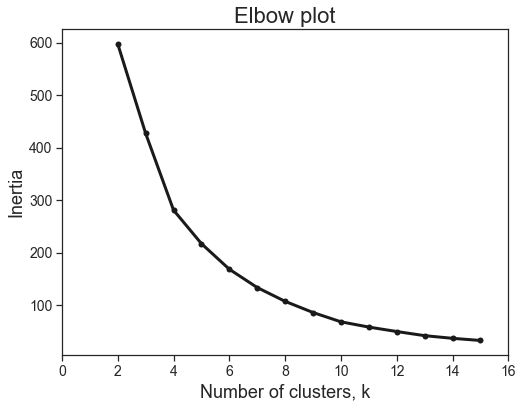

In [79]:
# scaling dataframe
# for KMeans, despite low cardinality, EducDeg was used as it an ordinal variable
km_sociodem = df_sociodem[["YearSal", "EducDeg"]]
minmax_scaler, km_sociodem_minmax = data_scaler(km_sociodem, "minmax")
standard_scaler, km_sociodem_standard = data_scaler(km_sociodem, "standard")

# # choose number of clusters
plot_elbow(km_sociodem_minmax, 15, "kmeans") 
# plot_silhouette(km_sociodem, 15)

# get cluster centroids and labels
km_sociodem_centroids, km_sociodem_labels = kmeans_clustering(km_sociodem_minmax, 4)

# cluster overview
df["Label"] = km_sociodem_labels
evaluate_clustering(km_sociodem_minmax, df.Label)
summarise_clustering(km_sociodem, df.Label, "YearSal")

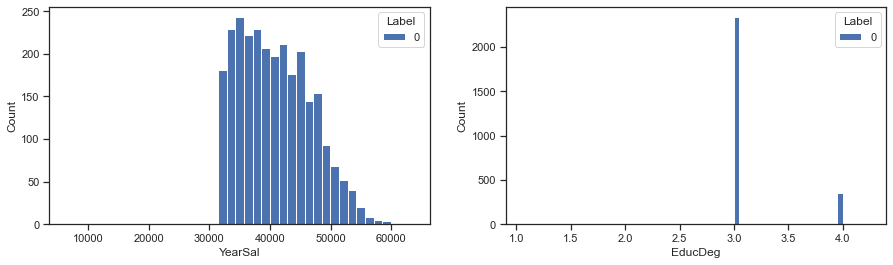

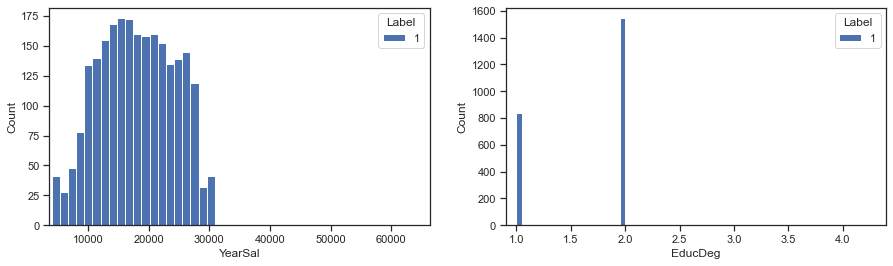

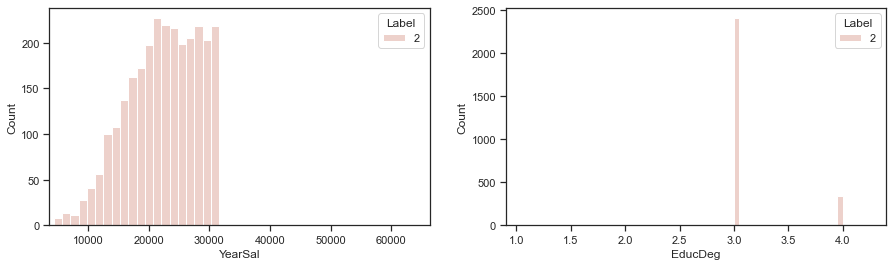

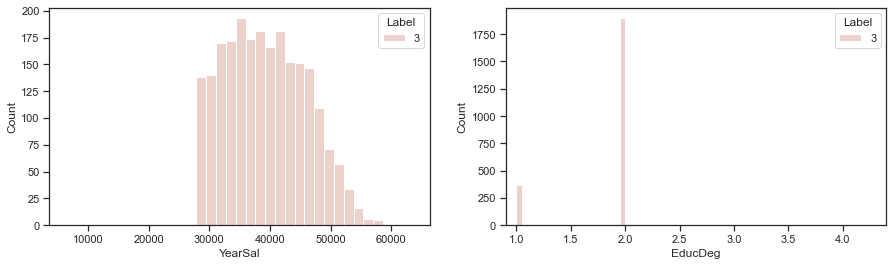

In [80]:
visualize_clustering(km_sociodem, df.Label, ["YearSal", "EducDeg"])

#### 3.1.2. KMeans + Hierarchical (YearSal, EducDeg)

Silhouette score: 0.44
Davies-Bouldin score: 0.94
Calinski-Harabasz score: 8639.28
Cluster sizes:
           obs     %
Cluster            
0        2594  25.8
1        2566  25.5
2        2076  20.6
3        2836  28.2


,YearSal,EducDeg
Cluster,,
2,16871.200889,1.592004
0,23421.149088,3.265613
1,37704.022371,1.861263
3,38830.794323,3.000000


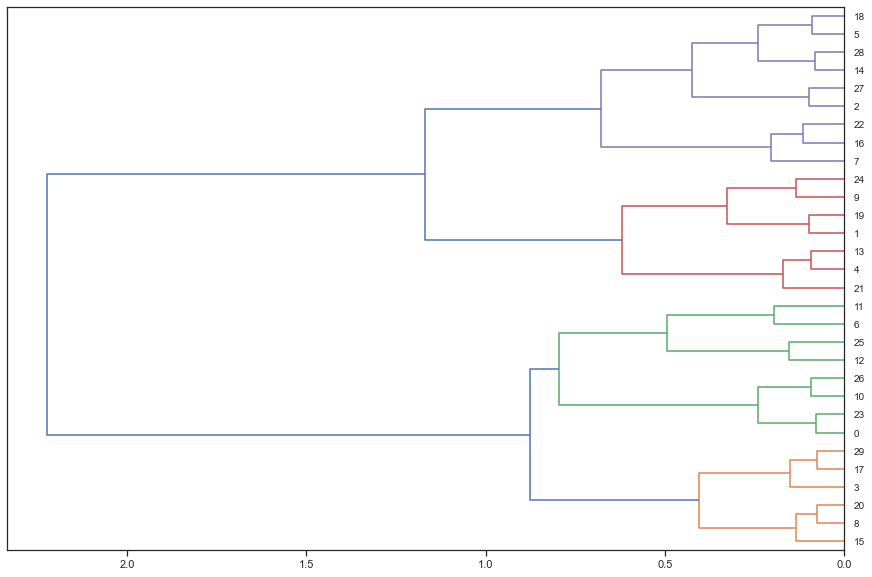

In [81]:
# scale data
km_sociodem = df_sociodem[["YearSal", "EducDeg"]]
minmax_scaler, km_sociodem_minmax = data_scaler(km_sociodem, "minmax")
standard_scaler, km_sociodem_standard = data_scaler(km_sociodem, "standard")

# get cluster centroids and labels
km_sociodem_centroids, km_sociodem_labels = kmeans_clustering(km_sociodem_minmax, 30)

# add labels obtained with KMeans to main df
df["Label"] = km_sociodem_labels

# plot dendrogram with centroid clusters
sns.set(style = "ticks")
plt.subplots(figsize = (15, 10))
km_sociodem_linkage = hierarchy.linkage(km_sociodem_centroids, method = "ward")
hierarchy.dendrogram(
    km_sociodem_linkage,
    orientation = "left",
    color_threshold = 0.85
)

# hierarchical clustering of the centroids obtained
hc_sociodem_clusters = AgglomerativeClustering(n_clusters = 4, affinity = "euclidean", linkage = "ward").fit(km_sociodem_centroids)
hc_sociodem_labels = pd.Series(hc_sociodem_clusters.labels_, name = "hc_label")

# obtain dataframe with centroids (pre-scaling) and labels
km_sociodem_centroids = pd.DataFrame(minmax_scaler.inverse_transform(km_sociodem_centroids), columns = ["YearSal", "EducDeg"])
km_sociodem_centroids = pd.concat([km_sociodem_centroids, hc_sociodem_labels], axis = 1)

# iterate through labels in df and replace with label from AgglomerativeClustering
label_col_index = df.columns.get_loc("Label")
hclabel_col_index = km_sociodem_centroids.columns.get_loc("hc_label")
for i in np.arange(0, len(df)):
    df.iloc[i, label_col_index] = km_sociodem_centroids.iloc[df.iloc[i, label_col_index], hclabel_col_index]

# cluster overview
evaluate_clustering(km_sociodem_minmax, df.Label)
summarise_clustering(km_sociodem, df.Label, "YearSal")

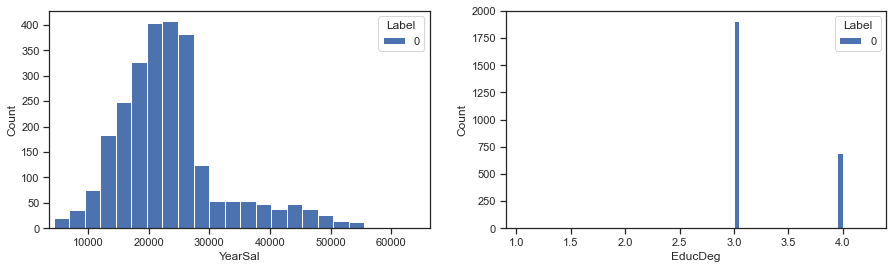

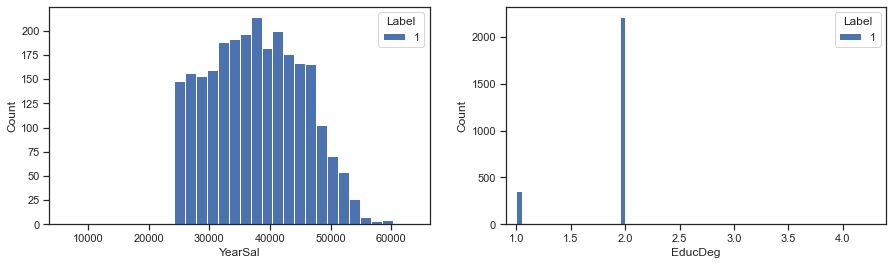

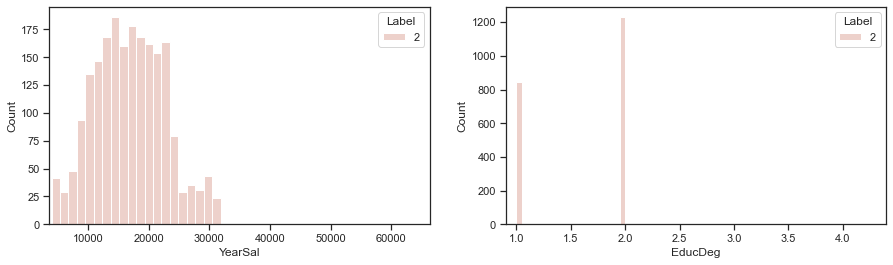

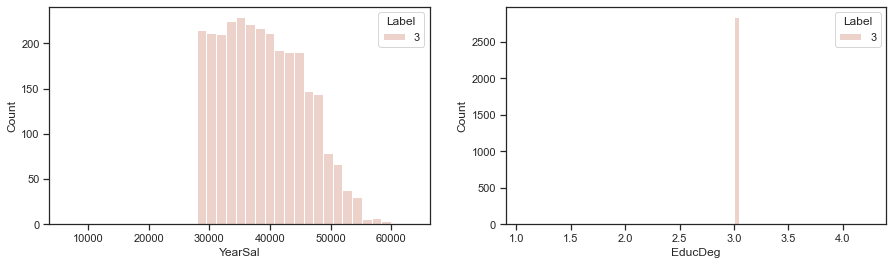

In [82]:
visualize_clustering(km_sociodem, df.Label, ["YearSal", "EducDeg"])

#### 3.1.3. Hierarchical (YearSal, EducDeg)

Silhouette score: 0.42
Davies-Bouldin score: 0.83
Calinski-Harabasz score: 8329.31
Cluster sizes:
           obs     %
Cluster            
0        3049  30.3
1        3579  35.5
2        1593  15.8
3        1851  18.4


,YearSal,EducDeg
Cluster,,
0,20998.180643,1.718924
1,25667.778738,3.192512
2,42529.618123,1.782800
3,42686.987211,3.000000


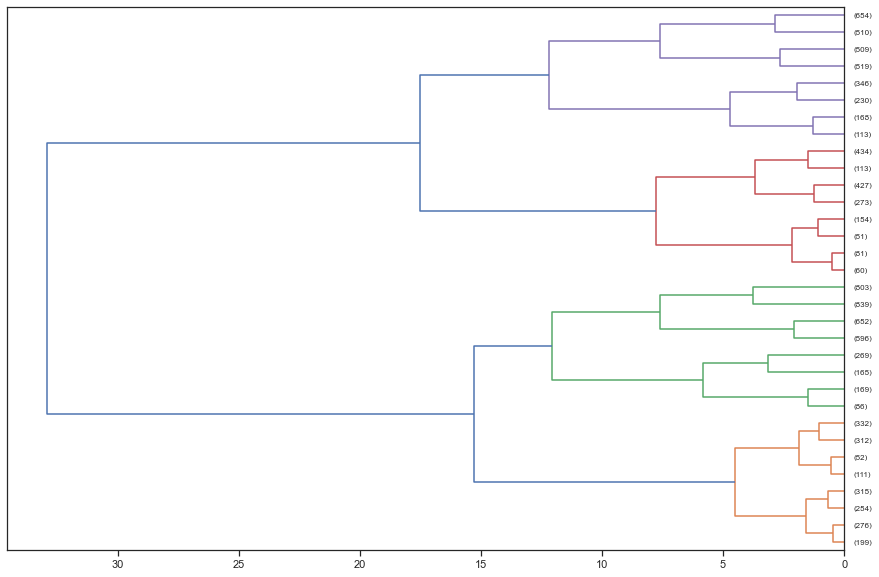

In [83]:
# scale data
hc_sociodem = df_sociodem[["YearSal", "EducDeg"]]
minmax_scaler, hc_sociodem_minmax = data_scaler(hc_sociodem, "minmax")
standard_scaler, hc_sociodem_standard = data_scaler(hc_sociodem, "standard")

# visualize dendrogram
hc_sociodem_distances, hc_sociodem_labels, hc_sociodem_linkage = hierarchical_clustering(
    hc_sociodem_minmax, 
    n_clusters = None, 
    threshold = 0, 
    affinity = "euclidean", 
    linkage = "ward"
)

sns.set(style = "ticks")
plt.subplots(figsize = (15, 10))
hierarchy.dendrogram(
    hc_sociodem_linkage,
    orientation = "left",
    p = 4,
    truncate_mode = "level",
    color_threshold = 15
)

# perform AgglomerativeClustering
hc_sociodem_clusters = AgglomerativeClustering(n_clusters = 4, affinity = "euclidean", linkage = "ward").fit(hc_sociodem_minmax)
hc_sociodem_labels = hc_sociodem_clusters.labels_

# overview of the clusters
df["Label"] = hc_sociodem_labels
evaluate_clustering(hc_sociodem_minmax, df.Label)
summarise_clustering(hc_sociodem, df.Label, "YearSal")

#### 3.1.4. DBSCAN (YearSal, EducDeg)

In [84]:
# scale data
db_sociodem = df_sociodem[["YearSal", "EducDeg"]]
minmax_scaler, db_sociodem_minmax = data_scaler(db_sociodem, "minmax")
standard_scaler, db_sociodem_standard = data_scaler(db_sociodem, "standard")

# # find possible values for eps
# for eps in np.arange(0.05, 0.41, 0.05):
#     db_sociodem_clusters = DBSCAN(eps = eps).fit(db_sociodem_minmax)
#     print(f"Clusters with eps = {round(eps, 2)}: {set(db_sociodem_clusters.labels_)}")

# get clusters and labels based on selected eps
db_sociodem_clusters = DBSCAN(eps = 0.20).fit(db_sociodem_minmax)
db_sociodem_labels = db_sociodem_clusters.labels_

# overview of the cluster
df["Label"] = db_sociodem_labels
evaluate_clustering(db_sociodem_minmax, df.Label)
summarise_clustering(db_sociodem, df.Label, "YearSal")

Silhouette score: 0.45
Davies-Bouldin score: 1.05
Calinski-Harabasz score: 5692.73
Cluster sizes:
           obs     %
Cluster            
0        3439  34.1
1        1203  11.9
2        4741  47.1
3         689   6.8


,YearSal,EducDeg
Cluster,,
1,24163.555193,1.0
0,29864.605278,2.0
2,31391.472987,3.0
3,32005.253991,4.0


#### 3.1.5. KPrototypes (YearSal, EducDeg, Children)

In [85]:
# kprototypes: https://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.15.4028&rep=rep1&type=pdf

# scale data
kp_sociodem = df_sociodem[["YearSal", "EducDeg", "Children"]]
minmax_scaler, kp_sociodem_minmax = data_scaler(kp_sociodem, "minmax")
standard_scaler, kp_sociodem_standard = data_scaler(kp_sociodem, "standard")

# # elbow plot
# # suggests 3-6 clusters
# plot_elbow(kp_sociodem_minmax, nmax_clusters = 10, algorithm = "kprototypes", cat_index = [1, 2])

# compute centroids and labels with k = 4
kp_sociodem_centroids, kp_sociodem_labels = kprototypes_clustering(kp_sociodem_minmax, k = 6, cat_index = [1, 2], init = "Huang")

# cluster overview
df["Label"] = kp_sociodem_labels
evaluate_clustering(kp_sociodem_minmax, kp_sociodem_labels)
summarise_clustering(kp_sociodem, df.Label, sort_by = "YearSal")

Silhouette score: 0.32
Davies-Bouldin score: 1.53
Calinski-Harabasz score: 4593.87
Cluster sizes:
           obs     %
Cluster            
0        1996  19.8
1        1111  11.0
2        1859  18.5
3        1473  14.6
4        2631  26.1
5        1002   9.9


,YearSal,EducDeg,Children
Cluster,,,
5,17878.682070,1.266467,0.836327
0,20435.739846,3.036072,0.932866
4,24880.861763,2.107184,0.937666
2,36169.668809,3.008069,1.000000
1,42359.299958,2.072907,0.095410
3,43574.614966,2.913781,0.000000


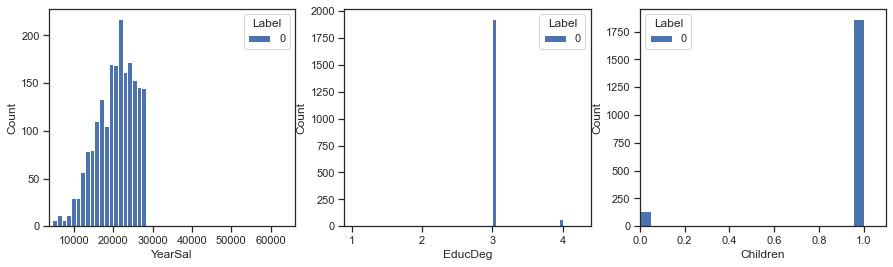

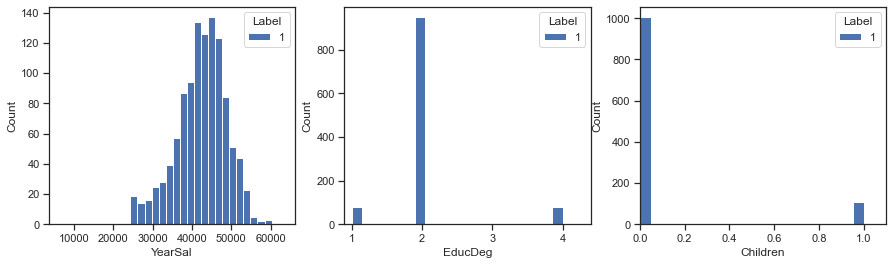

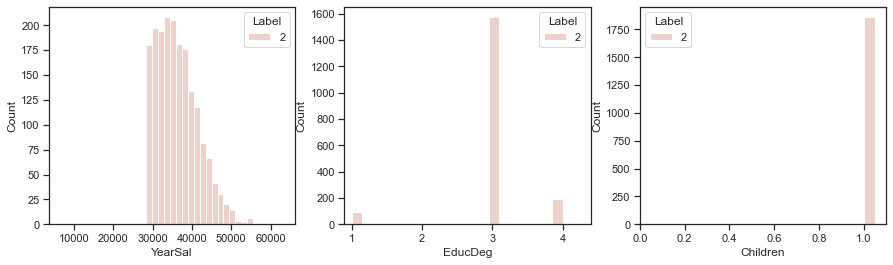

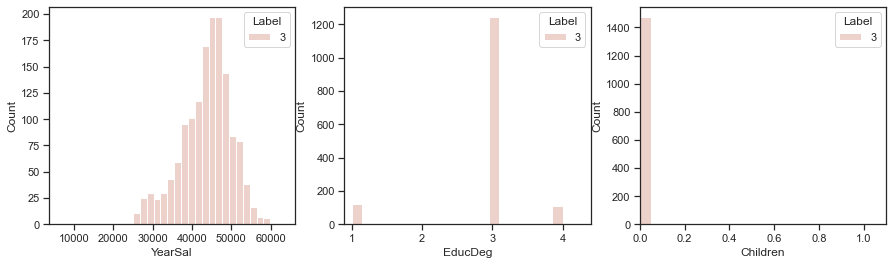

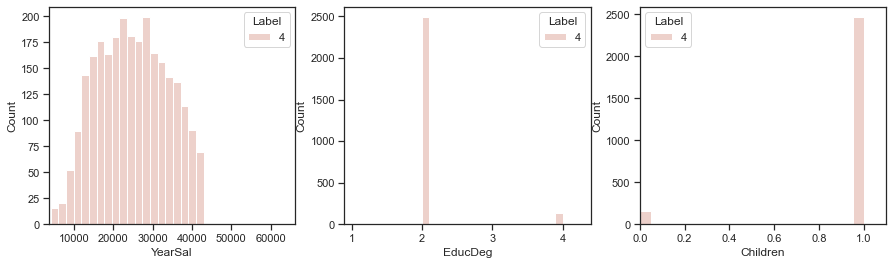

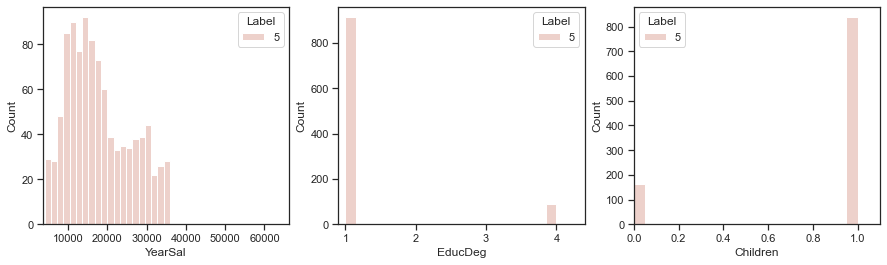

In [86]:
visualize_clustering(kp_sociodem, df.Label, ["YearSal", "EducDeg", "Children"])

#### 3.1.6. Birch (YearSal, EducDeg)

In [87]:
# scale data
birch_sociodem = df_sociodem[["YearSal", "EducDeg"]]
minmax_scaler, birch_sociodem_minmax = data_scaler(birch_sociodem, "minmax")
standard_scaler, birch_sociodem_standard = data_scaler(birch_sociodem, "standard")
robust_scaler, birch_sociodem_robust = data_scaler(birch_sociodem, "robust")

# # find suitable threshold values
# for t in np.arange(0.01, 0.50, 0.05):
#     birch_sociodem_clusters = Birch(threshold = t).fit(birch_sociodem_minmax)
#     birch_sociodem_labels = birch_sociodem_clusters.labels_
#     print(t)
#     print(set(birch_sociodem_labels))

# obtain clusters and labels
birch_sociodem_clusters = Birch(threshold = 0.20).fit(birch_sociodem_minmax)
birch_sociodem_labels = birch_sociodem_clusters.labels_

# overview of the clusters
df["Label"] = birch_sociodem_labels
evaluate_clustering(birch_sociodem_minmax, df.Label)
summarise_clustering(df, df.Label, "CMV")

Silhouette score: 0.31
Davies-Bouldin score: 0.86
Calinski-Harabasz score: 3851.82
Cluster sizes:
           obs     %
Cluster            
0        1203  11.9
1        8180  81.2
2         689   6.8


,Generation,Age,YearSal,EducDeg,Children,FirstPolAge,CustYears,CMV,ClaimsRate,Motor,...,HouseRatio,Health,HealthRatio,Life,LifeRatio,Work,WorkRatio,PremTotal,EffortRatio,Label
Cluster,,,,,,,,,,,,,,,,,,,,,
2,2.522496,51.853411,32005.253991,4.000000,0.702467,22.449927,29.403483,207.431785,0.641785,398.397083,...,0.098271,144.410479,0.220841,15.217663,0.022831,15.279071,0.022573,647.017286,0.023434,2.0
1,2.610391,50.332885,30749.553910,2.579584,0.709169,21.574083,28.758802,210.448466,0.681425,309.363034,...,0.209597,170.622963,0.237058,36.436265,0.047680,35.561160,0.046590,733.726363,0.029572,1.0
0,3.001663,43.236076,24163.555193,1.000000,0.704073,17.960931,25.275145,263.999052,0.695636,172.100989,...,0.389472,164.345544,0.196791,86.009410,0.095873,83.998645,0.092706,913.815852,0.058293,0.0


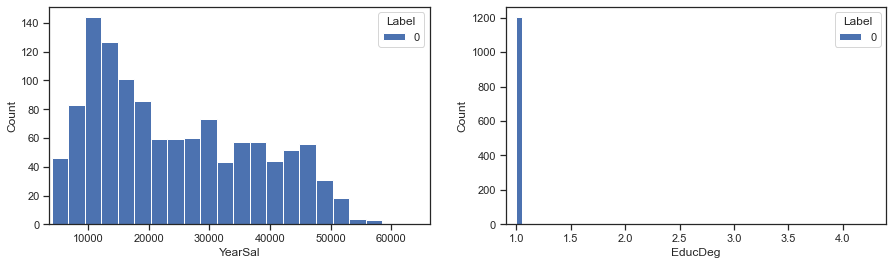

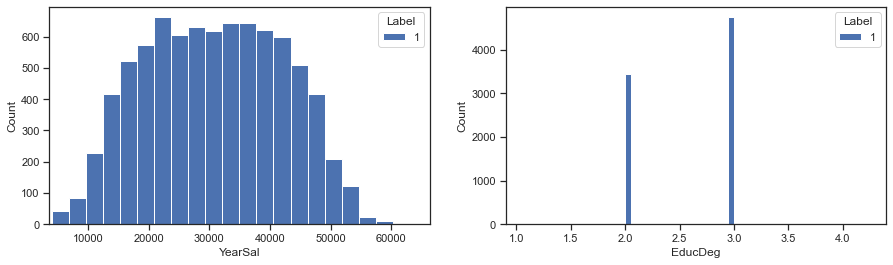

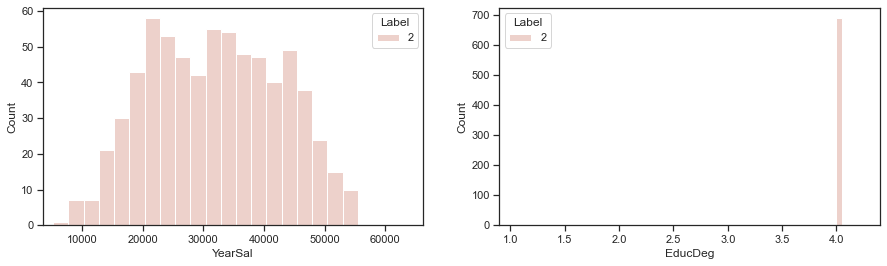

In [88]:
visualize_clustering(birch_sociodem, birch_sociodem_labels, ["YearSal", "EducDeg"])

#### Sociodemographic: visual representations

In [89]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None, save_fig = "no", fig_name = None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels).set_visible(False) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)

    if save_fig == "yes":
        plt.savefig(fig_name + '.jpeg', dpi=300, bbox_inches='tight')

    plt.show()

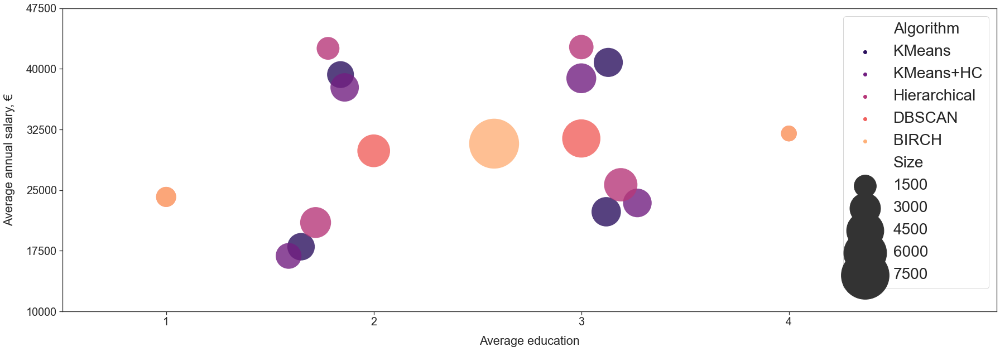

In [90]:
# graphical representation of discarded solutions
sociodem_kmeans_res = (
    ("KMeans", 2688, 40792, 3.13),
    ("KMeans", 2378, 18009, 1.65),
    ("KMeans", 2742, 22330, 3.12),
    ("KMeans", 2264, 39288, 1.84)
)
sociodem_kmeanshc_res = (
    ("KMeans+HC", 2594, 23421, 3.27),
    ("KMeans+HC", 2566, 37704, 1.86),
    ("KMeans+HC", 2076, 16871, 1.59),
    ("KMeans+HC", 2836, 38831, 3.00)
)
sociodem_hc_res = (
    ("Hierarchical", 3049, 20998, 1.72),
    ("Hierarchical", 3579, 25668, 3.19),
    ("Hierarchical", 1593, 42530, 1.78),
    ("Hierarchical", 1851, 42687, 3.00)
)
sociodem_dbscan_res = (
    ("DBSCAN", 3439, 29865, 2.0),
    ("DBSCAN", 1203, 24164, 1.0),
    ("DBSCAN", 4741, 31391, 3.0),
    ("DBSCAN", 689, 32005, 4.0)
)
sociodem_birch_res = (
    ("BIRCH", 1203, 24164, 1.0),
    ("BIRCH", 8180, 30750, 2.58),
    ("BIRCH", 689, 32005, 4.0)
)

sociodem_kmeans_res = pd.DataFrame(sociodem_kmeans_res).rename(columns = {0: "Algorithm", 1: "Size", 2: "Salary", 3: "Education"})
sociodem_kmeanshc_res = pd.DataFrame(sociodem_kmeanshc_res).rename(columns = {0: "Algorithm", 1: "Size", 2: "Salary", 3: "Education"})
sociodem_hc_res = pd.DataFrame(sociodem_hc_res).rename(columns = {0: "Algorithm", 1: "Size", 2: "Salary", 3: "Education"})
sociodem_dbscan_res = pd.DataFrame(sociodem_dbscan_res).rename(columns = {0: "Algorithm", 1: "Size", 2: "Salary", 3: "Education"})
sociodem_birch_res = pd.DataFrame(sociodem_birch_res).rename(columns = {0: "Algorithm", 1: "Size", 2: "Salary", 3: "Education"})

all_sociodem_res = pd.concat([sociodem_kmeans_res, sociodem_kmeanshc_res, sociodem_hc_res, sociodem_dbscan_res, sociodem_birch_res], axis = 0)
all_sociodem_res.reset_index(drop = True, inplace = True)

# cluster graphical representation
sns.set(style = "ticks", font_scale = 1.8)

fig, axes = plt.subplots(figsize = [30, 10])
axes = sns.scatterplot(
    data = all_sociodem_res,
    x = "Education",
    y = "Salary",
    size = "Size",
    sizes = (800, 8000),
    hue = "Algorithm",
    palette = "magma",
    alpha = 0.8,
    linewidth = 0
)

plt.ylabel("Average annual salary, €", labelpad = 20)
plt.xlabel("Average education", labelpad = 15)
plt.ylim([10000, 47500])
plt.yticks(np.arange(10000, 47501, 7500))
plt.xlim([0.5, 5])
plt.xticks([1, 2, 3, 4])

plt.legend(loc=0, prop={'size': 28})
# plt.legend("Size").set_visible(False)

plt.savefig('SociodemClusterComparison.jpeg', dpi=300, bbox_inches='tight')

<a class="anchor" id="clustering-sociodemographic"></a>

<h3><right>3.2. Value clustering</right></h3>

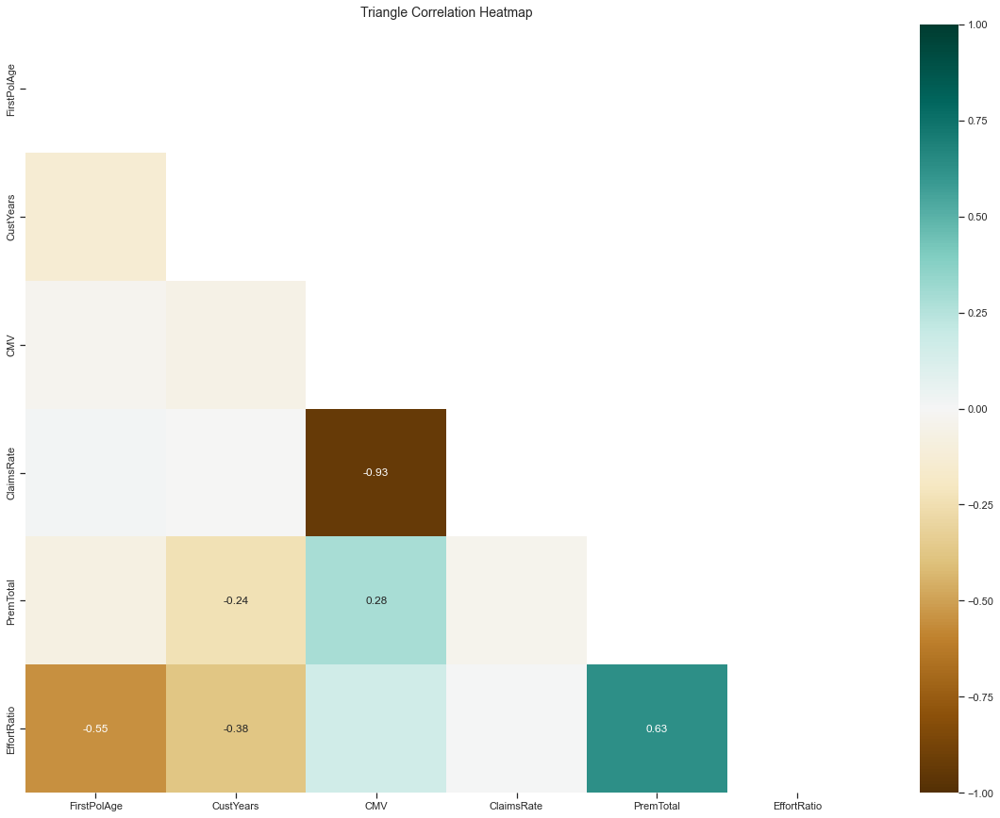

In [91]:
# potentially relevant features for customer segmentation based on value
df_value = df_transformed[[
    "FirstPolAge",
    "CustYears",
    "CMV",
    "ClaimsRate",
    "PremTotal",
    "EffortRatio"
]]

corr_heatmap(df_value, 0.2, "pearson")

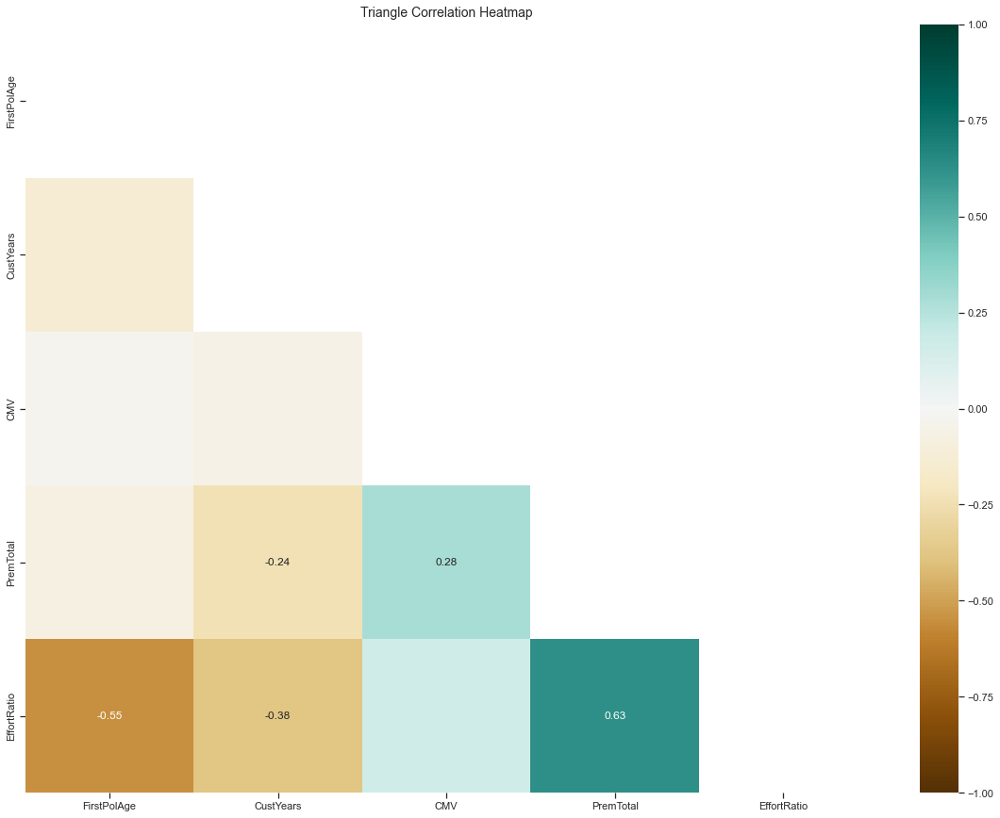

In [92]:
# ClaimsRate and CMV are highly correlated with each other but have no correlation with anything else - discarded
# features for customer segmentation based on value
df_value = df_transformed[[
    "FirstPolAge",
    "CustYears",
    "CMV",
    "PremTotal",
    "EffortRatio"
]]
corr_heatmap(df_value, 0.2, "pearson")

#### 3.2.1. KMeans (FirstPolAge, PremTotal, EffortRatio)

In [93]:
# scale data
km_value = df_value[["FirstPolAge", "PremTotal", "EffortRatio"]]
minmax_scaler, km_value_minmax = data_scaler(km_value, "minmax")
standard_scaler, km_value_standard = data_scaler(km_value, "standard")
robust_scaler, km_value_robust = data_scaler(km_value, "robust")

# elbow plot
# plot_elbow(km_value_standard, 20, "kmeans")

# get cluster centroids and labels
km_value_centroids, km_value_labels = kmeans_clustering(km_value_standard, 6)

# cluster overview
df["Label"] = km_value_labels
evaluate_clustering(km_value_standard, df.Label)
summarise_clustering(km_value, df.Label, sort_by = "FirstPolAge")

Silhouette score: 0.33
Davies-Bouldin score: 0.91
Calinski-Harabasz score: 8099.45
Cluster sizes:
           obs     %
Cluster            
0        2517  25.0
1        1841  18.3
2         679   6.7
3        1513  15.0
4        1066  10.6
5        2456  24.4


,FirstPolAge,PremTotal,EffortRatio
Cluster,,,
3,7.744878,31.177921,0.232517
0,7.964640,27.750931,0.178603
2,9.547865,35.909586,0.323186
5,24.206433,27.764126,0.150566
4,34.705441,32.687263,0.164272
1,42.833243,28.362672,0.138066


In [94]:
# CMV has little importance for clustering using KMeans
r2_variables(df[["FirstPolAge","PremTotal", "EffortRatio", "Label"]], 'Label').drop("Label")

FirstPolAge    0.840768
PremTotal      0.732855
EffortRatio    0.728566
dtype: float64

#### 3.2.2. KMeans (PremTotal, EffortRatio)

Silhouette score: 0.36
Davies-Bouldin score: 0.92
Calinski-Harabasz score: 8230.95
Cluster sizes:
           obs     %
Cluster            
0        2800  27.8
1        1843  18.3
2        1184  11.8
3         766   7.6
4        3479  34.5


,FirstPolAge,PremTotal,EffortRatio
Cluster,,,
1,7.229517,30.534168,0.224430
3,9.497389,35.642649,0.317161
4,13.142857,27.567314,0.165621
2,34.945101,32.494424,0.163368
0,37.804643,28.105738,0.140600


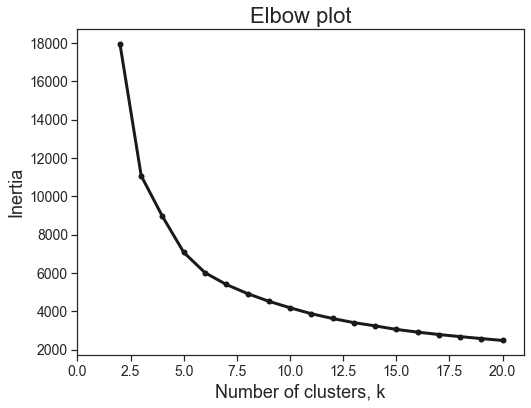

In [95]:
# scale data
km_value = df_value[["FirstPolAge", "PremTotal", "EffortRatio"]]
minmax_scaler, km_value_minmax = data_scaler(km_value, "minmax")
standard_scaler, km_value_standard = data_scaler(km_value, "standard")
robust_scaler, km_value_robust = data_scaler(km_value, "robust")

# elbow plot
plot_elbow(km_value_standard, 20, "kmeans")

# get cluster centroids and labels
km_value_centroids, km_value_labels = kmeans_clustering(km_value_standard, 5)

# cluster overview
df["Label"] = km_value_labels
evaluate_clustering(km_value_standard, df.Label)
summarise_clustering(km_value, df.Label, sort_by = "FirstPolAge")

In [96]:
r2_variables(df[["FirstPolAge", "PremTotal", "EffortRatio", "Label"]], 'Label').drop("Label")

FirstPolAge    0.751981
PremTotal      0.723192
EffortRatio    0.713037
dtype: float64

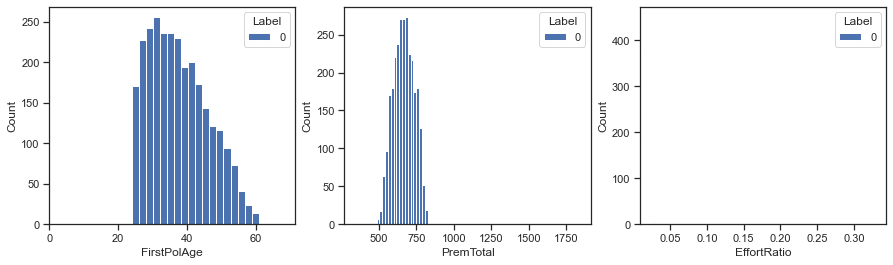

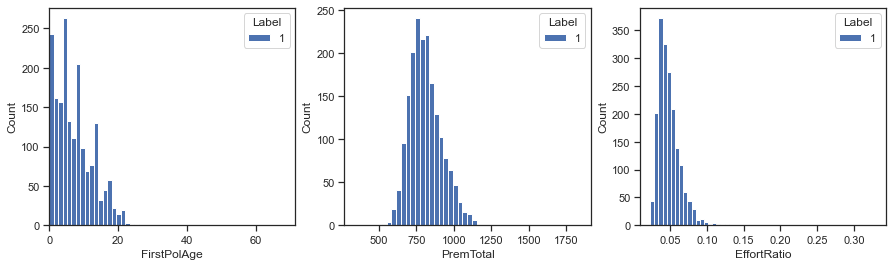

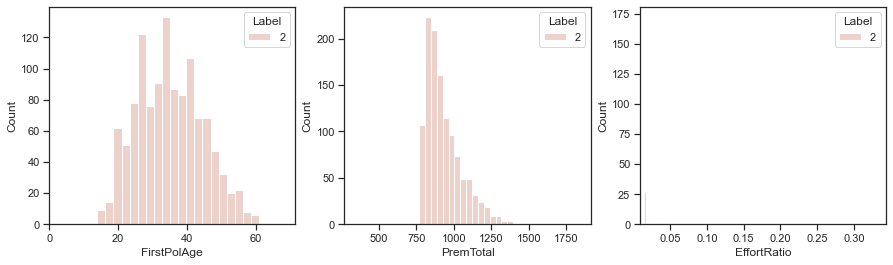

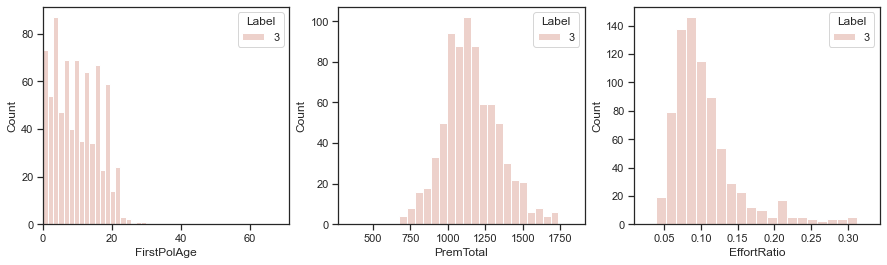

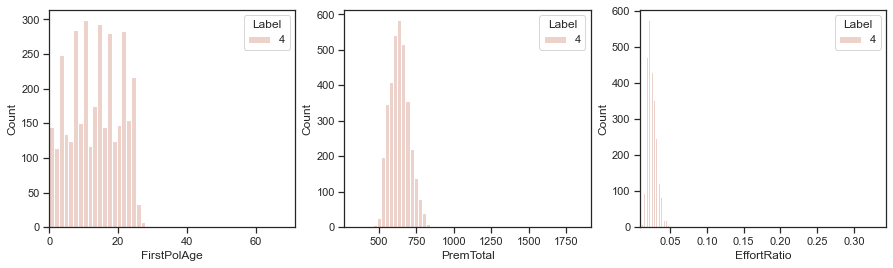

In [97]:
visualize_clustering(df, df.Label, ["FirstPolAge", "PremTotal", "EffortRatio"])

#### 3.2.3. KMeans + Hierarchical ("FirstPolAge","PremTotal", "EffortRatio")

Silhouette score: 0.32
Davies-Bouldin score: 0.96
Calinski-Harabasz score: 4826.24
Cluster sizes:
           obs     %
Cluster            
0        7535  74.8
1        1893  18.8
2         644   6.4


,FirstPolAge,PremTotal,EffortRatio
Cluster,,,
1,7.578975,30.684293,0.231708
2,9.479814,36.336287,0.314215
0,25.626941,28.555668,0.156456


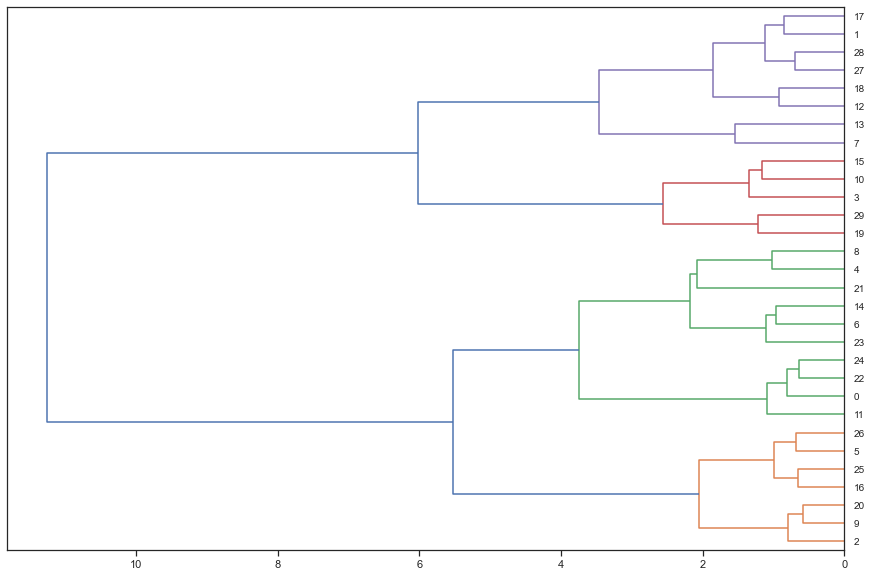

In [98]:
# scale data
km_value = df_value[["FirstPolAge","PremTotal", "EffortRatio"]]
minmax_scaler, km_value_minmax = data_scaler(km_value, "minmax")
standard_scaler, km_value_standard = data_scaler(km_value, "standard")
robust_scaler, km_value_robust = data_scaler(km_value, "robust")

# get cluster centroids and labels
km_value_centroids, km_value_labels = kmeans_clustering(km_value_standard, 30)

# add labels obtained with KMeans to main df
df["Label"] = km_value_labels

# plot dendrogram with centroid clusters
sns.set(style = "ticks")
plt.subplots(figsize = (15, 10))
km_value_linkage = hierarchy.linkage(km_value_centroids, method = "ward")
hierarchy.dendrogram(
    km_value_linkage,
    orientation = "left",
    color_threshold = 4.5
)

# hierarchical clustering of the centroids obtained
hc_value_clusters = AgglomerativeClustering(n_clusters = 3, affinity = "euclidean", linkage = "ward").fit(km_value_centroids)
hc_value_labels = pd.Series(hc_value_clusters.labels_, name = "hc_label")

# obtain dataframe with centroids (pre-scaling) and labels
km_value_centroids = pd.DataFrame(standard_scaler.inverse_transform(km_value_centroids), columns = ["FirstPolAge","PremTotal", "EffortRatio"])
km_value_centroids = pd.concat([km_value_centroids, hc_value_labels], axis = 1)

# iterate through labels in df and replace with label from AgglomerativeClustering
label_col_index = df.columns.get_loc("Label")
hclabel_col_index = km_value_centroids.columns.get_loc("hc_label")
for i in np.arange(0, len(df)):
    df.iloc[i, label_col_index] = km_value_centroids.iloc[df.iloc[i, label_col_index], hclabel_col_index]

# cluster overview
evaluate_clustering(km_value_standard, df.Label)
summarise_clustering(km_value, df.Label, "FirstPolAge")

In [99]:
r2_variables(df[["FirstPolAge", "PremTotal", "EffortRatio", "Label"]], 'Label').drop("Label")

FirstPolAge    0.261941
PremTotal      0.502387
EffortRatio    0.632974
dtype: float64

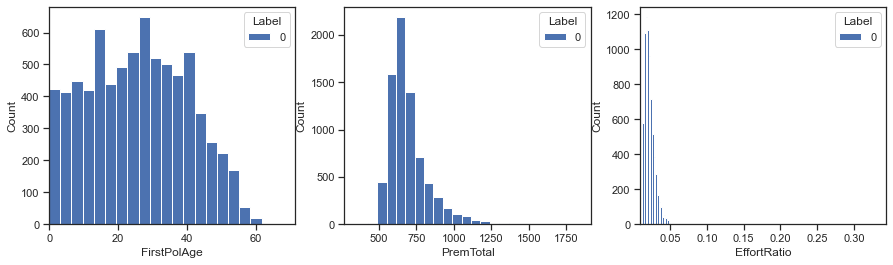

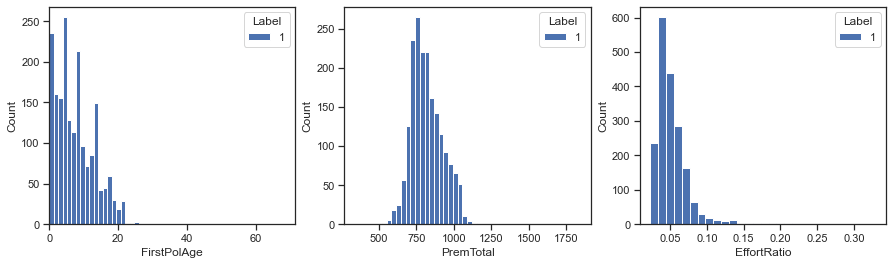

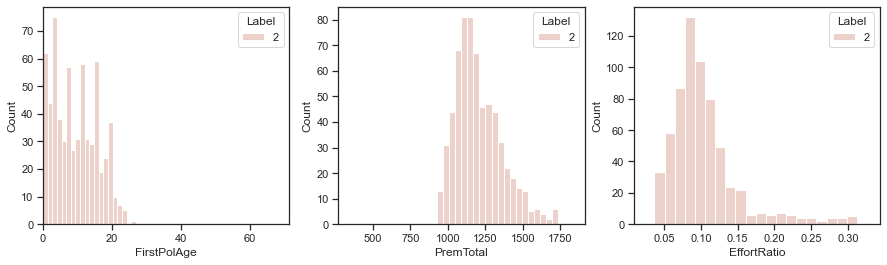

In [100]:
visualize_clustering(df, df.Label, ["FirstPolAge","PremTotal", "EffortRatio"])

#### 3.2.4. KMeans + Hierarchical (PremTotal, EffortRatio)

Silhouette score: 0.46
Davies-Bouldin score: 0.88
Calinski-Harabasz score: 10270.46
Cluster sizes:
           obs     %
Cluster            
0        2416  24.0
1         695   6.9
2        6961  69.1


,PremTotal,EffortRatio
Cluster,,
2,27.927325,0.160465
0,32.016415,0.198297
1,35.826073,0.322002


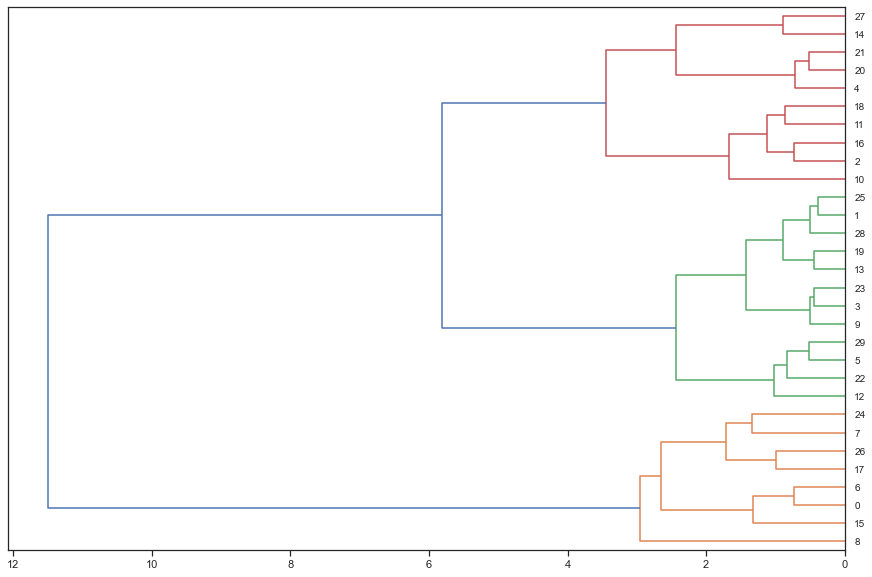

In [101]:
# scale data
km_value = df_value[["PremTotal", "EffortRatio"]]
minmax_scaler, km_value_minmax = data_scaler(km_value, "minmax")
standard_scaler, km_value_standard = data_scaler(km_value, "standard")
robust_scaler, km_value_robust = data_scaler(km_value, "robust")

# get cluster centroids and labels
km_value_centroids, km_value_labels = kmeans_clustering(km_value_standard, 30)

# add labels obtained with KMeans to main df
df["Label"] = km_value_labels

# plot dendrogram with centroid clusters
sns.set(style = "ticks")
plt.subplots(figsize = (15, 10))
km_value_linkage = hierarchy.linkage(km_value_centroids, method = "ward")
hierarchy.dendrogram(
    km_value_linkage,
    orientation = "left",
    color_threshold = 5
)

# hierarchical clustering of the centroids obtained
hc_value_clusters = AgglomerativeClustering(n_clusters = 3, affinity = "euclidean", linkage = "ward").fit(km_value_centroids)
hc_value_labels = pd.Series(hc_value_clusters.labels_, name = "hc_label")

# obtain dataframe with centroids (pre-scaling) and labels
km_value_centroids = pd.DataFrame(standard_scaler.inverse_transform(km_value_centroids), columns = ["PremTotal", "EffortRatio"])
km_value_centroids = pd.concat([km_value_centroids, hc_value_labels], axis = 1)

# iterate through labels in df and replace with label from AgglomerativeClustering
label_col_index = df.columns.get_loc("Label")
hclabel_col_index = km_value_centroids.columns.get_loc("hc_label")
for i in np.arange(0, len(df)):
    df.iloc[i, label_col_index] = km_value_centroids.iloc[df.iloc[i, label_col_index], hclabel_col_index]

# cluster overview
evaluate_clustering(km_value_standard, df.Label)
summarise_clustering(km_value, df.Label, "PremTotal")

In [102]:
r2_variables(df[["PremTotal", "EffortRatio", "Label"]], 'Label').drop("Label")

PremTotal      0.730152
EffortRatio    0.611890
dtype: float64

#### 3.2.5. Hierarchical

Silhouette score: 0.32
Davies-Bouldin score: 0.97
Calinski-Harabasz score: 6648.91
Cluster sizes:
           obs     %
Cluster            
0        3433  34.1
1        1635  16.2
2        4364  43.3
3         640   6.4


,FirstPolAge,PremTotal,EffortRatio
Cluster,,,
1,7.395107,30.974187,0.233905
3,8.875000,35.749140,0.326936
2,15.496563,27.569989,0.163405
0,37.329741,29.949087,0.150042


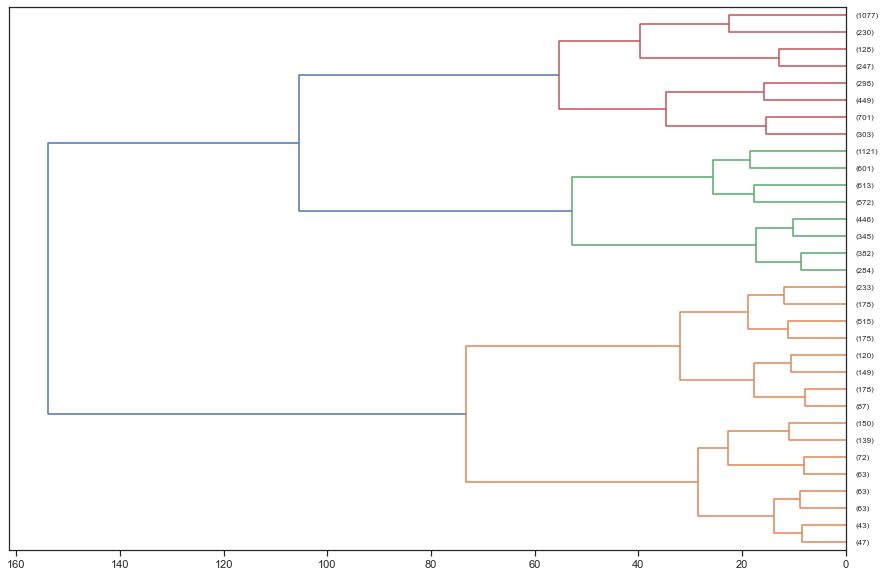

In [103]:
# scale data
hc_value = df_value[["FirstPolAge","PremTotal", "EffortRatio"]]
minmax_scaler, hc_value_minmax = data_scaler(hc_value, "minmax")
standard_scaler, hc_value_standard = data_scaler(hc_value, "standard")
robust_scaler, hc_value_robust = data_scaler(hc_value, "robust")

hc_value_distances, hc_value_labels, hc_value_linkage = hierarchical_clustering(
    hc_value_standard, 
    n_clusters = None, 
    threshold = 0, 
    affinity = "euclidean", 
    linkage = "ward"
)

sns.set(style = "ticks")
plt.subplots(figsize = (15, 10))
hierarchy.dendrogram(
    hc_value_linkage,
    orientation = "left",
    p = 4,
    truncate_mode = "level",
    color_threshold = 100
)

# perform AgglomerativeClustering
hc_value_clusters = AgglomerativeClustering(n_clusters = 4, affinity = "euclidean", linkage = "ward").fit(hc_value_standard)
hc_value_labels = hc_value_clusters.labels_

# overview of the clusters
df["Label"] = hc_value_labels
evaluate_clustering(hc_value_standard, df.Label)
summarise_clustering(hc_value, df.Label, "FirstPolAge")

In [104]:
r2_variables(df[["PremTotal", "EffortRatio", "Label"]], 'Label').drop("Label")

PremTotal      0.556708
EffortRatio    0.728814
dtype: float64

#### 3.2.6. DBSCAN

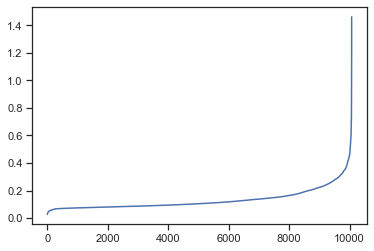

Silhouette score: 0.43
Davies-Bouldin score: 0.69
Calinski-Harabasz score: 139.85
Cluster sizes:
           obs     %
Cluster            
-1        142   1.4
 0       9809  97.4
 1         63   0.6
 2         26   0.3
 3          4   0.0
 4          8   0.1
 5          5   0.0
 6          5   0.0
 7          5   0.0
 8          5   0.0


,FirstPolAge,PremTotal,EffortRatio
Cluster,,,
7,1.800000,35.845873,0.372820
4,6.000000,32.559506,0.399613
1,9.888889,37.104718,0.398284
5,10.200000,30.667497,0.367211
2,13.576923,39.864299,0.375445
-1,17.429577,33.845112,0.288229
6,18.200000,31.421490,0.400000
3,18.500000,38.005110,0.363310
8,19.600000,33.698394,0.373682


In [105]:
# scale data
db_value = df_value[["FirstPolAge", "PremTotal", "EffortRatio"]]
minmax_scaler, db_value_minmax = data_scaler(db_value, "minmax")
standard_scaler, db_value_standard = data_scaler(db_value, "standard")
robust_scaler, db_value_robust = data_scaler(db_value, "robust")

# find adequate values for eps
neigh = NearestNeighbors(n_neighbors=6)
neigh.fit(db_value_standard)
distances, _ = neigh.kneighbors(db_value_standard)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

# get clusters and labels based on selected eps
db_value_clusters = DBSCAN(eps = 0.3, min_samples = 5).fit(db_value_standard)
db_value_labels = db_value_clusters.labels_

# overview of the clusters
df["Label"] = db_value_labels
evaluate_clustering(db_value_standard, df.Label)
summarise_clustering(db_value, df.Label, "FirstPolAge")

In [106]:
r2_variables(df[["FirstPolAge","PremTotal", "EffortRatio", "Label"]], 'Label').drop("Label")

FirstPolAge    0.007285
PremTotal      0.151089
EffortRatio    0.434698
dtype: float64

#### 3.2.7. BIRCH

In [107]:
# scale data
birch_value = df_value[["FirstPolAge","PremTotal", "EffortRatio"]]
minmax_scaler, birch_value_minmax = data_scaler(birch_value, "minmax")
standard_scaler, birch_value_standard = data_scaler(birch_value, "standard")
robust_scaler, birch_value_robust = data_scaler(birch_value, "robust")

# model and labels
birch_value_clusters = Birch(threshold = 0.2).fit(birch_value_standard)
birch_value_labels = birch_value_clusters.labels_
set(birch_value_labels)

# overview of the clusters
df["Label"] = birch_value_labels
evaluate_clustering(birch_value_standard, df.Label)
summarise_clustering(birch_value, df.Label, "FirstPolAge")

Silhouette score: 0.32
Davies-Bouldin score: 0.97
Calinski-Harabasz score: 4401.11
Cluster sizes:
           obs     %
Cluster            
0        8072  80.1
1        1372  13.6
2         628   6.2


,FirstPolAge,PremTotal,EffortRatio
Cluster,,,
1,8.201895,31.316140,0.239914
2,9.385350,36.076302,0.326225
0,24.331516,28.621312,0.159296


In [108]:
r2_variables(df[["FirstPolAge","PremTotal", "EffortRatio", "Label"]], 'Label').drop("Label")

FirstPolAge    0.177774
PremTotal      0.481655
EffortRatio    0.709635
dtype: float64

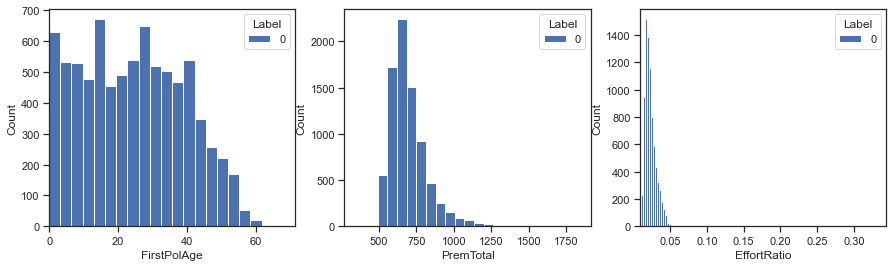

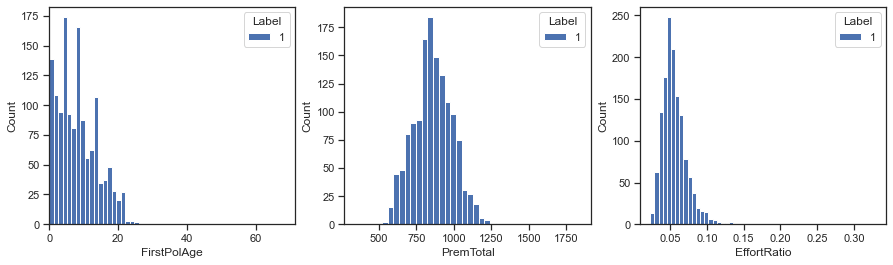

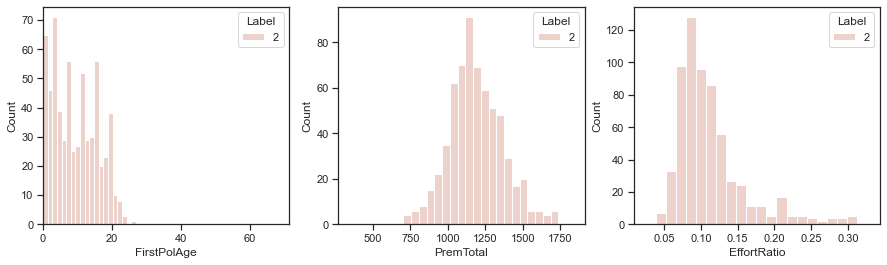

In [109]:
visualize_clustering(df, df.Label, ["FirstPolAge","PremTotal", "EffortRatio"])

#### 3.2.8. SOM + HC

In [110]:
# scale data
som_value = df_value[["FirstPolAge","PremTotal", "EffortRatio"]]
minmax_scaler, som_value_minmax = data_scaler(som_value, "minmax")
standard_scaler, som_value_standard = data_scaler(som_value, "standard")
robust_scaler, som_value_robust = data_scaler(som_value, "robust")

names = ["FirstPolAge" "PremTotal", "EffortRatio"]

np.random.seed(15)

sm = sompy.SOMFactory().build(
    data = som_value_standard.values,
    mapsize = (20, 20),
    # normalization = "var",
    initialization = "random",
    component_names = names,
    lattice = "rect",
    training = "batch"
)

sm.train(
    n_job = 4,
    train_rough_len = 100,
    train_finetune_len = 100
)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 7.000000 , radius_final: 1.166667, trainlen: 100

 epoch: 1 ---> elapsed time:  0.027000, quantization error: 0.409017

 epoch: 2 ---> elapsed time:  0.033000, quantization error: 1.371174

 epoch: 3 ---> elapsed time:  0.040000, quantization error: 0.818794

 epoch: 4 ---> elapsed time:  0.036000, quantization error: 0.684461

 epoch: 5 ---> elapsed time:  0.032000, quantization error: 0.653102

 epoch: 6 ---> elapsed time:  0.031000, quantization error: 0.634692

 epoch: 7 ---> elapsed time:  0.033000, quantization error: 0.621145

 epoch: 8 ---> elapsed time:  0.032000, quantization error: 0.611582

 epoch: 9 ---> elapsed time:  0.032000, quantization error: 0.604481

 epoch: 10 ---> elapsed time:  0.030000, quantization error: 0.598868

 epoch: 11 ---> elapsed time:  0.032000, quantization error: 0.593922

 epoch: 12 ---> elapsed time:  0.033000, quantization error: 0.589397

 epoch: 13 ---> 

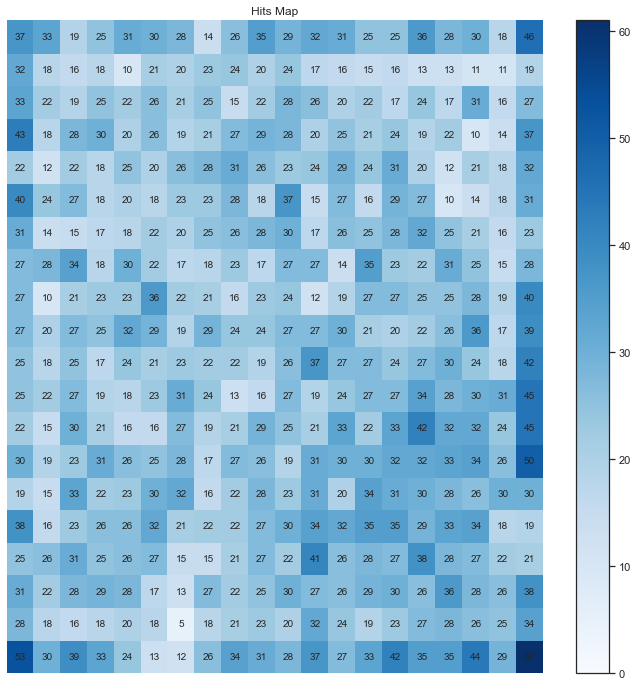

In [111]:
# SOM results
final_clusters = pd.DataFrame(sm._data, columns = ["FirstPolAge", "PremTotal", "EffortRatio"])
my_labels = pd.Series(sm._bmu[0], name = "Label")
final_clusters = pd.concat([final_clusters, my_labels], axis = 1)

# # visualization 1
# view2D  = View2DPacked(10, 10, "", text_size = 7)
# view2D.show(sm, col_sz = 3, what = 'codebook')
# plt.show()

# visualization 2
vhts  = BmuHitsView(12,12,"Hits Map",text_size=7)
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=10, cmap="Blues", logaritmic=False)

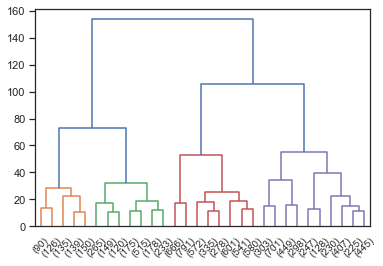

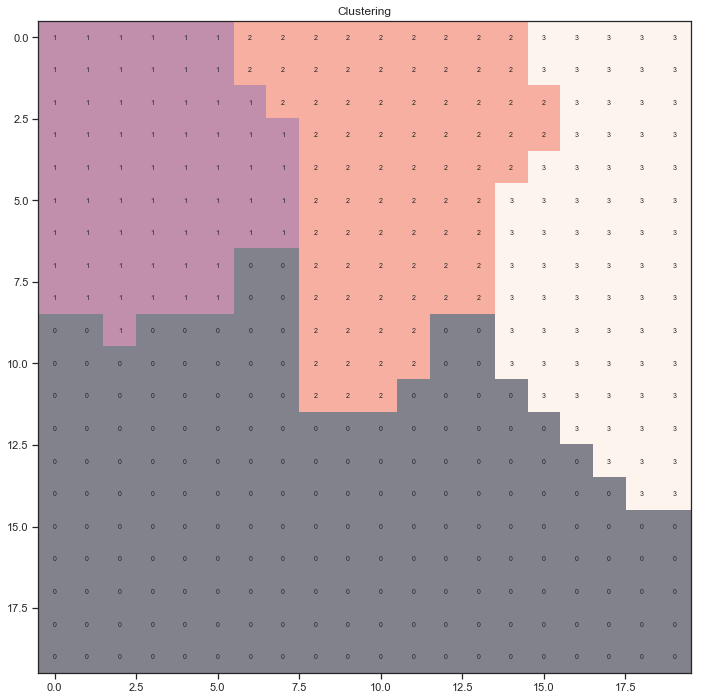

In [112]:
# apply HC to SOM results
som_value_linkage = hierarchy.linkage(sm._data, method = "ward")
hierarchy.dendrogram(
    som_value_linkage,
    truncate_mode = "lastp",
    p = 30,
    orientation = "top",
    color_threshold = 60
)

# k = 2 or k = 4 (from dendrogram)
hc_value_labels = AgglomerativeClustering(4).fit_predict(sm.codebook.matrix)
sm.cluster_labels = hc_value_labels

# visualize clusters
hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [113]:
# final SOM + HC clusters
hc_final_clusters = AgglomerativeClustering(4).fit(sm._data)
hc_final_labels = hc_final_clusters.labels_

# overview of the clusters
df["Label"] = hc_final_labels
evaluate_clustering(som_value_minmax, df.Label)
summarise_clustering(som_value, df.Label, "FirstPolAge")

Silhouette score: 0.3
Davies-Bouldin score: 0.94
Calinski-Harabasz score: 6958.83
Cluster sizes:
           obs     %
Cluster            
0        3433  34.1
1        1635  16.2
2        4364  43.3
3         640   6.4


,FirstPolAge,PremTotal,EffortRatio
Cluster,,,
1,7.395107,30.974187,0.233905
3,8.875000,35.749140,0.326936
2,15.496563,27.569989,0.163405
0,37.329741,29.949087,0.150042


In [114]:
r2_variables(df[["PremTotal", "EffortRatio", "Label"]], 'Label').drop("Label")

PremTotal      0.556708
EffortRatio    0.728814
dtype: float64

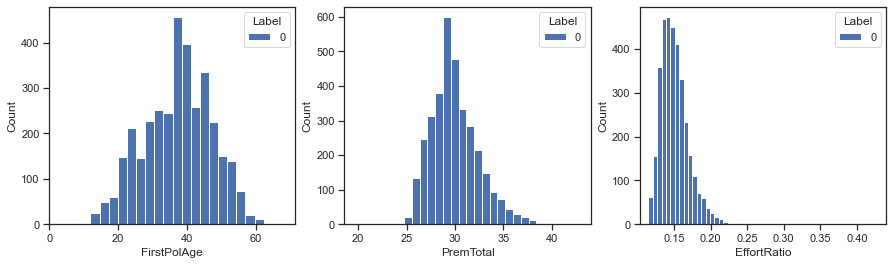

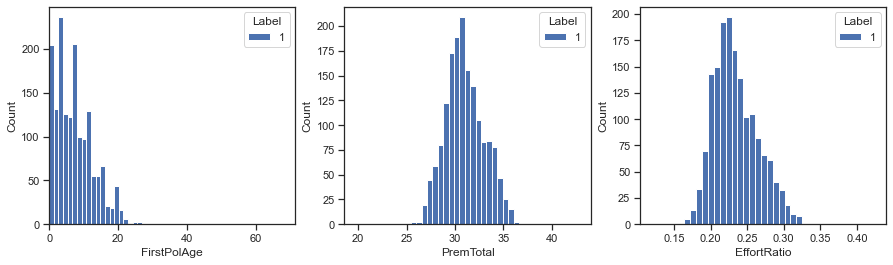

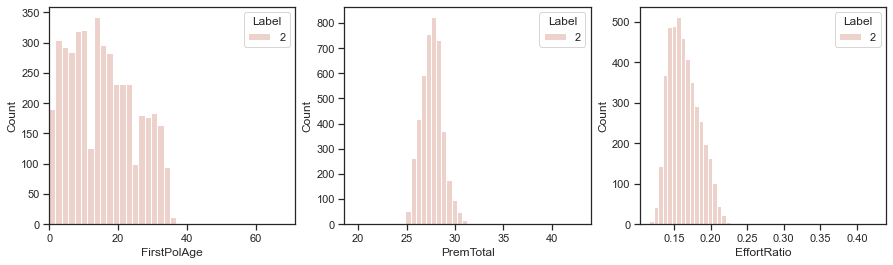

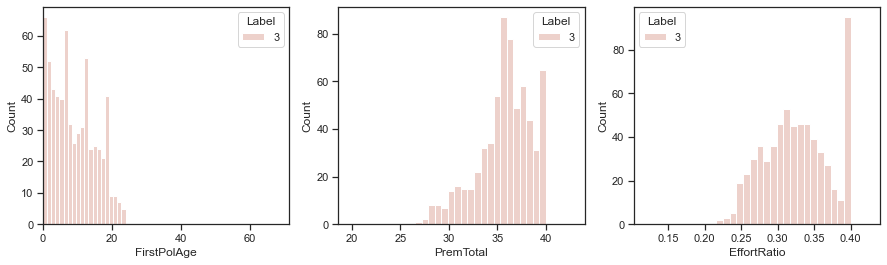

In [115]:
# visualize clusters
visualize_clustering(som_value, df.Label, ["FirstPolAge", "PremTotal", "EffortRatio"])

#### 3.2.9. SOM + KMeans

In [116]:
# scale data
som_value = df_value[["FirstPolAge","PremTotal", "EffortRatio"]]
minmax_scaler, som_value_minmax = data_scaler(som_value, "minmax")
standard_scaler, som_value_standard = data_scaler(som_value, "standard")
robust_scaler, som_value_robust = data_scaler(som_value, "robust")

names = ["FirstPolAge", "PremTotal", "EffortRatio"]

np.random.seed(15)

sm = sompy.SOMFactory().build(
    data = som_value_standard.values,
    mapsize = (20, 20),
    # normalization = "var",
    initialization = "random",
    component_names = names,
    lattice = "rect",
    training = "batch"
)

sm.train(
    n_job = 4,
    train_rough_len = 100,
    train_finetune_len = 100
)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 7.000000 , radius_final: 1.166667, trainlen: 100

 epoch: 1 ---> elapsed time:  0.027000, quantization error: 0.409017

 epoch: 2 ---> elapsed time:  0.033000, quantization error: 1.371174

 epoch: 3 ---> elapsed time:  0.033000, quantization error: 0.818794

 epoch: 4 ---> elapsed time:  0.032000, quantization error: 0.684461

 epoch: 5 ---> elapsed time:  0.033000, quantization error: 0.653102

 epoch: 6 ---> elapsed time:  0.034000, quantization error: 0.634692

 epoch: 7 ---> elapsed time:  0.030000, quantization error: 0.621145

 epoch: 8 ---> elapsed time:  0.031000, quantization error: 0.611582

 epoch: 9 ---> elapsed time:  0.031000, quantization error: 0.604481

 epoch: 10 ---> elapsed time:  0.033000, quantization error: 0.598868

 epoch: 11 ---> elapsed time:  0.032000, quantization error: 0.593922

 epoch: 12 ---> elapsed time:  0.033000, quantization error: 0.589397

 epoch: 13 ---> 

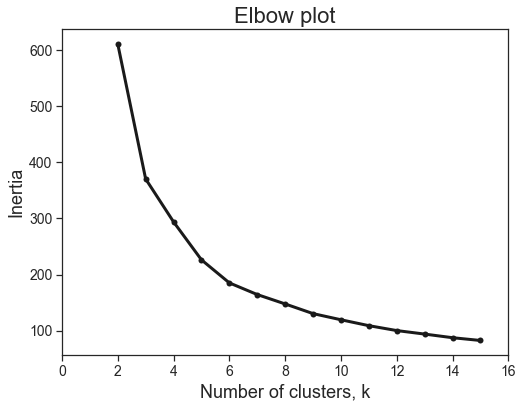

In [117]:
# SOM + KMeans
plot_elbow(sm.codebook.matrix, 15, "kmeans")

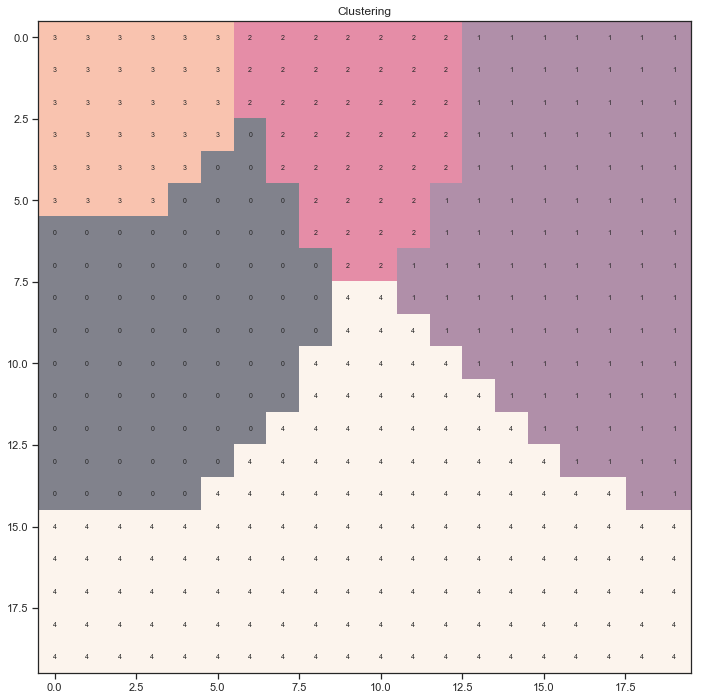

In [118]:
kmeans = KMeans(n_clusters = 5, random_state = 15)
km_value_labels = kmeans.fit_predict(sm.codebook.matrix)
sm.cluster_labels = km_value_labels  # setting the cluster labels of sompy

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm, anotate = True, onlyzeros = False, labelsize = 7, cmap = "Pastel1")

plt.show()

In [119]:
# final SOM + KMeans clusters
km_final_clusters = KMeans(5).fit(sm._data)
km_final_labels = km_final_clusters.labels_

df["Label"] = km_final_labels
evaluate_clustering(som_value_standard, df.Label)
summarise_clustering(som_value, df.Label, "FirstPolAge")

Silhouette score: 0.36
Davies-Bouldin score: 0.92
Calinski-Harabasz score: 8231.13
Cluster sizes:
           obs     %
Cluster            
0        2796  27.8
1        1846  18.3
2        3491  34.7
3         766   7.6
4        1173  11.6


,FirstPolAge,PremTotal,EffortRatio
Cluster,,,
1,7.216143,30.527537,0.224406
3,9.497389,35.642649,0.317161
2,13.209109,27.567786,0.165484
4,34.826087,32.514685,0.163573
0,37.908083,28.117999,0.140593


In [120]:
r2_variables(df[["FirstPolAge","PremTotal", "EffortRatio", "Label"]], 'Label').drop("Label")

FirstPolAge    0.752416
PremTotal      0.722864
EffortRatio    0.713081
dtype: float64

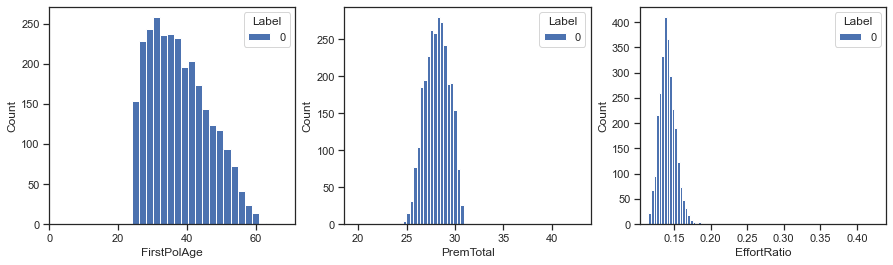

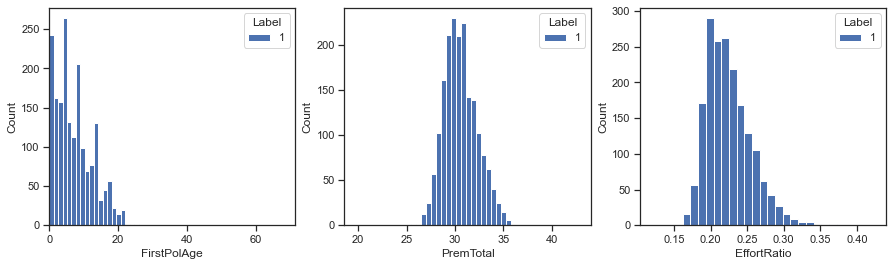

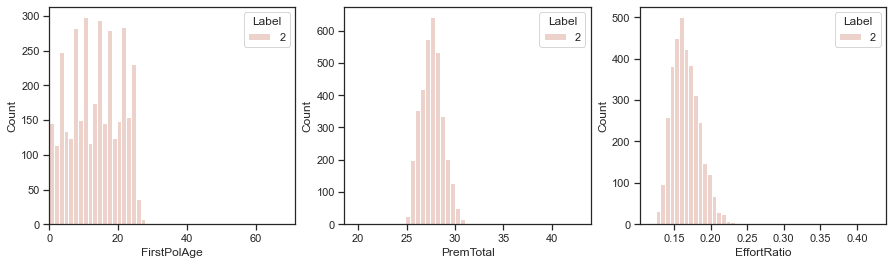

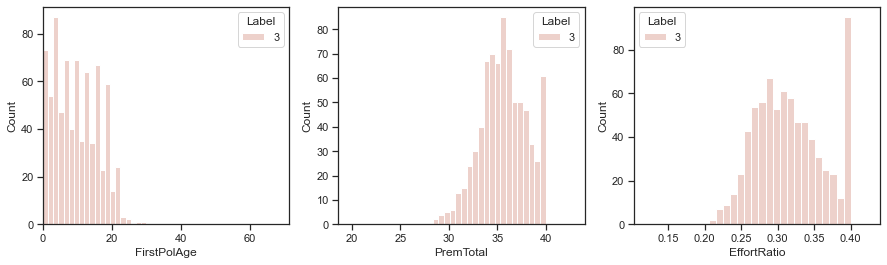

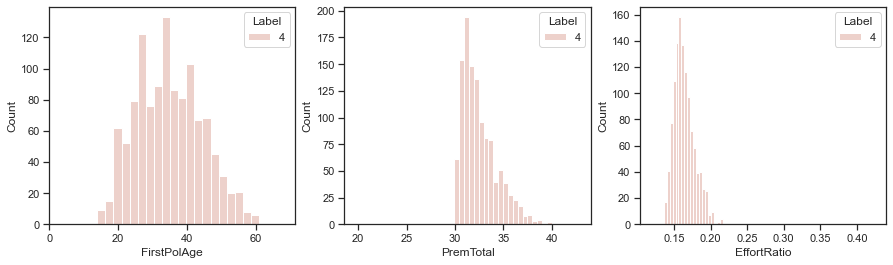

In [121]:
# visualize clusters
visualize_clustering(som_value, df.Label, ["FirstPolAge","PremTotal", "EffortRatio"])

#### 3.2.10. AffinityPropagation ("FirstPolAge", "PremTotal", "EffortRatio")

In [122]:
# scale data
ap_value = df_value[["FirstPolAge", "PremTotal", "EffortRatio"]]
minmax_scaler, ap_value_minmax = data_scaler(ap_value, "minmax")
standard_scaler, ap_value_standard = data_scaler(ap_value, "standard")
robust_scaler, ap_value_robust = data_scaler(ap_value, "robust")

# get clusters and labels based on selected eps
ap_value_clusters = AffinityPropagation(damping = 0.7, verbose = True).fit(ap_value_standard)
ap_value_labels = ap_value_clusters.labels_

# overview of the clusters
df["Label"] = ap_value_labels
evaluate_clustering(ap_value_standard, df.Label)
summarise_clustering(ap_value, df.Label, "FirstPolAge")

Converged after 103 iterations.
Silhouette score: 0.23
Davies-Bouldin score: 1.05
Calinski-Harabasz score: 3187.63
Cluster sizes:
          obs    %
Cluster          
0         22  0.2
1         74  0.7
2         86  0.9
3         77  0.8
4        101  1.0
...      ...  ...
140       82  0.8
141      125  1.2
142       60  0.6
143       23  0.2
144       18  0.2

[145 rows x 2 columns]


,FirstPolAge,PremTotal,EffortRatio
Cluster,,,
132,1.827160,29.835839,0.193621
25,2.206612,27.705806,0.178955
139,2.537313,31.019306,0.205498
33,2.548387,36.444732,0.334548
81,2.563380,26.378345,0.185187
...,...,...,...
23,51.648148,31.500984,0.146541
12,52.951220,33.247612,0.157333
47,53.200000,30.206979,0.142810


In [123]:
r2_variables(df[["PremTotal", "EffortRatio", "Label"]], 'Label').drop("Label")

PremTotal      0.977037
EffortRatio    0.952954
dtype: float64

#### 3.2.11. Spectral clustering ("FirstPolAge", "PremTotal", "EffortRatio")

In [124]:
# scale data
spectral_value = df_value[["FirstPolAge","PremTotal", "EffortRatio"]]
minmax_scaler, spectral_value_minmax = data_scaler(spectral_value, "minmax")
standard_scaler, spectral_value_standard = data_scaler(spectral_value, "standard")
robust_scaler, spectral_value_robust = data_scaler(spectral_value, "robust")

spectral_value_clusters = SpectralClustering(5).fit(spectral_value_standard)
spectral_value_labels = spectral_value_clusters.labels_

df["Label"] = spectral_value_labels
evaluate_clustering(spectral_value_standard, df.Label)
summarise_clustering(spectral_value, df.Label, "FirstPolAge")

Silhouette score: 0.3
Davies-Bouldin score: 1.32
Calinski-Harabasz score: 1838.91
Cluster sizes:
           obs     %
Cluster            
0        8852  87.9
1         101   1.0
2         567   5.6
3         386   3.8
4         166   1.6


,FirstPolAge,PremTotal,EffortRatio
Cluster,,,
2,8.798942,34.263940,0.293669
4,9.530120,36.936240,0.344254
1,11.485149,38.619933,0.383962
0,21.601333,28.675679,0.168467
3,37.836788,34.601288,0.171402


In [125]:
r2_variables(df[["PremTotal", "EffortRatio", "Label"]], 'Label').drop("Label")

PremTotal      0.602797
EffortRatio    0.688929
dtype: float64

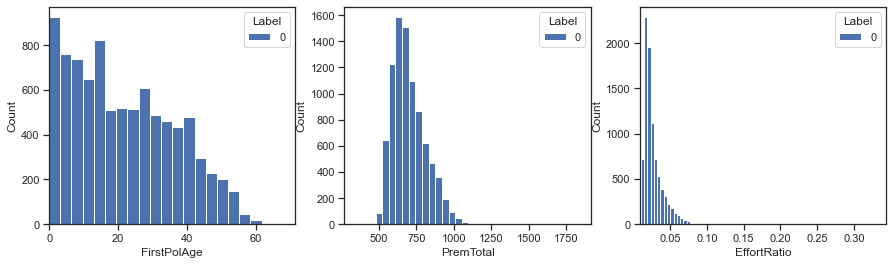

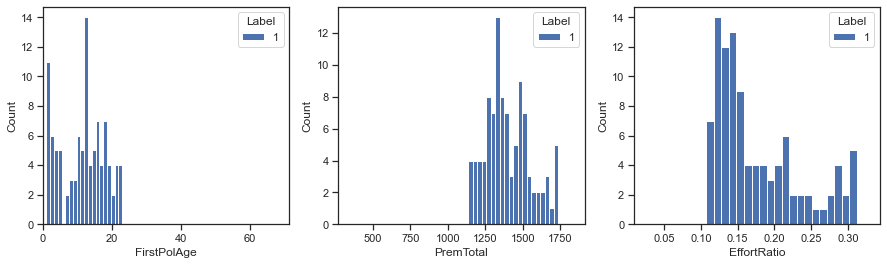

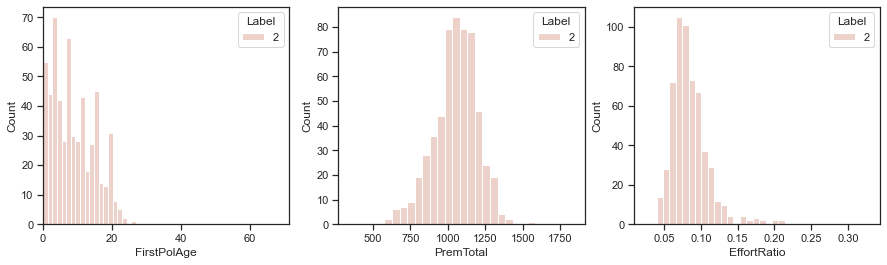

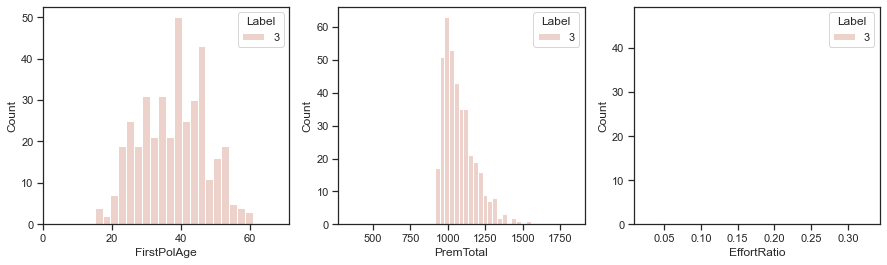

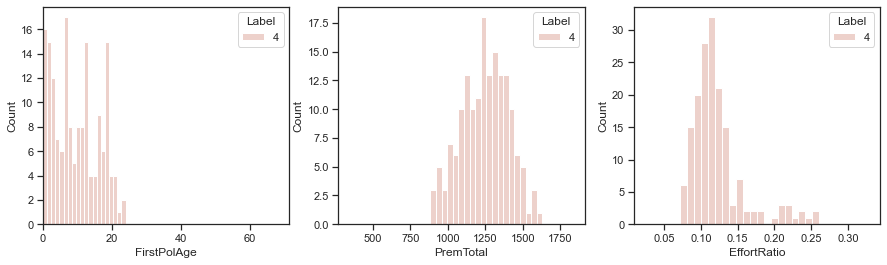

In [126]:
visualize_clustering(df, df.Label, ["FirstPolAge","PremTotal", "EffortRatio"])

<a class="anchor" id="clustering-product"></a>

<h3><right>Product clustering</right></h3>

In [127]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    hierarchy.dendrogram(linkage_matrix, **kwargs)

    return

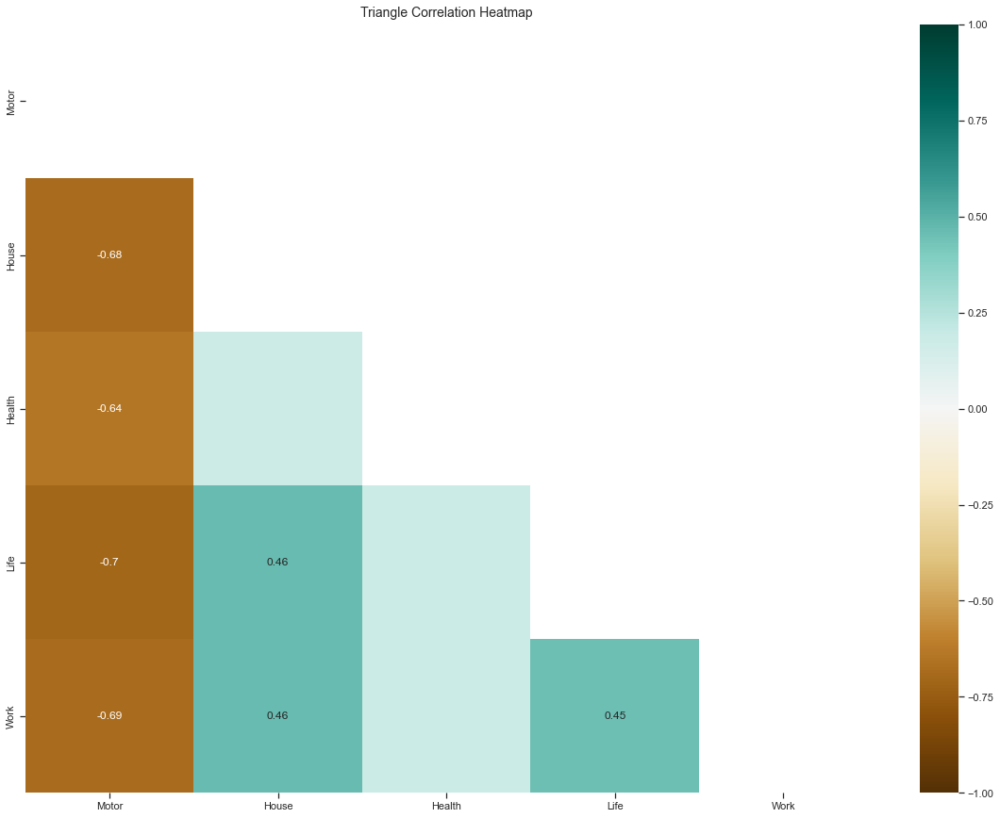

In [128]:
df_product = df[[
    "Motor",
    "MotorRatio",
    "House",
    "HouseRatio",
    "Health",
    "HealthRatio",
    "Life",
    "LifeRatio",
    "Work",
    "WorkRatio",
]]

# potentially relevant features to perform customer segmentation based on product
df_product_raw = df_transformed[[
    "Motor",
    "House",
    "Health",
    "Life",
    "Work"
]]

df_product_ratios = df_transformed[[
    "MotorRatio",
    "HouseRatio",
    "HealthRatio",
    "LifeRatio",
    "WorkRatio"
]]

raw_features = ["Motor", "House", "Health", "Life", "Work"]
ratio_features = ["MotorRatio", "HouseRatio", "HealthRatio", "LifeRatio", "WorkRatio"]

corr_heatmap(df_product_raw, 0.2, "pearson")

#### 3.3.1. KMeans

In [129]:
## non-ratios premiums

# scale data
minmax_scaler, km_product_minmax = data_scaler(df_product_raw, "minmax")
standard_scaler, km_product_standard = data_scaler(df_product_raw, "standard")
robust_scaler, km_product_robust = data_scaler(df_product_raw, "robust")

# elbow plot (suggests 4-8 clusters)
# plot_elbow(km_product_robust, 20, "kmeans")

# get cluster centroids and labels
km_product_centroids, km_product_labels = kmeans_clustering(km_product_standard, 4)

# cluster overview
df["Label"] = km_product_labels
evaluate_clustering(km_product_standard, df.Label)
summarise_clustering(df_product[raw_features], df.Label, "Motor")

Silhouette score: 0.25
Davies-Bouldin score: 1.34
Calinski-Harabasz score: 5158.36
Cluster sizes:
           obs     %
Cluster            
0        2303  22.9
1        2610  25.9
2        1877  18.6
3        3282  32.6


,Motor,House,Health,Life,Work
Cluster,,,,,
2,131.209291,505.719100,157.264571,101.862318,98.045876
0,191.397581,215.896201,265.283113,44.974008,43.815632
3,334.184817,145.873766,167.461240,29.116280,29.198303
1,470.597571,39.195287,90.866648,8.303678,8.314023


In [130]:
r2_variables(df[["Motor", "House", "Health", "Life", "Work", "Label"]], 'Label').drop("Label")

Motor     0.847266
House     0.507632
Health    0.673855
Life      0.471801
Work      0.462054
dtype: float64

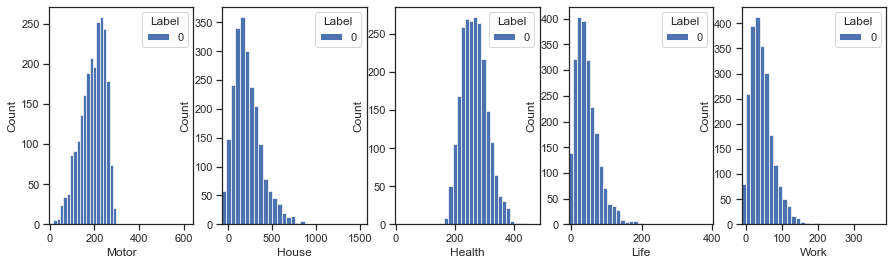

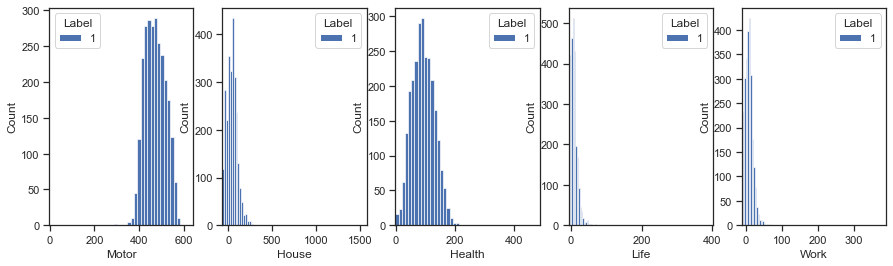

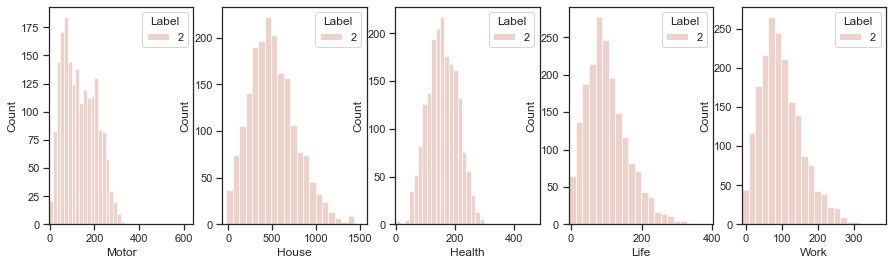

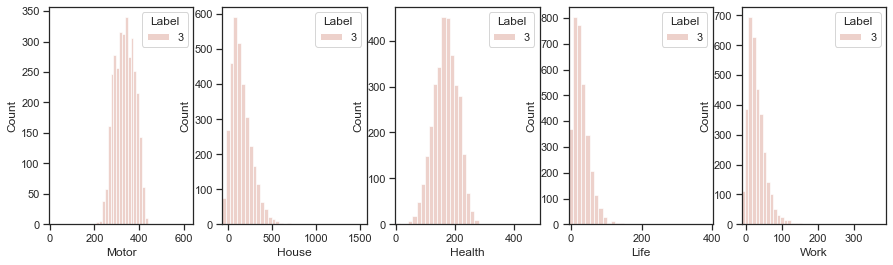

In [131]:
visualize_clustering(df_product[raw_features], df.Label, raw_features)

In [132]:
## ratios premiums

# scale data
minmax_scaler, km_product_minmax = data_scaler(df_product_ratios, "minmax")
standard_scaler, km_product_standard = data_scaler(df_product_ratios, "standard")
robust_scaler, km_product_robust = data_scaler(df_product_ratios, "robust")

# elbow plot (suggests 4-8 clusters)
# plot_elbow(km_product_minmax, 20, "kmeans")

# get cluster centroids and labels
km_product_centroids, km_product_labels = kmeans_clustering(km_product_minmax, 4)

# cluster overview
df["Label"] = km_product_labels
evaluate_clustering(km_product_minmax, df.Label)
summarise_clustering(df_product[ratio_features], df.Label, "MotorRatio")

Silhouette score: 0.27
Davies-Bouldin score: 1.28
Calinski-Harabasz score: 5783.88
Cluster sizes:
           obs     %
Cluster            
0        2315  23.0
1        2149  21.3
2        2520  25.0
3        3088  30.7


,MotorRatio,HouseRatio,HealthRatio,LifeRatio,WorkRatio
Cluster,,,,,
2,0.169482,0.489991,0.178636,0.082136,0.079755
1,0.293454,0.176414,0.372647,0.080368,0.077116
3,0.509826,0.179039,0.239599,0.035753,0.035783
0,0.791308,0.036277,0.145646,0.013384,0.013384


In [133]:
r2_variables(df[["Motor", "House", "Health", "Life", "Work", "Label"]], 'Label').drop("Label")

Motor     0.803349
House     0.669191
Health    0.569906
Life      0.344141
Work      0.342846
dtype: float64

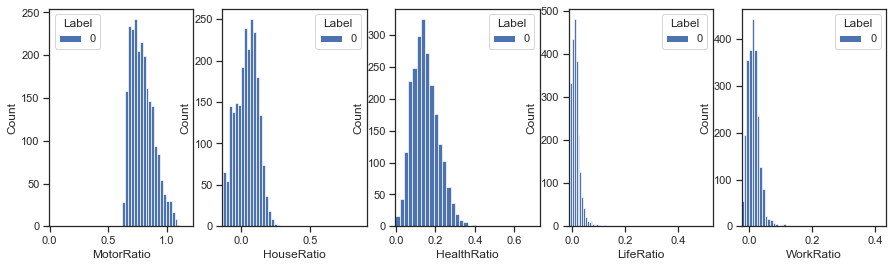

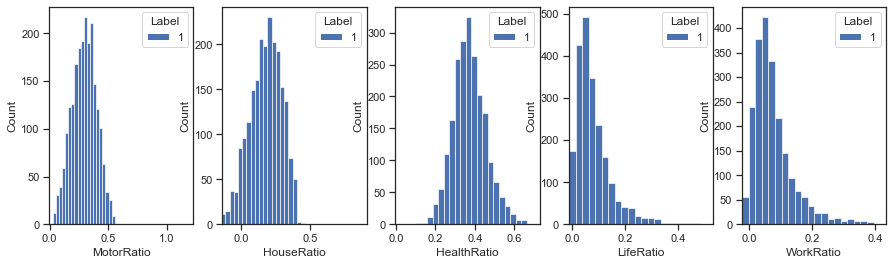

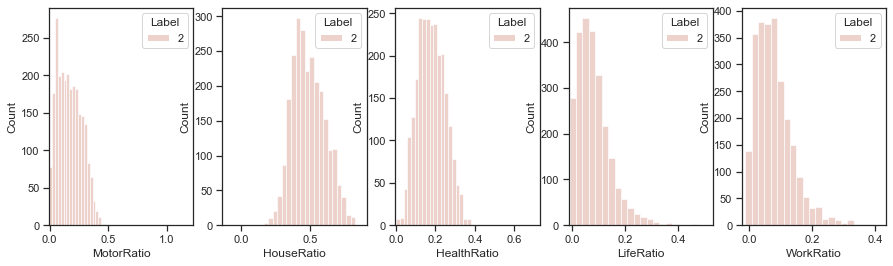

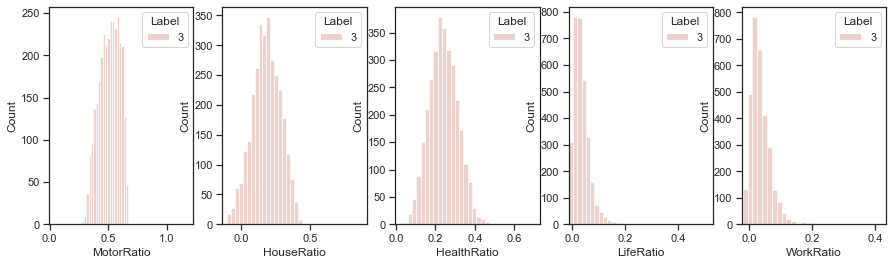

In [134]:
visualize_clustering(df_product[ratio_features], df.Label, ratio_features)

#### 3.3.2. KMeans + Hierarchical

Silhouette score: 0.24
Davies-Bouldin score: 1.57
Calinski-Harabasz score: 3913.13
Cluster sizes:
           obs     %
Cluster            
0        3043  30.2
1        2554  25.4
2         673   6.7
3        3802  37.7


,Motor,House,Health,Life,Work
Cluster,,,,,
2,81.027162,539.226300,137.089584,118.906672,144.514725
0,224.279070,354.225074,179.014726,64.919556,50.408833
1,236.066625,138.213939,252.341899,32.444217,39.150067
3,439.820108,61.466728,108.210952,13.562864,13.631294


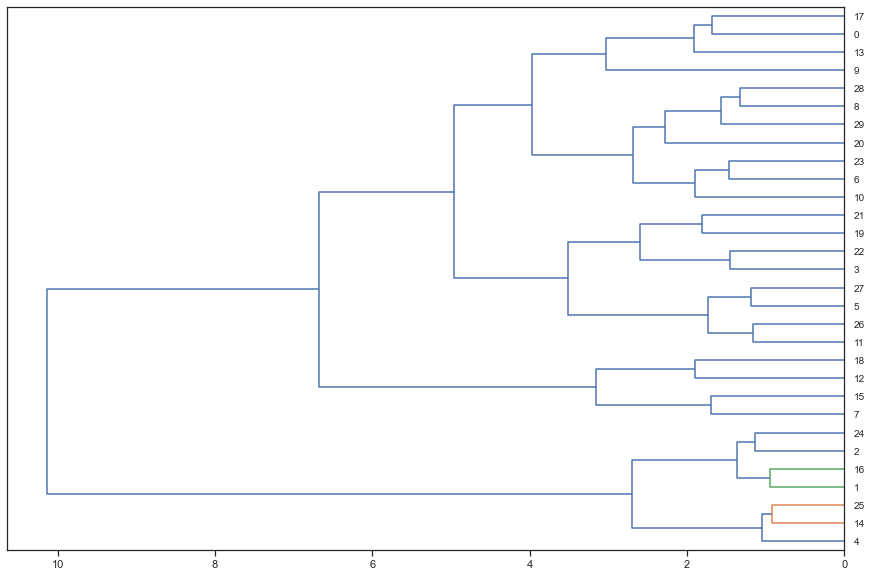

In [135]:
## non-ratio premiums

# scale data
minmax_scaler, km_product_minmax = data_scaler(df_product_raw, "minmax")
standard_scaler, km_product_standard = data_scaler(df_product_raw, "standard")
robust_scaler, km_product_robust = data_scaler(df_product_raw, "robust")

# get cluster centroids and labels
km_product_centroids, km_product_labels = kmeans_clustering(km_product_standard, 30)

# add labels obtained with KMeans to main df
df["Label"] = km_product_labels

# plot dendrogram with centroid clusters
sns.set(style = "ticks")
plt.subplots(figsize = (15, 10))
km_product_linkage = hierarchy.linkage(km_product_centroids, method = "ward")
hierarchy.dendrogram(
    km_product_linkage,
    orientation = "left",
    color_threshold = 1.0
)

# hierarchical clustering of the centroids obtained
hc_product_clusters = AgglomerativeClustering(n_clusters = 4, affinity = "euclidean", linkage = "ward").fit(km_product_centroids)
hc_product_labels = pd.Series(hc_product_clusters.labels_, name = "hc_label")

# obtain dataframe with centroids (pre-scaling) and labels
km_product_centroids = pd.DataFrame(standard_scaler.inverse_transform(km_product_centroids), columns = raw_features)
km_product_centroids = pd.concat([km_product_centroids, hc_product_labels], axis = 1)

# iterate through labels in df and replace with label from AgglomerativeClustering
label_col_index = df.columns.get_loc("Label")
hclabel_col_index = km_product_centroids.columns.get_loc("hc_label")
for i in np.arange(0, len(df)):
    df.iloc[i, label_col_index] = km_product_centroids.iloc[df.iloc[i, label_col_index], hclabel_col_index]

# cluster overview
evaluate_clustering(km_product_standard, df.Label)
summarise_clustering(df_product[raw_features], df.Label, "Motor")

In [136]:
r2_variables(df[["Motor", "House", "Health", "Life", "Work", "Label"]], 'Label').drop("Label")

Motor     0.710214
House     0.466358
Health    0.588238
Life      0.408787
Work      0.509704
dtype: float64

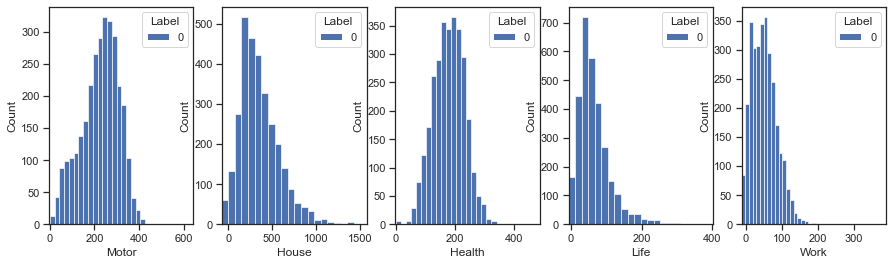

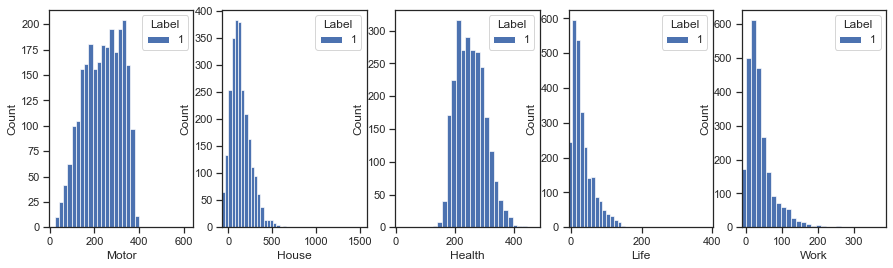

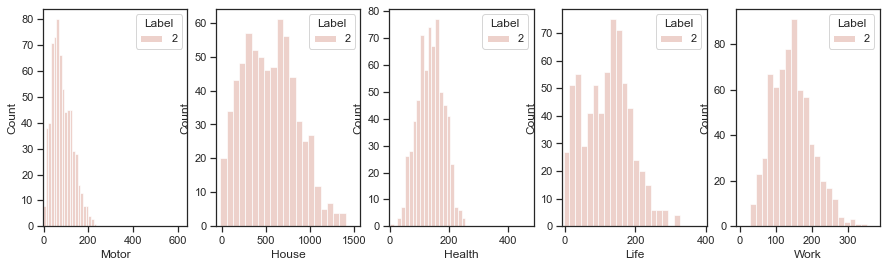

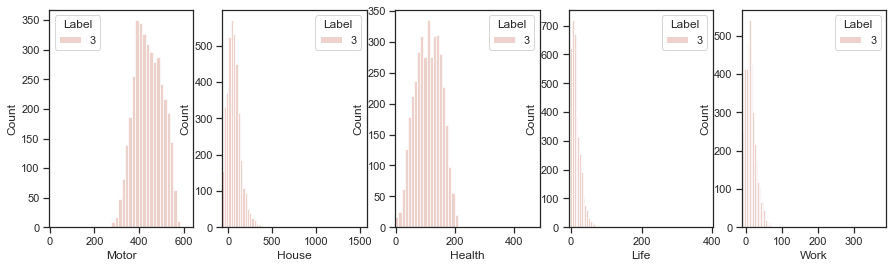

In [137]:
visualize_clustering(df_product[raw_features], df.Label, raw_features)

Silhouette score: 0.25
Davies-Bouldin score: 1.32
Calinski-Harabasz score: 3073.64
Cluster sizes:
           obs     %
Cluster            
0        2702  26.8
1        5167  51.3
2         711   7.1
3        1492  14.8


,MotorRatio,HouseRatio,HealthRatio,LifeRatio,WorkRatio
Cluster,,,,,
2,0.145783,0.368038,0.186287,0.132360,0.167532
3,0.165767,0.542121,0.169563,0.066799,0.055750
0,0.305071,0.211227,0.341454,0.073755,0.068494
1,0.636475,0.117959,0.197404,0.024778,0.023384


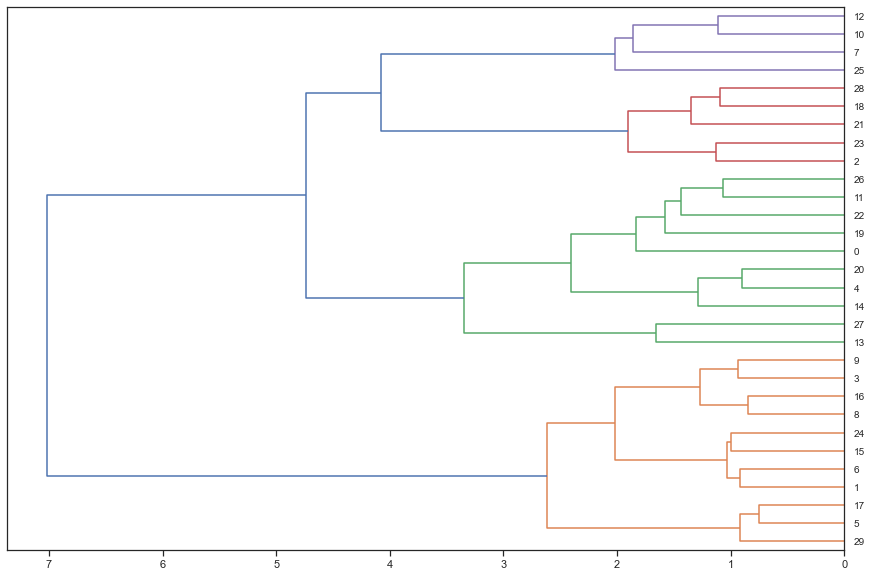

In [138]:
## ratio premiums

# scale data
minmax_scaler, km_product_minmax = data_scaler(df_product_ratios, "minmax")
standard_scaler, km_product_standard = data_scaler(df_product_ratios, "standard")
robust_scaler, km_product_robust = data_scaler(df_product_ratios, "robust")

# get cluster centroids and labels
km_product_centroids, km_product_labels = kmeans_clustering(km_product_robust, 30)

# add labels obtained with KMeans to main df
df["Label"] = km_product_labels

# plot dendrogram with centroid clusters
sns.set(style = "ticks")
plt.subplots(figsize = (15, 10))
km_product_linkage = hierarchy.linkage(km_product_centroids, method = "ward")
hierarchy.dendrogram(
    km_product_linkage,
    orientation = "left",
    color_threshold = 3.5
)

# hierarchical clustering of the centroids obtained
hc_product_clusters = AgglomerativeClustering(n_clusters = 4, affinity = "euclidean", linkage = "ward").fit(km_product_centroids)
hc_product_labels = pd.Series(hc_product_clusters.labels_, name = "hc_label")

# obtain dataframe with centroids (pre-scaling) and labels
km_product_centroids = pd.DataFrame(minmax_scaler.inverse_transform(km_product_centroids), columns = raw_features)
km_product_centroids = pd.concat([km_product_centroids, hc_product_labels], axis = 1)

# iterate through labels in df and replace with label from AgglomerativeClustering
label_col_index = df.columns.get_loc("Label")
hclabel_col_index = km_product_centroids.columns.get_loc("hc_label")
for i in np.arange(0, len(df)):
    df.iloc[i, label_col_index] = km_product_centroids.iloc[df.iloc[i, label_col_index], hclabel_col_index]

# cluster overview
evaluate_clustering(km_product_robust, df.Label)
summarise_clustering(df_product[ratio_features], df.Label, "MotorRatio")

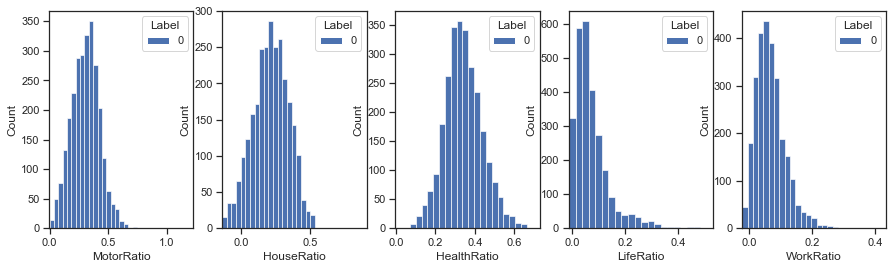

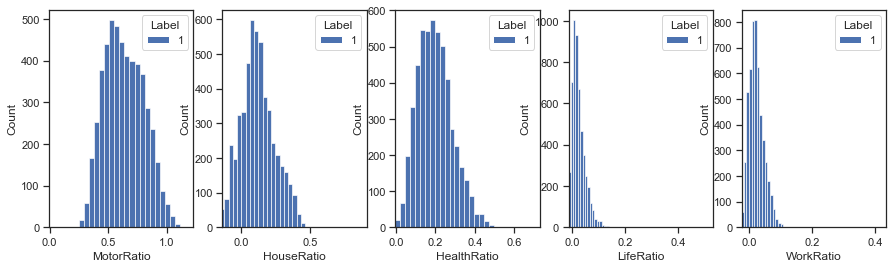

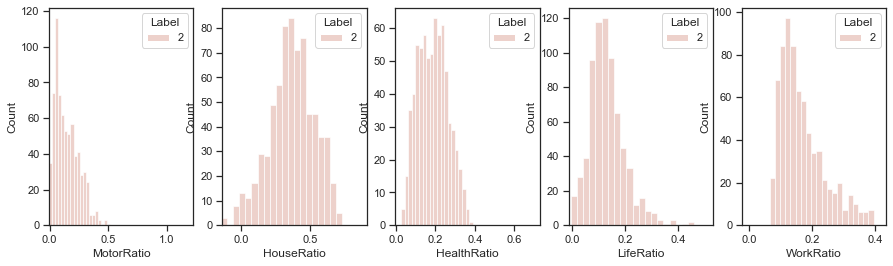

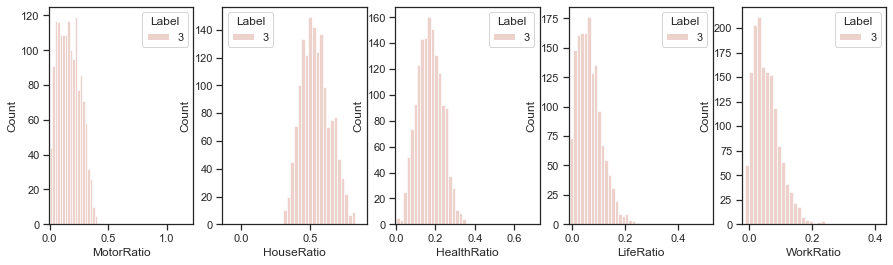

In [139]:
visualize_clustering(df_product[ratio_features], df.Label, ratio_features)

#### 3.3.3. Hierarchical

Silhouette score: 0.2
Davies-Bouldin score: 1.31
Calinski-Harabasz score: 4229.25
Cluster sizes:
           obs     %
Cluster            
0        2585  25.7
1        3875  38.5
2        2467  24.5
3        1145  11.4


,Motor,House,Health,Life,Work
Cluster,,,,,
0,140.843103,420.788549,183.842669,91.038286,89.524665
3,206.649022,143.496900,287.751502,34.736175,30.343397
1,322.548495,181.564735,170.287422,30.313412,29.850766
2,470.836940,29.142846,92.553636,7.876603,8.363101


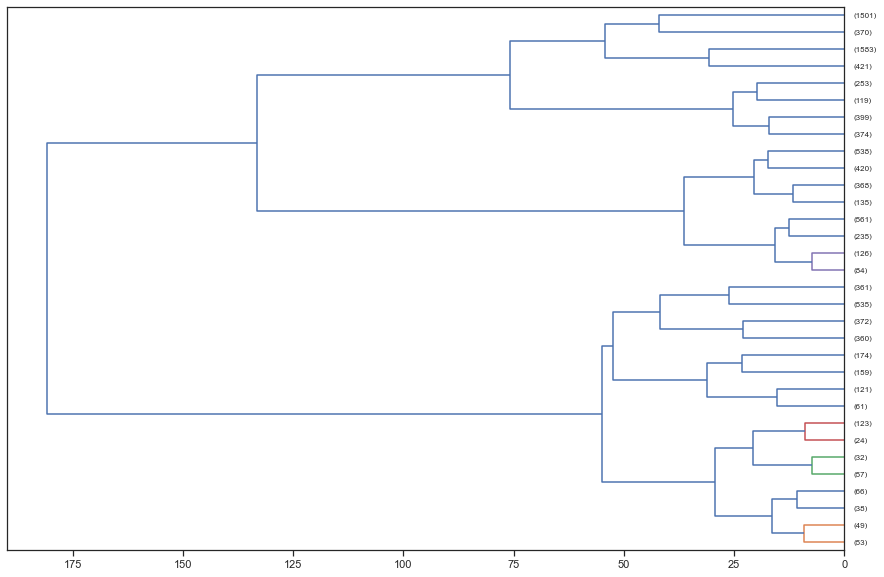

In [140]:
## non-ratio premiums

# scale data
minmax_scaler, hc_product_minmax = data_scaler(df_product_raw, "minmax")
standard_scaler, hc_product_standard = data_scaler(df_product_raw, "standard")
robust_scaler, hc_product_robust = data_scaler(df_product_raw, "robust")

hc_product_distances, hc_product_labels, hc_product_linkage = hierarchical_clustering(
    hc_product_standard, 
    n_clusters = None, 
    threshold = 0, 
    affinity = "euclidean", 
    linkage = "ward"
)

sns.set(style = "ticks")
plt.subplots(figsize = (15, 10))
hierarchy.dendrogram(
    hc_product_linkage,
    orientation = "left",
    p = 4,
    truncate_mode = "level",
    color_threshold = 10
)

# perform AgglomerativeClustering
hc_product_clusters = AgglomerativeClustering(n_clusters = 4, affinity = "euclidean", linkage = "ward").fit(hc_product_standard)
hc_product_labels = hc_product_clusters.labels_

# overview of the clusters
df["Label"] = hc_product_labels
evaluate_clustering(hc_product_standard, df.Label)
summarise_clustering(df_product[raw_features], df.Label, "Motor")

In [141]:
r2_variables(df[["Motor", "House", "Health", "Life", "Work", "Label"]], 'Label').drop("Label")

Motor     0.789140
House     0.407116
Health    0.558801
Life      0.445254
Work      0.459794
dtype: float64

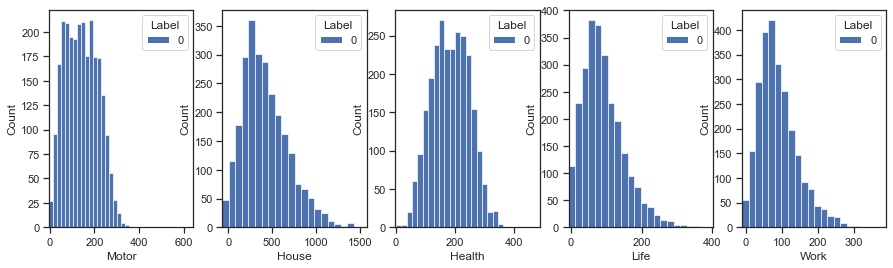

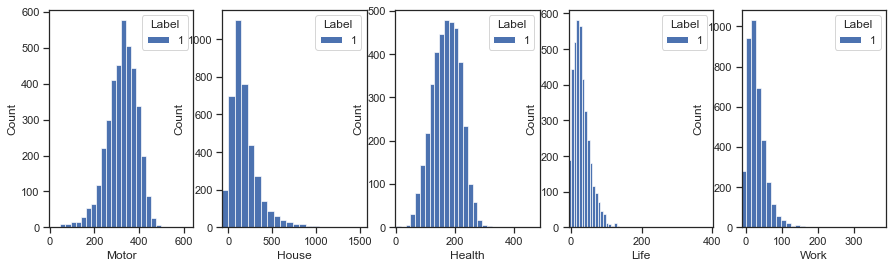

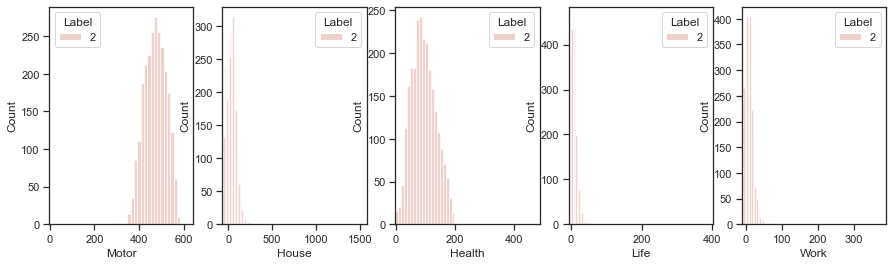

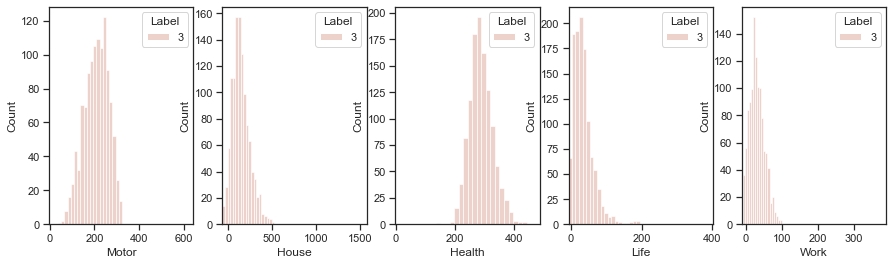

In [142]:
visualize_clustering(df_product[raw_features], df.Label, raw_features)

Silhouette score: 0.2
Davies-Bouldin score: 1.44
Calinski-Harabasz score: 3903.67
Cluster sizes:
           obs     %
Cluster            
0        2525  25.1
1        2511  24.9
2        2332  23.2
3        1216  12.1
4         877   8.7
5         611   6.1


,MotorRatio,HouseRatio,HealthRatio,LifeRatio,WorkRatio
Cluster,,,,,
3,0.121998,0.575866,0.154938,0.078343,0.068856
5,0.168415,0.346341,0.186882,0.156574,0.141788
2,0.288305,0.324792,0.281788,0.051238,0.053876
4,0.312532,0.098219,0.382324,0.105125,0.101799
0,0.520950,0.153137,0.258228,0.032916,0.034768
1,0.776932,0.043272,0.151728,0.014081,0.013987


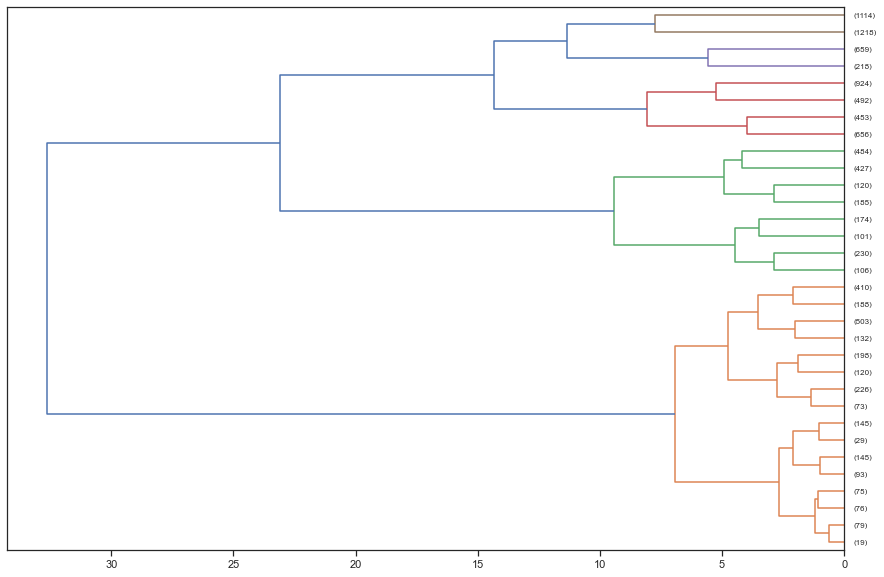

In [143]:
## ratio premiums

# scale data
minmax_scaler, hc_product_minmax = data_scaler(df_product_ratios, "minmax")
standard_scaler, hc_product_standard = data_scaler(df_product_ratios, "standard")
robust_scaler, hc_product_robust = data_scaler(df_product_ratios, "robust")

hc_product_distances, hc_product_labels, hc_product_linkage = hierarchical_clustering(
    hc_product_minmax, 
    n_clusters = None, 
    threshold = 0, 
    affinity = "euclidean", 
    linkage = "ward"
)

sns.set(style = "ticks")
plt.subplots(figsize = (15, 10))
hierarchy.dendrogram(
    hc_product_linkage,
    orientation = "left",
    p = 4,
    truncate_mode = "level",
    color_threshold = 10
)

# perform AgglomerativeClustering
hc_product_clusters = AgglomerativeClustering(n_clusters = 6, affinity = "euclidean", linkage = "ward").fit(hc_product_minmax)
hc_product_labels = hc_product_clusters.labels_

# overview of the clusters
df["Label"] = hc_product_labels
evaluate_clustering(hc_product_minmax, df.Label)
summarise_clustering(df_product[ratio_features], df.Label, "MotorRatio")

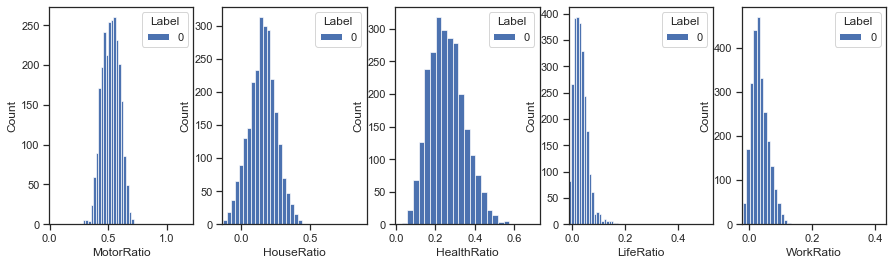

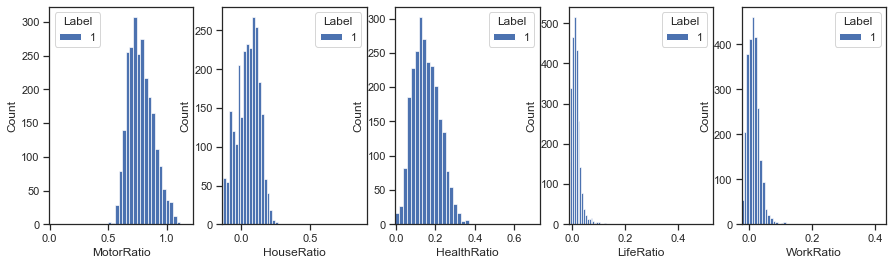

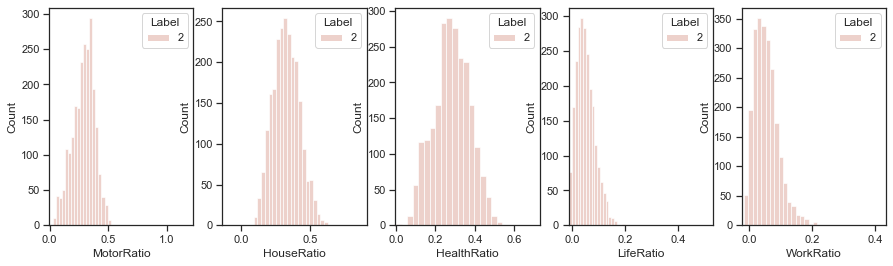

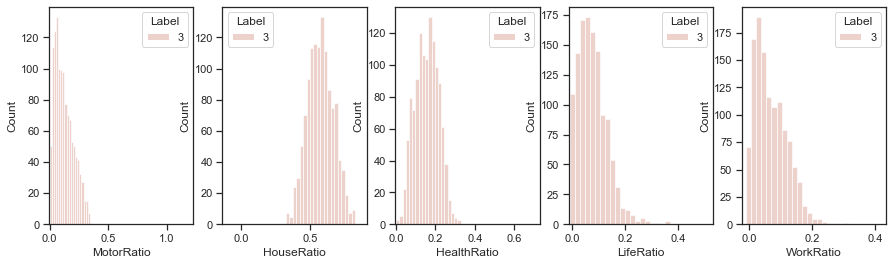

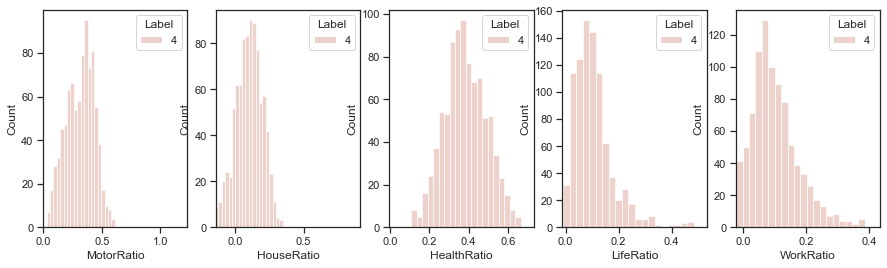

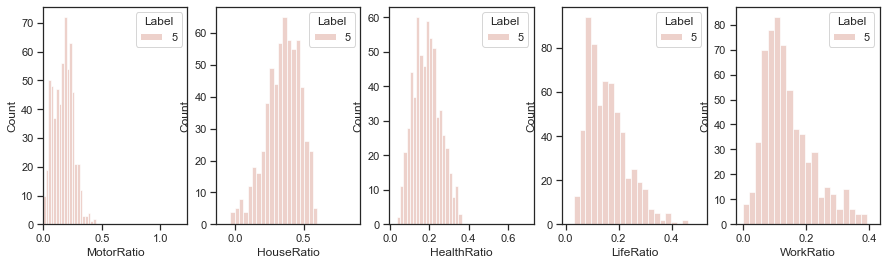

In [144]:
visualize_clustering(df_product[ratio_features], df.Label, ratio_features)

#### 3.3.4. Birch

In [145]:
## non-ratio premiums

# scale data
minmax_scaler, birch_product_minmax = data_scaler(df_product_raw, "minmax")
standard_scaler, birch_product_standard = data_scaler(df_product_raw, "standard")
robust_scaler, birch_product_robust = data_scaler(df_product_raw, "robust")

# model and labels
# for threshold in np.arange(0.1, 1, 0.1):
#     birch_product_clusters = Birch(threshold = threshold).fit(birch_product_minmax)
#     birch_product_labels = birch_product_clusters.labels_
#     print(threshold, set(birch_product_labels))

birch_product_clusters = Birch(threshold = 0.3).fit(birch_product_standard)
birch_product_labels = birch_product_clusters.labels_

# overview of the clusters
df["Label"] = birch_product_labels
evaluate_clustering(birch_product_standard, df.Label)
summarise_clustering(df_product[raw_features], df.Label, "Motor")

Silhouette score: 0.27
Davies-Bouldin score: 1.39
Calinski-Harabasz score: 5101.05
Cluster sizes:
           obs     %
Cluster            
0        2248  22.3
1        4363  43.3
2        3461  34.4


,Motor,House,Health,Life,Work
Cluster,,,,,
0,153.416432,510.262811,164.727171,86.757589,82.491926
1,255.586667,152.747570,221.415586,40.783692,40.131135
2,448.459385,61.829717,103.022095,11.277847,12.116137


In [146]:
r2_variables(df[["Motor", "House", "Health", "Life", "Work", "Label"]], 'Label').drop("Label")

Motor     0.703375
House     0.586045
Health    0.486177
Life      0.357639
Work      0.333169
dtype: float64

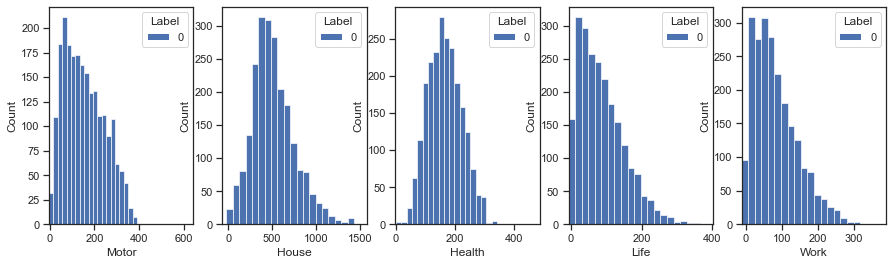

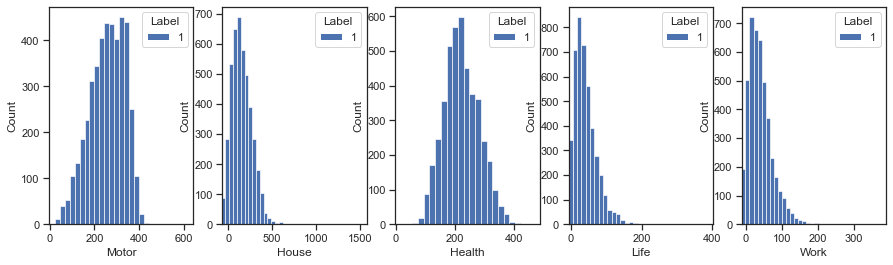

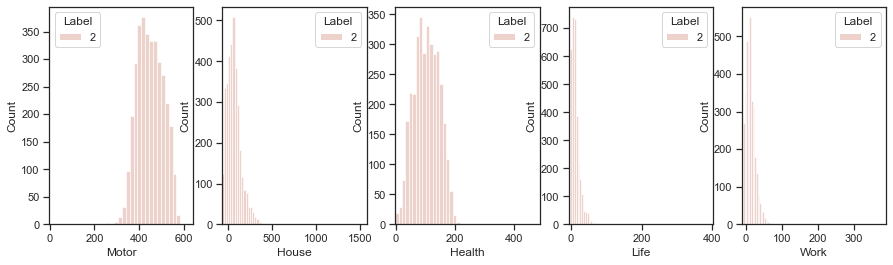

In [147]:
visualize_clustering(df_product[raw_features], df.Label, raw_features)

In [148]:
## ratio premiums

# scale data
minmax_scaler, birch_product_minmax = data_scaler(df_product_ratios, "minmax")
standard_scaler, birch_product_standard = data_scaler(df_product_ratios, "standard")
robust_scaler, birch_product_robust = data_scaler(df_product_ratios, "robust")

# model and labels
# for threshold in np.arange(0.1, 1, 0.1):
#     birch_product_clusters = Birch(threshold = threshold).fit(birch_product_minmax)
#     birch_product_labels = birch_product_clusters.labels_
#     print(threshold, set(birch_product_labels))

birch_product_clusters = Birch(threshold = 0.2).fit(birch_product_minmax)
birch_product_labels = birch_product_clusters.labels_

# overview of the clusters
df["Label"] = birch_product_labels
evaluate_clustering(birch_product_minmax, df.Label)
summarise_clustering(df_product[ratio_features], df.Label, "MotorRatio")

Silhouette score: 0.26
Davies-Bouldin score: 1.19
Calinski-Harabasz score: 2306.72
Cluster sizes:
           obs     %
Cluster            
0        7778  77.2
1        2009  19.9
2         285   2.8


,MotorRatio,HouseRatio,HealthRatio,LifeRatio,WorkRatio
Cluster,,,,,
2,0.142669,0.264707,0.198693,0.179557,0.214375
1,0.182126,0.496972,0.164794,0.083158,0.072950
0,0.521650,0.151310,0.249464,0.038937,0.038639


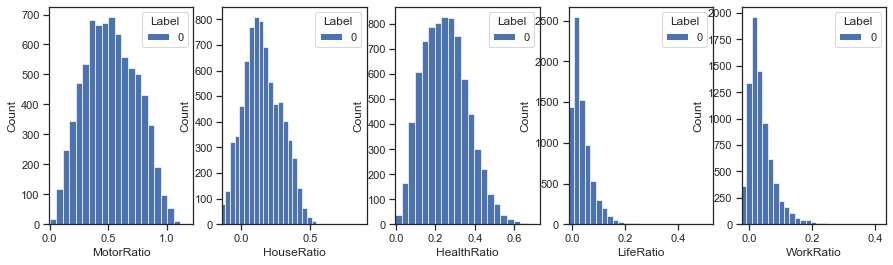

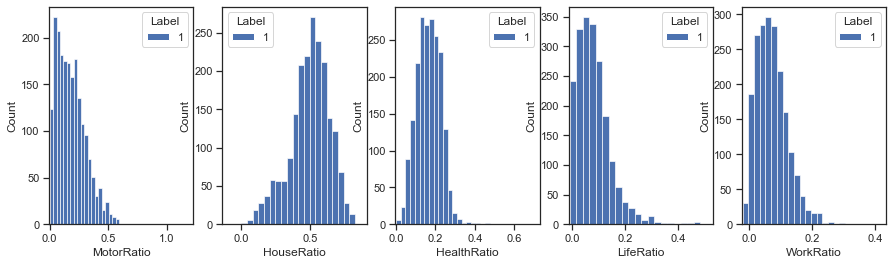

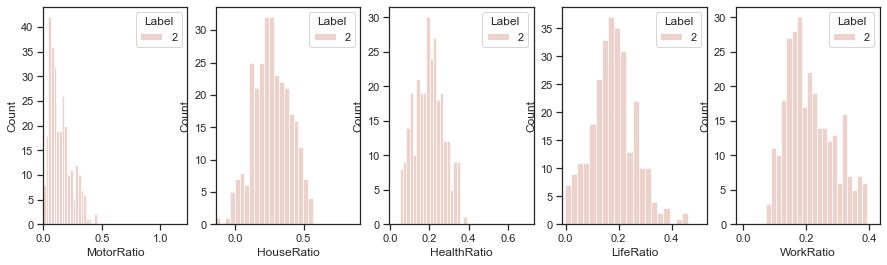

In [149]:
visualize_clustering(df_product[ratio_features], df.Label, ratio_features)

#### 3.3.5. SOM + HC

In [150]:
## non-ratio premiums

som_product = df_product_raw.copy()
minmax_scaler, som_product_minmax = data_scaler(som_product, "minmax")
standard_scaler, som_product_standard = data_scaler(som_product, "standard")
robust_scaler, som_product_robust = data_scaler(som_product, "robust")

names = list(df_product_raw.columns)

np.random.seed(15)

sm = sompy.SOMFactory().build(
    data = som_product_standard.values,
    mapsize = (20, 20),
    # normalization = "var",
    initialization = "random",
    component_names = names,
    lattice = "rect",
    training = "batch"
)

sm.train(
    n_job = 4,
    train_rough_len = 100,
    train_finetune_len = 100
)

 Training...
 random_initialization took: 0.001000 seconds
 Rough training...
 radius_ini: 7.000000 , radius_final: 1.166667, trainlen: 100

 epoch: 1 ---> elapsed time:  0.036000, quantization error: 1.159290

 epoch: 2 ---> elapsed time:  0.037000, quantization error: 1.718162

 epoch: 3 ---> elapsed time:  0.037000, quantization error: 1.267062

 epoch: 4 ---> elapsed time:  0.041000, quantization error: 1.208567

 epoch: 5 ---> elapsed time:  0.036000, quantization error: 1.196035

 epoch: 6 ---> elapsed time:  0.036000, quantization error: 1.186767

 epoch: 7 ---> elapsed time:  0.036000, quantization error: 1.180811

 epoch: 8 ---> elapsed time:  0.037000, quantization error: 1.173914

 epoch: 9 ---> elapsed time:  0.036000, quantization error: 1.163239

 epoch: 10 ---> elapsed time:  0.037000, quantization error: 1.149421

 epoch: 11 ---> elapsed time:  0.036000, quantization error: 1.136247

 epoch: 12 ---> elapsed time:  0.035000, quantization error: 1.124122

 epoch: 13 ---> 

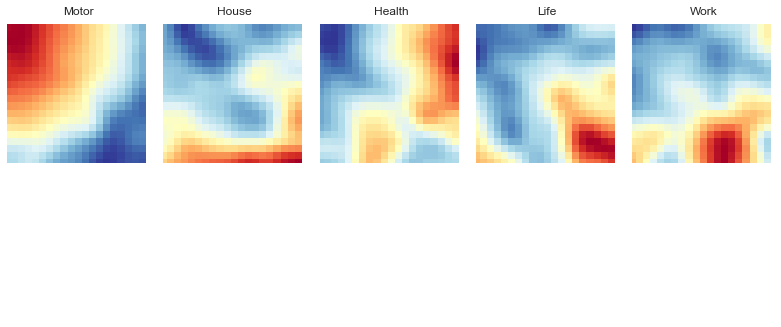

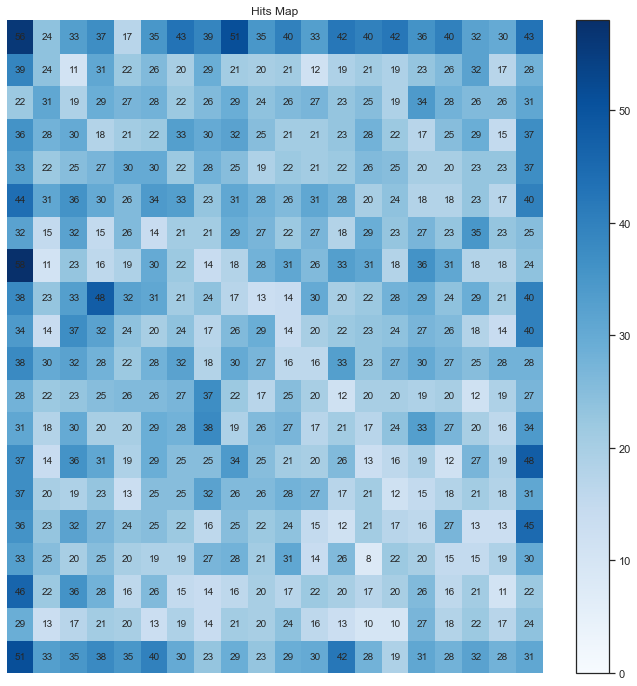

In [151]:
# SOM results
final_clusters = pd.DataFrame(sm._data, columns = raw_features)
my_labels = pd.Series(sm._bmu[0], name = "Label")
final_clusters = pd.concat([final_clusters, my_labels], axis = 1)

# visualization 1
view2D  = View2DPacked(10, 10, "", text_size = 7)
view2D.show(sm, col_sz = 5, what = 'codebook',) #which_dim="all", denormalize=True)
plt.show()

# visualization 2
vhts  = BmuHitsView(12,12,"Hits Map",text_size=7)
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=10, cmap="Blues", logaritmic=False)

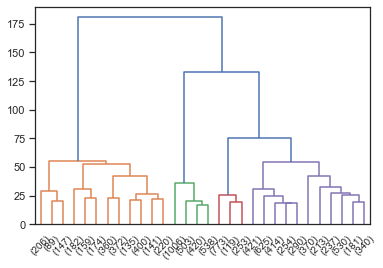

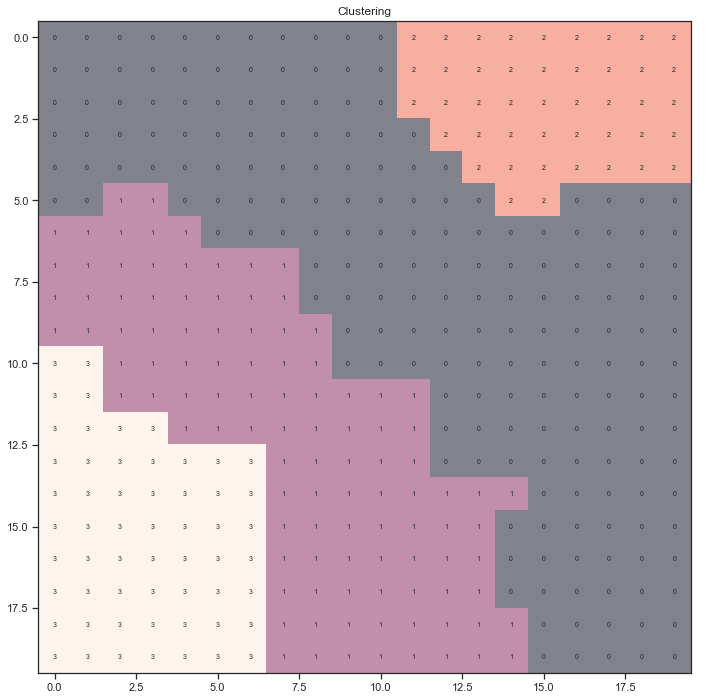

In [152]:
# apply HC to SOM results
som_product_linkage = hierarchy.linkage(sm._data, method = "ward")
hierarchy.dendrogram(
    som_product_linkage,
    truncate_mode = "lastp",
    p = 30,
    orientation = "top",
    color_threshold = 60
)

# k = 2 or k = 4 (from dendrogram)
hc_product_labels = AgglomerativeClustering(4).fit_predict(sm.codebook.matrix)
sm.cluster_labels = hc_product_labels

# visualize clusters
hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [153]:
# final SOM + HC clusters
db_final_clusters = AgglomerativeClustering(4).fit(sm._data)
db_final_labels = db_final_clusters.labels_

# overview of the clusters
df["Label"] = db_final_labels
evaluate_clustering(som_product_minmax, df.Label)
summarise_clustering(df_product[raw_features], df.Label)

Silhouette score: 0.22
Davies-Bouldin score: 1.19
Calinski-Harabasz score: 5112.17
Cluster sizes:
           obs     %
Cluster            
0        2585  25.7
1        3875  38.5
2        2467  24.5
3        1145  11.4


,Motor,House,Health,Life,Work
Cluster,,,,,
0,140.843103,420.788549,183.842669,91.038286,89.524665
1,322.548495,181.564735,170.287422,30.313412,29.850766
2,470.836940,29.142846,92.553636,7.876603,8.363101
3,206.649022,143.496900,287.751502,34.736175,30.343397


In [154]:
r2_variables(df[["Motor", "House", "Health", "Life", "Work", "Label"]], 'Label').drop("Label")

Motor     0.789140
House     0.407116
Health    0.558801
Life      0.445254
Work      0.459794
dtype: float64

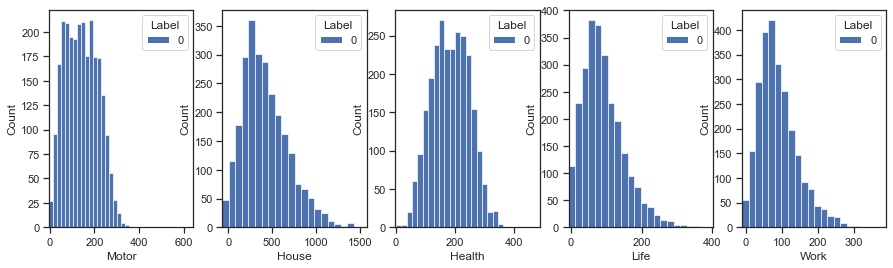

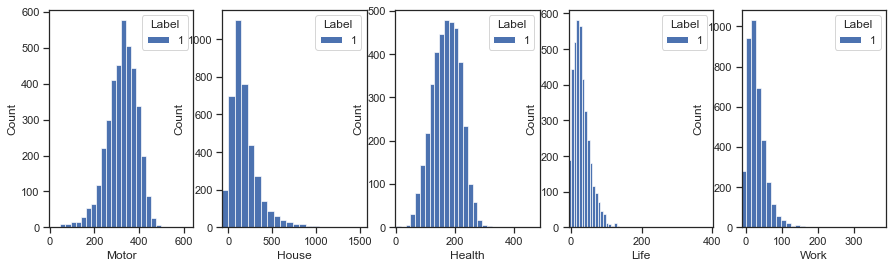

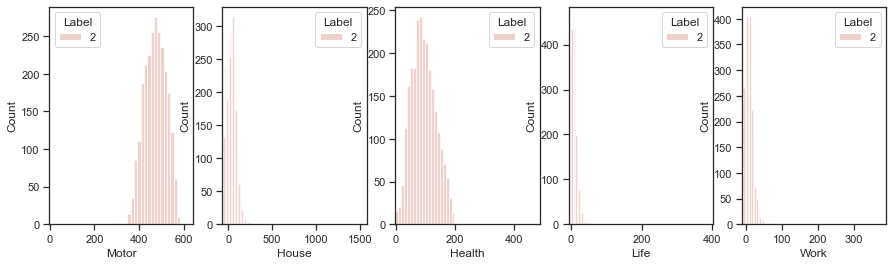

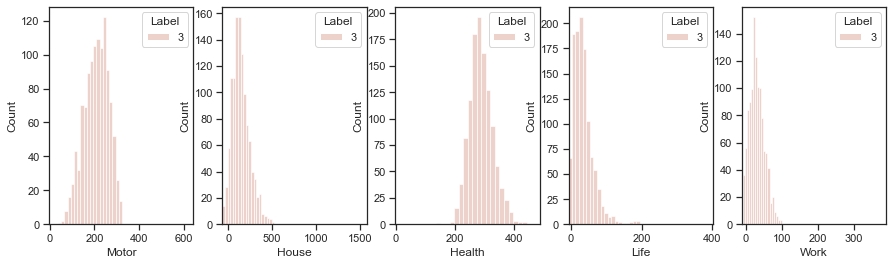

In [155]:
visualize_clustering(df_product[raw_features], df.Label, raw_features)

In [156]:
## ratio premiums

som_product = df_product_ratios.copy()
minmax_scaler, som_product_minmax = data_scaler(som_product, "minmax")
standard_scaler, som_product_standard = data_scaler(som_product, "standard")
robust_scaler, som_product_robust = data_scaler(som_product, "robust")

names = list(df_product_ratios.columns)

np.random.seed(15)

sm = sompy.SOMFactory().build(
    data = som_product_standard.values,
    mapsize = (20, 20),
    # normalization = "var",
    initialization = "random",
    component_names = names,
    lattice = "rect",
    training = "batch"
)

sm.train(
    n_job = 4,
    train_rough_len = 100,
    train_finetune_len = 100
)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 7.000000 , radius_final: 1.166667, trainlen: 100

 epoch: 1 ---> elapsed time:  0.035000, quantization error: 1.186153

 epoch: 2 ---> elapsed time:  0.036000, quantization error: 1.762420

 epoch: 3 ---> elapsed time:  0.035000, quantization error: 1.315106

 epoch: 4 ---> elapsed time:  0.036000, quantization error: 1.233531

 epoch: 5 ---> elapsed time:  0.036000, quantization error: 1.214044

 epoch: 6 ---> elapsed time:  0.038000, quantization error: 1.204830

 epoch: 7 ---> elapsed time:  0.035000, quantization error: 1.196053

 epoch: 8 ---> elapsed time:  0.036000, quantization error: 1.186873

 epoch: 9 ---> elapsed time:  0.035000, quantization error: 1.177395

 epoch: 10 ---> elapsed time:  0.036000, quantization error: 1.169084

 epoch: 11 ---> elapsed time:  0.035000, quantization error: 1.162189

 epoch: 12 ---> elapsed time:  0.037000, quantization error: 1.156224

 epoch: 13 ---> 

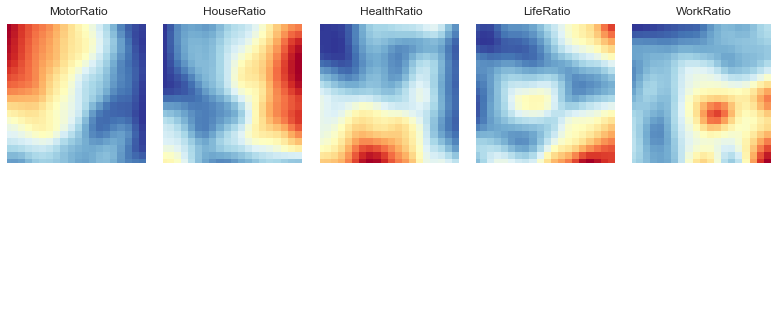

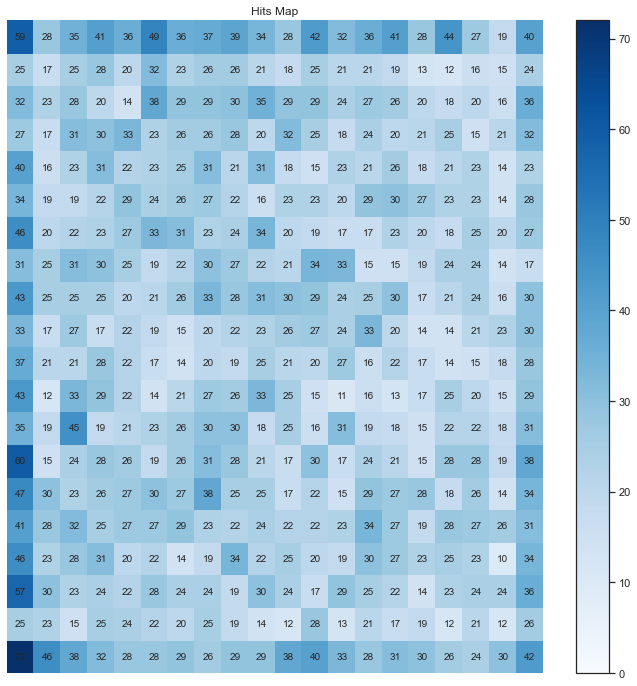

In [157]:
# SOM results
final_clusters = pd.DataFrame(sm._data, columns = ratio_features)
my_labels = pd.Series(sm._bmu[0], name = "Label")
final_clusters = pd.concat([final_clusters, my_labels], axis = 1)

# visualization 1
view2D  = View2DPacked(10, 10, "", text_size = 7)
view2D.show(sm, col_sz = 5, what = 'codebook',)
plt.show()

# visualization 2
vhts  = BmuHitsView(12,12,"Hits Map",text_size=7)
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=10, cmap="Blues", logaritmic=False)

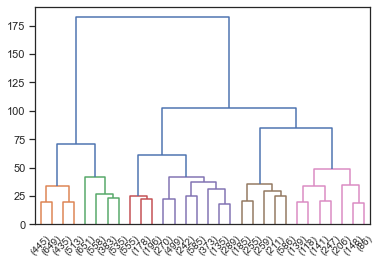

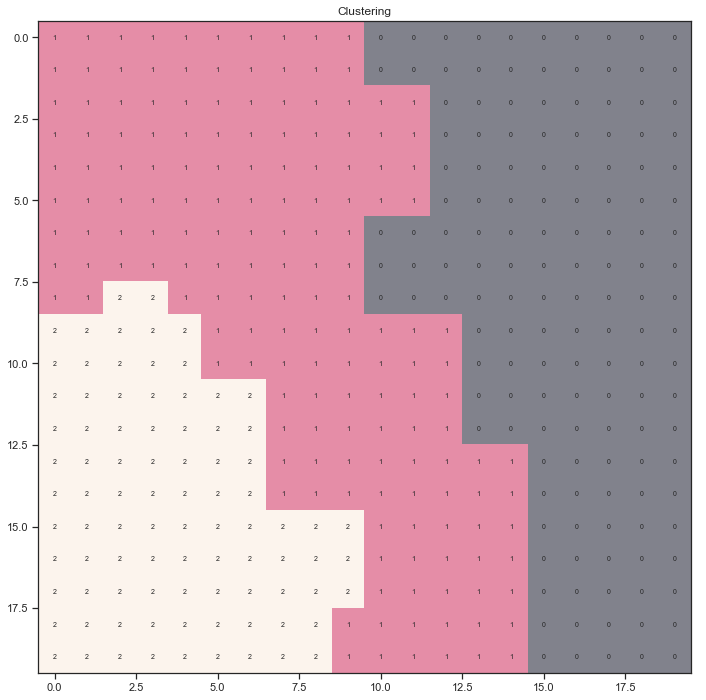

In [158]:
# apply HC to SOM results
som_product_linkage = hierarchy.linkage(sm._data, method = "ward")
hierarchy.dendrogram(
    som_product_linkage,
    truncate_mode = "lastp",
    p = 30,
    orientation = "top",
    color_threshold = 60
)

# k = 2 or k = 4 (from dendrogram)
hc_product_labels = AgglomerativeClustering(3).fit_predict(sm.codebook.matrix)
sm.cluster_labels = hc_product_labels

# visualize clusters
hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [159]:
# final SOM + HC clusters
db_final_clusters = AgglomerativeClustering(3).fit(sm._data)
db_final_labels = db_final_clusters.labels_

# overview of the clusters
df["Label"] = db_final_labels
evaluate_clustering(som_product_standard, df.Label)
summarise_clustering(df_product[ratio_features], df.Label, sort_by = "MotorRatio")

Silhouette score: 0.22
Davies-Bouldin score: 1.66
Calinski-Harabasz score: 3865.38
Cluster sizes:
           obs     %
Cluster            
0        2581  25.6
1        4169  41.4
2        3322  33.0


,MotorRatio,HouseRatio,HealthRatio,LifeRatio,WorkRatio
Cluster,,,,,
0,0.174695,0.417946,0.202955,0.101358,0.103046
2,0.353762,0.239181,0.304376,0.052383,0.050298
1,0.680705,0.090542,0.190230,0.020500,0.018023


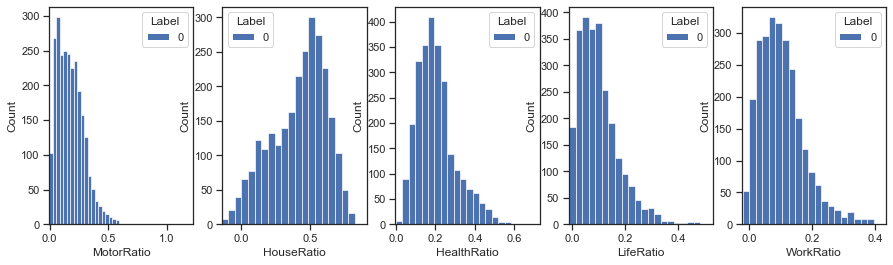

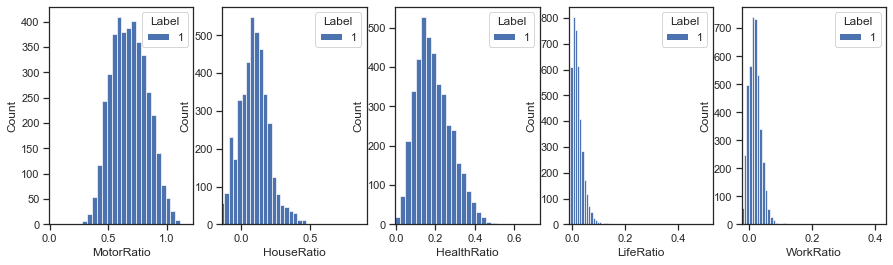

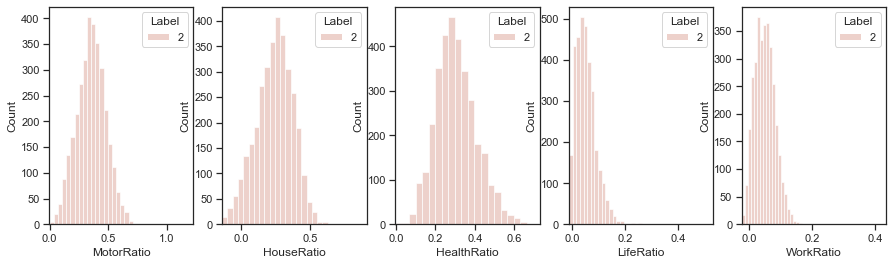

In [160]:
visualize_clustering(df_product[ratio_features], df.Label, ratio_features)

#### 3.3.6. SOM + KMeans

In [161]:
## non-ratio premiums

som_product = df_product_raw.copy()
minmax_scaler, som_product_minmax = data_scaler(som_product, "minmax")
standard_scaler, som_product_standard = data_scaler(som_product, "standard")
robust_scaler, som_product_robust = data_scaler(som_product, "robust")

names = list(df_product_raw.columns)

np.random.seed(15)

sm = sompy.SOMFactory().build(
    data = som_product_standard.values,
    mapsize = (10, 10),
    # normalization = "var",
    initialization = "pca",
    component_names = names,
    lattice = "hexa",
    training = "batch"
)

sm.train(
    n_job = 4,
    train_rough_len = 100,
    train_finetune_len = 100
)

 Training...
 pca_linear_initialization took: 0.004000 seconds
 Rough training...
 radius_ini: 2.000000 , radius_final: 1.000000, trainlen: 100

 epoch: 1 ---> elapsed time:  0.026000, quantization error: 0.977974

 epoch: 2 ---> elapsed time:  0.023000, quantization error: 1.512737

 epoch: 3 ---> elapsed time:  0.025000, quantization error: 1.377804

 epoch: 4 ---> elapsed time:  0.022000, quantization error: 1.367886

 epoch: 5 ---> elapsed time:  0.021000, quantization error: 1.361593

 epoch: 6 ---> elapsed time:  0.026000, quantization error: 1.356671

 epoch: 7 ---> elapsed time:  0.025000, quantization error: 1.352101

 epoch: 8 ---> elapsed time:  0.022000, quantization error: 1.347677

 epoch: 9 ---> elapsed time:  0.020000, quantization error: 1.343272

 epoch: 10 ---> elapsed time:  0.020000, quantization error: 1.338865

 epoch: 11 ---> elapsed time:  0.020000, quantization error: 1.334464

 epoch: 12 ---> elapsed time:  0.019000, quantization error: 1.330096

 epoch: 13 -

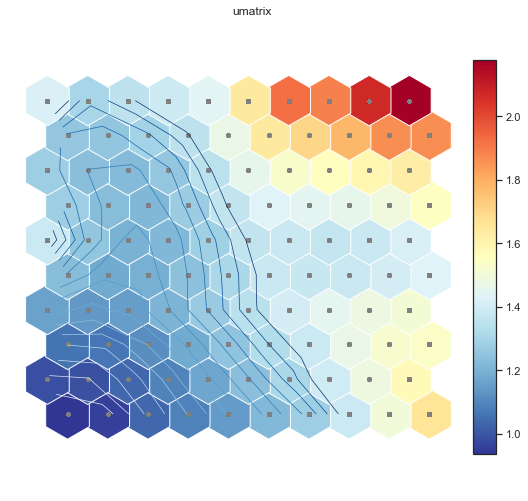

In [162]:
# Here you have U-matrix
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=12, show_text=True)

UMAT = u.show(
    sm, 
    distance=10, 
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=False
)

np.flip(UMAT[1], axis=1); # U-matrix values - they match with the plot colors

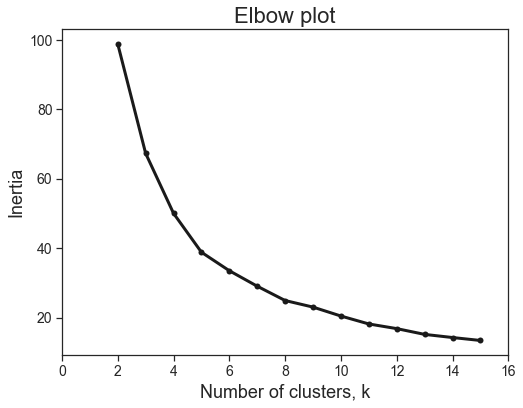

In [163]:
# SOM + KMeans
plot_elbow(sm.codebook.matrix, 15, "kmeans")

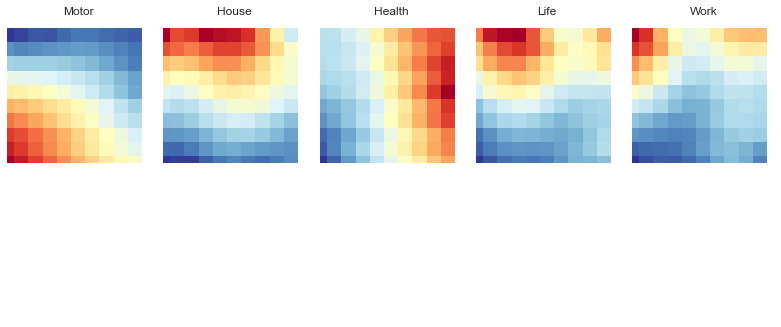

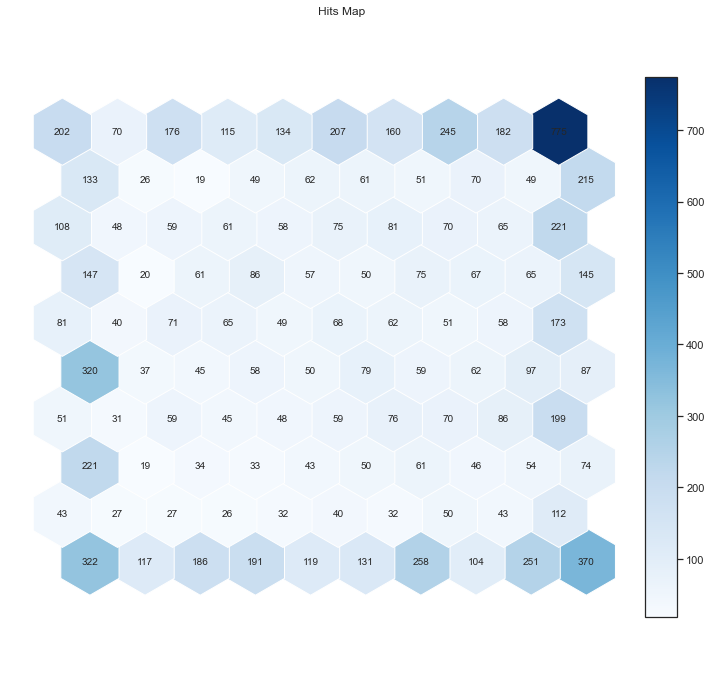

In [164]:
# SOM results
final_clusters = pd.DataFrame(sm._data, columns = raw_features)
my_labels = pd.Series(sm._bmu[0], name = "Label")
final_clusters = pd.concat([final_clusters, my_labels], axis = 1)

# visualization 1
view2D  = View2DPacked(10, 10, "", text_size = 7)
view2D.show(sm, col_sz = 5, what = 'codebook',) #which_dim="all", denormalize=True)
plt.show()

# visualization 2
vhts  = BmuHitsView(12,12,"Hits Map",text_size=7)
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=10, cmap="Blues", logaritmic=False)

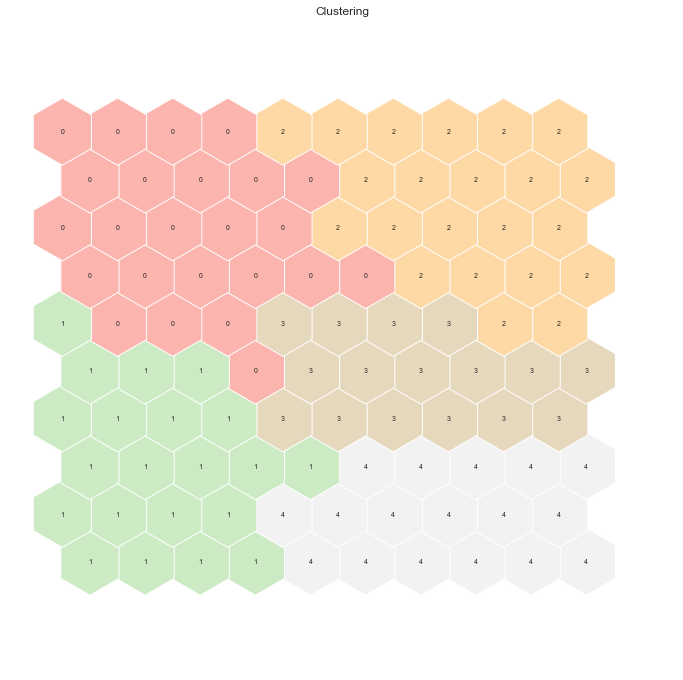

In [165]:
kmeans = KMeans(n_clusters = 5, random_state = 15)
km_product_labels = kmeans.fit_predict(sm.codebook.matrix)
sm.cluster_labels = km_product_labels

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm, anotate = True, onlyzeros = False, labelsize = 7, cmap = "Pastel1")

plt.show()

In [166]:
# final SOM + KMeans clusters
km_final_clusters = KMeans(5).fit(sm._data)
km_final_labels = km_final_clusters.labels_

df["Label"] = km_final_labels
evaluate_clustering(som_product_standard, df.Label)
summarise_clustering(df_product[raw_features], df.Label, "Motor")

Silhouette score: 0.24
Davies-Bouldin score: 1.46
Calinski-Harabasz score: 4455.68
Cluster sizes:
           obs     %
Cluster            
0        1214  12.1
1        3192  31.7
2        2543  25.2
3        1010  10.0
4        2113  21.0


,Motor,House,Health,Life,Work
Cluster,,,,,
0,125.253534,458.973806,158.537339,83.203114,131.816573
3,159.003772,503.712525,171.663762,116.793267,39.316545
4,197.413606,195.511311,268.961425,40.206171,43.140327
1,338.681883,141.359226,166.391701,27.344189,28.456175
2,472.380488,38.231695,89.508384,8.177298,8.157802


In [167]:
r2_variables(df[["Motor", "House", "Health", "Life", "Work", "Label"]], 'Label').drop("Label")

Motor     0.843537
House     0.505689
Health    0.670172
Life      0.520518
Work      0.654472
dtype: float64

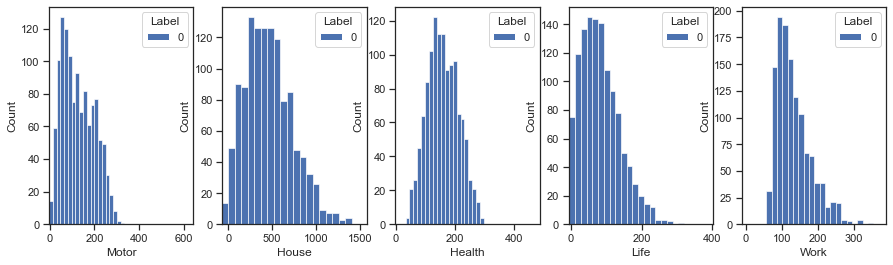

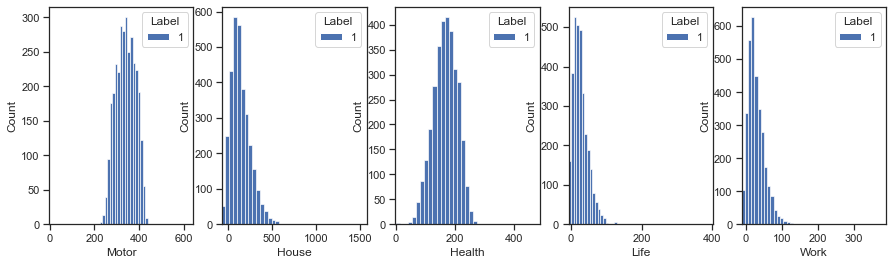

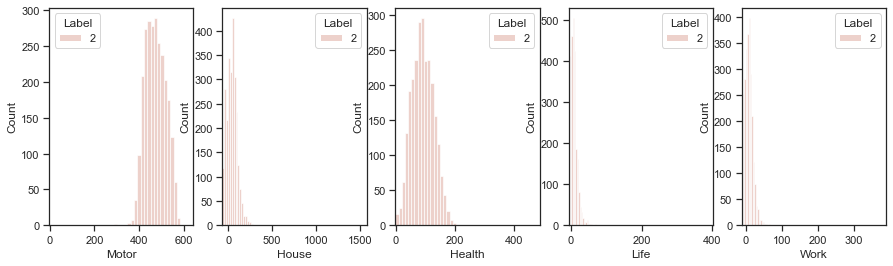

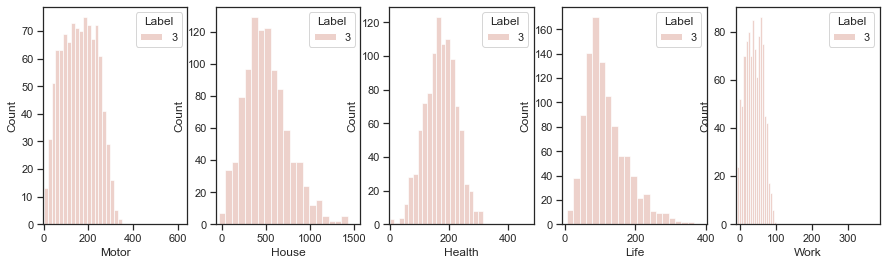

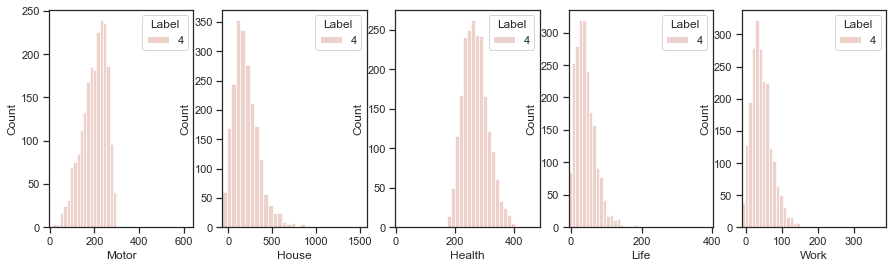

In [168]:
visualize_clustering(df_product[raw_features], df.Label, raw_features)

#### Final Sociodemographic clustering solution

In [169]:
# final sociodemographic clustering solution
df_sociodem = df[["Generation", "Age", "YearSal", "EducDeg", "Children"]]

# scale data
kp_sociodem = df_sociodem[["YearSal", "EducDeg", "Children"]]
minmax_scaler, kp_sociodem_minmax = data_scaler(kp_sociodem, "minmax")
standard_scaler, kp_sociodem_standard = data_scaler(kp_sociodem, "standard")

# # elbow plot
# plot_elbow(kp_sociodem_minmax, nmax_clusters = 10, algorithm = "kprototypes", cat_index = [1, 2])

# compute centroids and labels with k = 4
kp_sociodem_centroids, kp_sociodem_labels = kprototypes_clustering(kp_sociodem_minmax, k = 4, cat_index = [1, 2], init = "Huang")

# cluster overview
df["Label"] = kp_sociodem_labels
evaluate_clustering(kp_sociodem_minmax, kp_sociodem_labels)
summarise_clustering(kp_sociodem, df.Label, sort_by = "YearSal")

Silhouette score: 0.4
Davies-Bouldin score: 1.95
Calinski-Harabasz score: 5683.86
Cluster sizes:
           obs     %
Cluster            
0        1148  11.4
1        3683  36.6
2        2772  27.5
3        2469  24.5


,YearSal,EducDeg,Children
Cluster,,,
0,19469.706824,1.420732,0.852787
2,25799.389357,2.056277,0.902958
1,27405.560426,3.065979,0.964160
3,43681.619319,2.607128,0.040097


In [170]:
r2_variables(df[["YearSal", "EducDeg", "Children", "Label"]], 'Label').drop("Label")

YearSal     0.476979
EducDeg     0.490381
Children    0.707315
dtype: float64

In [171]:
sociodem_labels = kp_sociodem_labels

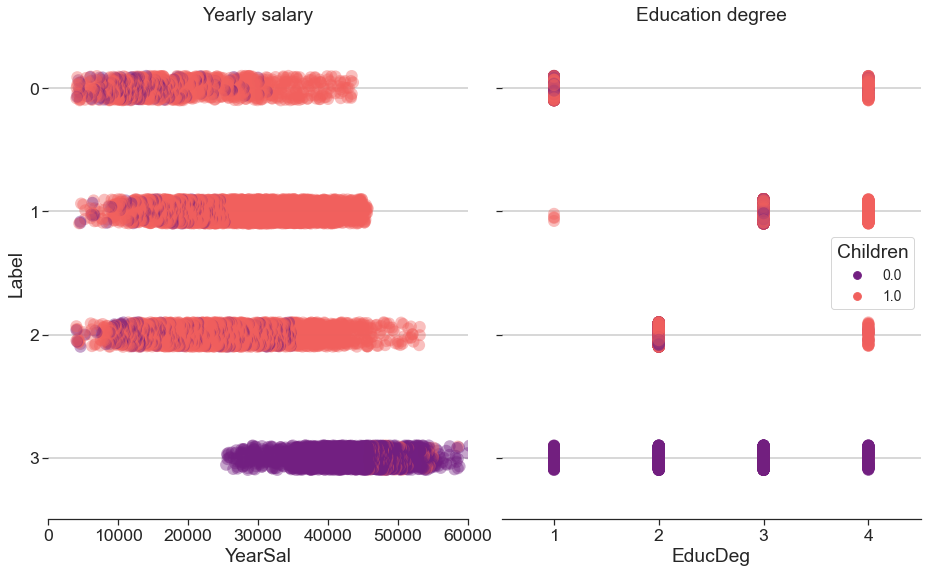

In [172]:
# strip plot for visualization of the final sociodemographic clusters
xlims = ([0, 60000], [0.5, 4.5])

sns.set(style = "ticks", font_scale = 1.6)

# test = df.copy()
# test.EducDeg = test.EducDeg.replace(educ_mapper)

x_vars = ["YearSal", "EducDeg"]

g = sns.PairGrid(df.sort_values("YearSal", ascending = False),
                 x_vars = x_vars, y_vars = "Label",
                 hue = "Children",
                 height = 8,
                 aspect = 0.85)

g.map(sns.stripplot, size = 12, orient = "h", jitter = True,
      palette = "magma", alpha = 0.4)

# add better labels
g.set(ylabel = "Label")

titles = ["Yearly salary", "Education degree"]

for ax, xlim, title in zip(g.axes.flat, xlims, titles):

    # set axis titles
    ax.set_xlim(xlim)
    ax.set(title = title)
    # horizontal grid
    ax.xaxis.grid(False)
    ax.yaxis.grid(True, lw = 1.5)

plt.legend(title = "Children", prop={'size': 14})
sns.despine(left = True, bottom = False)

plt.savefig('SociodemFinalClusters.jpeg', dpi=300, bbox_inches='tight')

#### Final Value clustering solution

In [173]:
df_value = df_transformed[[
    "FirstPolAge",
    # "CustYears",
    "ClaimsRate",
    "PremTotal",
    "EffortRatio"
]]

# scale data
som_value = df_value[["FirstPolAge", "PremTotal", "EffortRatio"]]
minmax_scaler, som_value_minmax = data_scaler(som_value, "minmax")
standard_scaler, som_value_standard = data_scaler(som_value, "standard")
robust_scaler, som_value_robust = data_scaler(som_value, "robust")

names = ["FirstPolAge", "PremTotal", "EffortRatio"]

np.random.seed(15)

sm = sompy.SOMFactory().build(
    data = som_value_standard.values,
    mapsize = (20, 20),
    # normalization = "var",
    initialization = "pca",
    # neighborhood = "gaussian",
    component_names = names,
    lattice = "hexa",
    training = "batch"
)

sm.train(
    n_job = 4,
    train_rough_len = 100,
    train_finetune_len = 100
)

 Training...
 pca_linear_initialization took: 0.006000 seconds
 Rough training...
 radius_ini: 3.000000 , radius_final: 1.000000, trainlen: 100

 epoch: 1 ---> elapsed time:  0.038000, quantization error: 0.514996

 epoch: 2 ---> elapsed time:  0.041000, quantization error: 1.029659

 epoch: 3 ---> elapsed time:  0.039000, quantization error: 0.940819

 epoch: 4 ---> elapsed time:  0.034000, quantization error: 0.927265

 epoch: 5 ---> elapsed time:  0.037000, quantization error: 0.917597

 epoch: 6 ---> elapsed time:  0.033000, quantization error: 0.909679

 epoch: 7 ---> elapsed time:  0.033000, quantization error: 0.902423

 epoch: 8 ---> elapsed time:  0.033000, quantization error: 0.895506

 epoch: 9 ---> elapsed time:  0.036000, quantization error: 0.888787

 epoch: 10 ---> elapsed time:  0.032000, quantization error: 0.881965

 epoch: 11 ---> elapsed time:  0.032000, quantization error: 0.875189

 epoch: 12 ---> elapsed time:  0.032000, quantization error: 0.868480

 epoch: 13 -

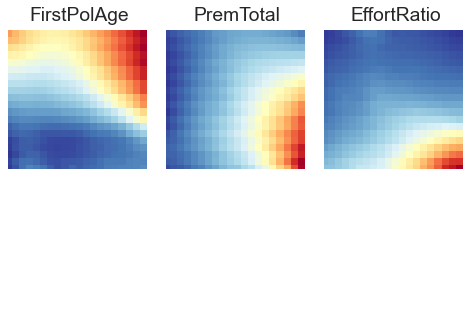

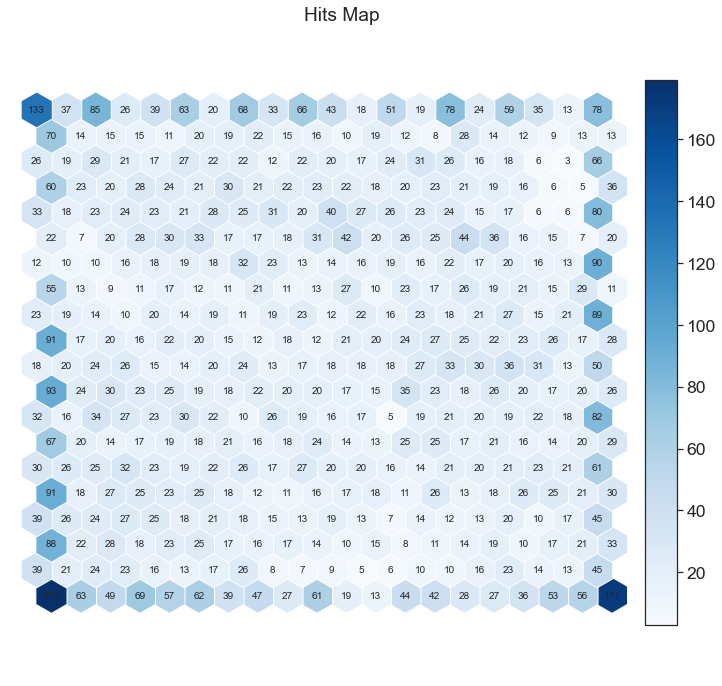

In [174]:
# SOM results
final_clusters = pd.DataFrame(sm._data, columns = ["FirstPolAge", "PremTotal", "EffortRatio"])
my_labels = pd.Series(sm._bmu[0], name = "Label")
final_clusters = pd.concat([final_clusters, my_labels], axis = 1)

# visualization 1
view2D  = View2DPacked(10, 10, "", text_size = 7)
view2D.show(sm, col_sz = 3, what = 'codebook',) #which_dim="all", denormalize=True)
plt.show()

# visualization 2
vhts  = BmuHitsView(12,12,"Hits Map",text_size=7)
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=10, cmap="Blues", logaritmic=False)

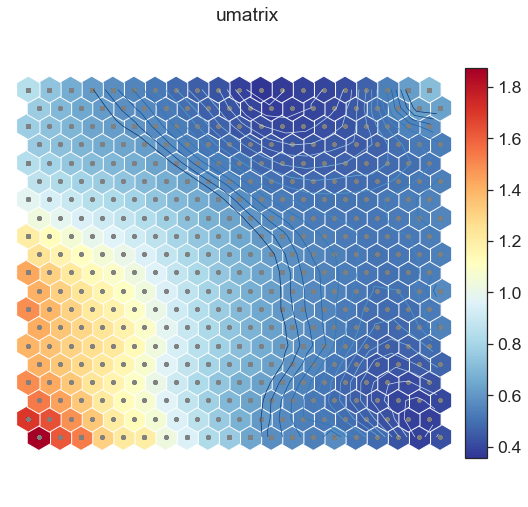

In [175]:
# Here you have U-matrix
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=12, show_text=True)

UMAT = u.show(
    sm, 
    distance=10, 
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=False
)

np.flip(UMAT[1], axis=1); # U-matrix values - they match with the plot colors

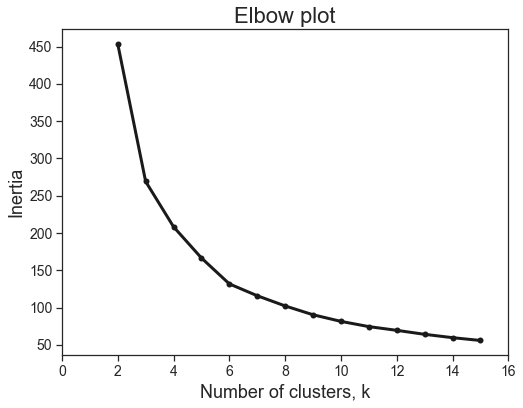

In [176]:
# SOM + KMeans
plot_elbow(sm.codebook.matrix, 15, "kmeans")

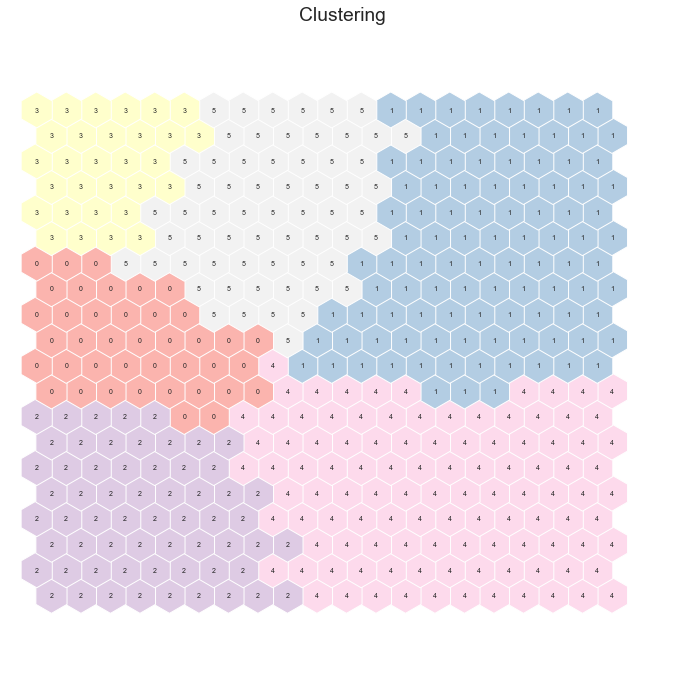

In [177]:
kmeans = KMeans(n_clusters = 6, random_state = 15)
km_value_labels = kmeans.fit_predict(sm.codebook.matrix)
sm.cluster_labels = km_value_labels  # setting the cluster labels of sompy

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm, anotate = True, onlyzeros = False, labelsize = 7, cmap = "Pastel1")

plt.show()

In [178]:
# final SOM + KMeans clusters
km_final_clusters = KMeans(6).fit(sm._data)
km_final_labels = km_final_clusters.labels_

df["Label"] = km_final_labels
evaluate_clustering(som_value_standard, df.Label)
summarise_clustering(som_value, df.Label, "FirstPolAge")

Silhouette score: 0.33
Davies-Bouldin score: 0.91
Calinski-Harabasz score: 8099.53
Cluster sizes:
           obs     %
Cluster            
0        2457  24.4
1         679   6.7
2        2513  25.0
3        1066  10.6
4        1513  15.0
5        1844  18.3


,FirstPolAge,PremTotal,EffortRatio
Cluster,,,
4,7.744878,31.177921,0.232517
2,7.952646,27.751340,0.178633
1,9.547865,35.909586,0.323186
0,24.180301,27.763971,0.150589
3,34.705441,32.687263,0.164272
5,42.818872,28.361318,0.138076


In [179]:
r2_variables(df[["FirstPolAge", "PremTotal", "EffortRatio", "Label"]], 'Label').drop("Label")

FirstPolAge    0.840759
PremTotal      0.732836
EffortRatio    0.728586
dtype: float64

In [180]:
value_labels = km_final_labels

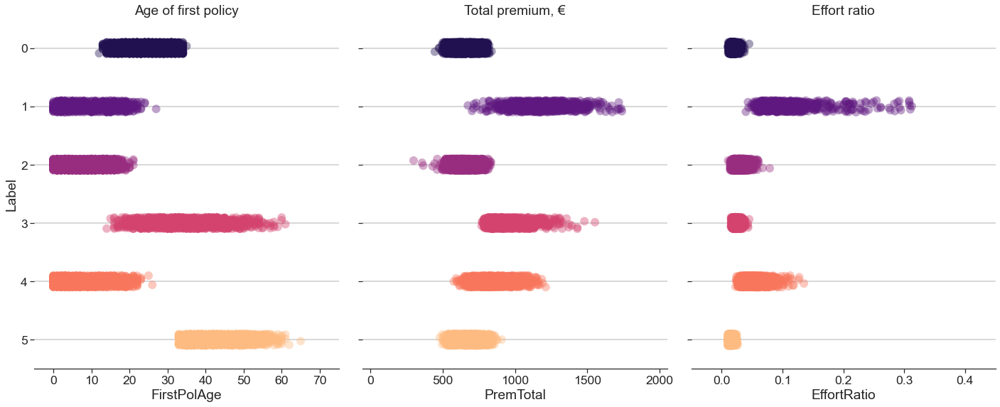

In [181]:
# strip plot for visualization of the final value clusters
xlims = ([-5, 75], [-50, 2050], [-0.05, 0.45])

sns.set(style = "ticks", font_scale = 1.6)

# test = df.copy()
# test.EducDeg = test.EducDeg.replace(educ_mapper)

x_vars = ["FirstPolAge", "PremTotal", "EffortRatio"]

g = sns.PairGrid(
    df.sort_values("PremTotal", ascending = False),
    x_vars = x_vars, 
    y_vars = "Label",
    height = 8,
    aspect = 0.85
)

g.map(
    sns.stripplot, 
    size = 12, 
    orient = "h", 
    jitter = True,
    palette = "magma", 
    alpha = 0.4
)

# add better labels
g.set(ylabel = "Label")

titles = ["Age of first policy", "Total premium, €", "Effort ratio"]

for ax, xlim, title in zip(g.axes.flat, xlims, titles):

    # set axis titles
    ax.set_xlim(xlim)
    ax.set(title = title)
    # horizontal grid
    ax.xaxis.grid(False)
    ax.yaxis.grid(True, lw = 1.5)

sns.despine(left = True, bottom = False)
plt.savefig('ValueFinalClusters.jpeg', dpi=300, bbox_inches='tight')

#### Final Product clustering solution

In [182]:
df_product = df[[
    "Motor",
    "MotorRatio",
    "House",
    "HouseRatio",
    "Health",
    "HealthRatio",
    "Life",
    "LifeRatio",
    "Work",
    "WorkRatio",
]]

# potentially relevant features to perform customer segmentation based on product
df_product_raw = df_transformed[[
    "Motor",
    "House",
    "Health",
    "Life",
    "Work"
]]

df_product_ratios = df_transformed[[
    "MotorRatio",
    "HouseRatio",
    "HealthRatio",
    "LifeRatio",
    "WorkRatio"
]]

raw_features = ["Motor", "House", "Health", "Life", "Work"]
ratio_features = ["MotorRatio", "HouseRatio", "HealthRatio", "LifeRatio", "WorkRatio"]

## non-ratio premiums
som_product = df_product_raw.copy()
minmax_scaler, som_product_minmax = data_scaler(som_product, "minmax")
standard_scaler, som_product_standard = data_scaler(som_product, "standard")
robust_scaler, som_product_robust = data_scaler(som_product, "robust")

names = list(df_product_raw.columns)

np.random.seed(15)

sm = sompy.SOMFactory().build(
    data = som_product_standard.values,
    mapsize = (10, 10),
    # normalization = "var",
    initialization = "pca",
    component_names = names,
    lattice = "hexa",
    training = "batch"
)

sm.train(
    n_job = 4,
    train_rough_len = 100,
    train_finetune_len = 100
)

 Training...
 pca_linear_initialization took: 0.006000 seconds
 Rough training...
 radius_ini: 2.000000 , radius_final: 1.000000, trainlen: 100

 epoch: 1 ---> elapsed time:  0.024000, quantization error: 0.977974

 epoch: 2 ---> elapsed time:  0.025000, quantization error: 1.512737

 epoch: 3 ---> elapsed time:  0.026000, quantization error: 1.377804

 epoch: 4 ---> elapsed time:  0.025000, quantization error: 1.367886

 epoch: 5 ---> elapsed time:  0.024000, quantization error: 1.361593

 epoch: 6 ---> elapsed time:  0.023000, quantization error: 1.356671

 epoch: 7 ---> elapsed time:  0.022000, quantization error: 1.352101

 epoch: 8 ---> elapsed time:  0.025000, quantization error: 1.347677

 epoch: 9 ---> elapsed time:  0.021000, quantization error: 1.343272

 epoch: 10 ---> elapsed time:  0.020000, quantization error: 1.338865

 epoch: 11 ---> elapsed time:  0.020000, quantization error: 1.334464

 epoch: 12 ---> elapsed time:  0.020000, quantization error: 1.330096

 epoch: 13 -

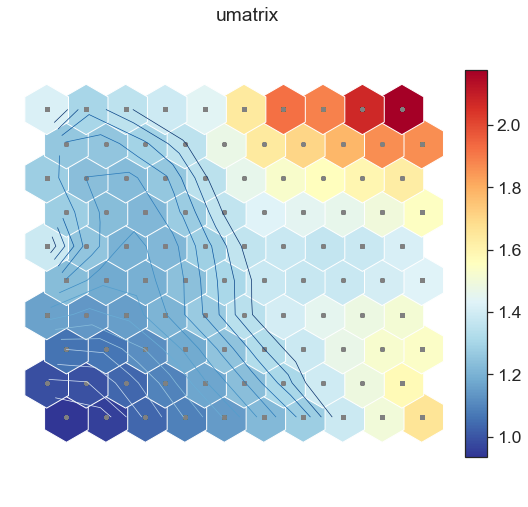

In [183]:
# Here you have U-matrix
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=12, show_text=True)

UMAT = u.show(
    sm, 
    distance=10, 
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=False
)

np.flip(UMAT[1], axis=1); # U-matrix values - they match with the plot colors

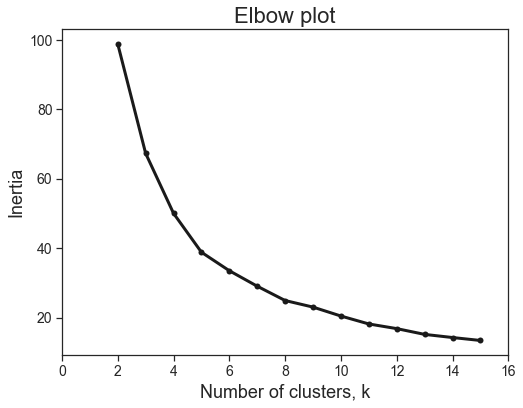

In [184]:
# SOM + KMeans
plot_elbow(sm.codebook.matrix, 15, "kmeans")

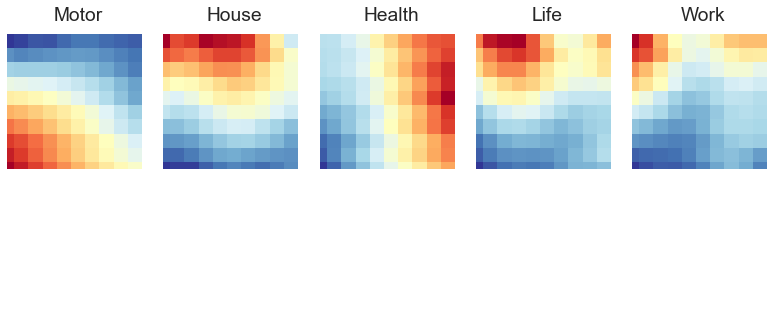

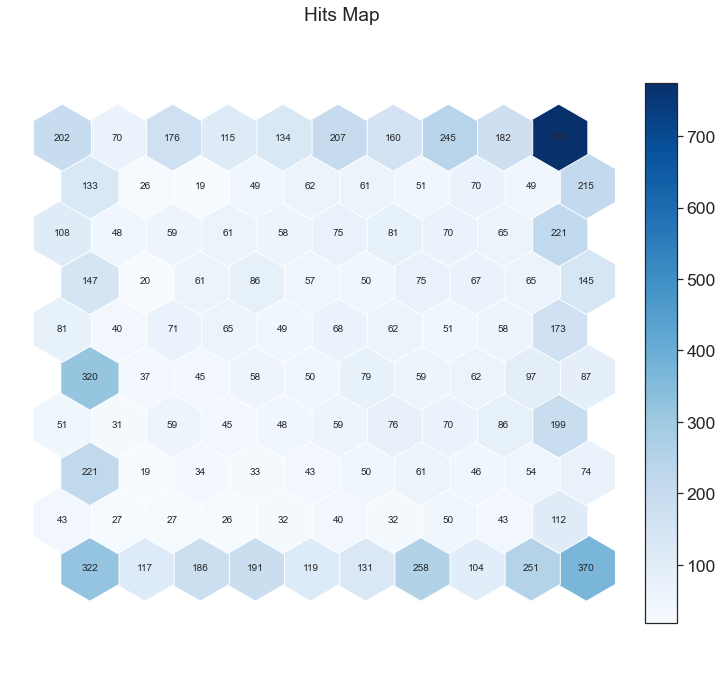

In [185]:
# SOM results
final_clusters = pd.DataFrame(sm._data, columns = raw_features)
my_labels = pd.Series(sm._bmu[0], name = "Label")
final_clusters = pd.concat([final_clusters, my_labels], axis = 1)

# visualization 1
view2D  = View2DPacked(10, 10, "", text_size = 7)
view2D.show(sm, col_sz = 5, what = 'codebook',) #which_dim="all", denormalize=True)
plt.show()

# visualization 2
vhts  = BmuHitsView(12,12,"Hits Map",text_size=7)
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=10, cmap="Blues", logaritmic=False)

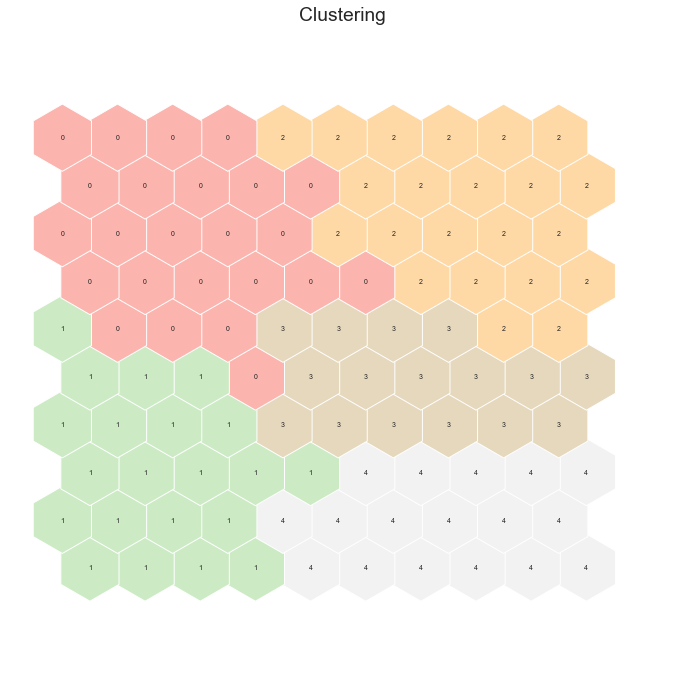

In [186]:
kmeans = KMeans(n_clusters = 5, random_state = 15)
km_product_labels = kmeans.fit_predict(sm.codebook.matrix)
sm.cluster_labels = km_product_labels

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm, anotate = True, onlyzeros = False, labelsize = 7, cmap = "Pastel1")

plt.show()

In [187]:
# final SOM + KMeans clusters
km_final_clusters = KMeans(5).fit(sm._data)
km_final_labels = km_final_clusters.labels_

df["Label"] = km_final_labels
evaluate_clustering(som_product_standard, df.Label)
summarise_clustering(df_product[raw_features], df.Label, "Motor")

Silhouette score: 0.24
Davies-Bouldin score: 1.46
Calinski-Harabasz score: 4455.68
Cluster sizes:
           obs     %
Cluster            
0        1214  12.1
1        3192  31.7
2        2543  25.2
3        1010  10.0
4        2113  21.0


,Motor,House,Health,Life,Work
Cluster,,,,,
0,125.253534,458.973806,158.537339,83.203114,131.816573
3,159.003772,503.712525,171.663762,116.793267,39.316545
4,197.413606,195.511311,268.961425,40.206171,43.140327
1,338.681883,141.359226,166.391701,27.344189,28.456175
2,472.380488,38.231695,89.508384,8.177298,8.157802


In [188]:
r2_variables(df[["Motor", "House", "Health", "Life", "Work", "Label"]], 'Label').drop("Label")

Motor     0.843537
House     0.505689
Health    0.670172
Life      0.520518
Work      0.654472
dtype: float64

In [189]:
product_labels = km_final_labels

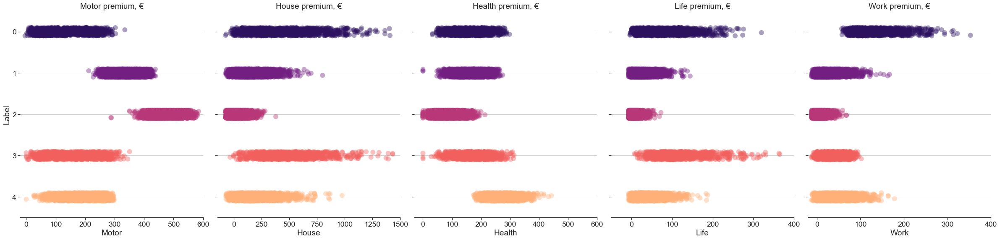

In [190]:
# strip plot for visualization of the final value clusters
xlims = ([-20, 600], [-150, 1500], [-30, 600], [-50, 400], [-20, 400])

sns.set(style = "ticks", font_scale = 1.6)

# test = df.copy()
# test.EducDeg = test.EducDeg.replace(educ_mapper)

x_vars = ["Motor", "House", "Health", "Life", "Work"]

g = sns.PairGrid(
    df.sort_values("Motor", ascending = False),
    x_vars = x_vars, 
    y_vars = "Label",
    height = 8,
    aspect = 0.85
)

g.map(
    sns.stripplot, 
    size = 12, 
    orient = "h", 
    jitter = True,
    palette = "magma", 
    alpha = 0.4
)

# add better labels
g.set(ylabel = "Label")

titles = ["Motor premium, €", "House premium, €", "Health premium, €", "Life premium, €", "Work premium, €"]

for ax, xlim, title in zip(g.axes.flat, xlims, titles):
    ax.set_xlim(xlim)
    ax.set(title = title)
    ax.xaxis.grid(False)
    ax.yaxis.grid(True)

sns.despine(left = True, bottom = False)
plt.savefig('ProductFinalClusters.jpeg', dpi=300, bbox_inches='tight')

#### Joining clusters (Hierarchical)

In [191]:
# def cluster_profiles(df, label_columns, figsize, compar_titles=None):
#     """
#     Pass df with labels columns of one or multiple clustering labels. 
#     Then specify this label columns to perform the cluster profile according to them.
#     """
#     if compar_titles == None:
#         compar_titles = [""]*len(label_columns)
        
#     sns.set()
#     fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
#     for ax, label, titl in zip(axes, label_columns, compar_titles):
#         # Filtering df
#         drop_cols = [i for i in label_columns if i!=label]
#         dfax = df.drop(drop_cols, axis=1)
        
#         # Getting the cluster centroids and counts
#         centroids = dfax.groupby(by=label, as_index=False).mean()
#         counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
#         counts.columns = [label, "counts"]
        
#         # Setting Data
#         pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
#         sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

#         #Setting Layout
#         handles, _ = ax[0].get_legend_handles_labels()
#         cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
#         ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
#         ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
#         ax[0].axhline(color="black", linestyle="--")
#         ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
#         ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
#         ax[1].set_xticklabels(cluster_labels)
#         ax[1].set_xlabel("")
#         ax[1].set_ylabel("Absolute Frequency")
#         ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
#     plt.subplots_adjust(hspace=0.4, top=0.90)
#     plt.suptitle("Cluster Simple Profilling", fontsize=23)
#     plt.show()


# def get_ss_variables(df):
#     """Get the SS for each variable
#     """
#     ss_vars = df.var() * (df.count() - 1)
#     return ss_vars


# def r2_variables(df, labels):
#     """Get the R² for each variable
#     """
#     sst_vars = get_ss_variables(df)
#     ssw_vars = np.sum(df.groupby(labels).apply(get_ss_variables))
#     return 1 - ssw_vars/sst_vars

In [192]:
# print("Sociodemographic labels:", Counter(sociodem_labels))
# print("Value labels:", Counter(value_labels))
# print("Product labels:", Counter(product_labels))

In [193]:
# standard_scaler, km_product_standard = data_scaler(df_product_raw, "standard")
# km_product_standard["Label"]=product_labels

In [194]:
# # merging with hierarchical
# df_ = pd.concat(
#     [
#     kp_sociodem_minmax.rename(columns = {"Label": "sociodem"}), 
#     som_value_standard.rename(columns = {"Label": "value"}),
#     km_product_standard.rename(columns = {"Label": "product"})
#     ], axis = 1
# )

# df_centroids = df_.groupby(["sociodem", "value", "product"]).mean()

# hclust = AgglomerativeClustering(
#     linkage='ward', 
#     affinity='euclidean', 
#     distance_threshold=0, 
#     n_clusters=None
# )
# hclust_labels = hclust.fit_predict(df_centroids)

# counts = np.zeros(hclust.children_.shape[0])
# n_samples = len(hclust.labels_)

# # hclust.children_ contains the observation ids that are being merged together
# # At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
# for i, merge in enumerate(hclust.children_):
#     # track the number of observations in the current cluster being formed
#     current_count = 0
#     for child_idx in merge:
#         if child_idx < n_samples:
#             # If this is True, then we are merging an observation
#             current_count += 1  # leaf node
#         else:
#             # Otherwise, we are merging a previously formed cluster
#             current_count += counts[child_idx - n_samples]
#     counts[i] = current_count

# # the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# # the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# # the counts indicate the number of points being merged (dendrogram's x-axis)
# linkage_matrix = np.column_stack(
#     [hclust.children_, hclust.distances_, counts]
# ).astype(float)

# # Plot the corresponding dendrogram
# sns.set()
# fig = plt.figure(figsize=(11,5))
# # The Dendrogram parameters need to be tuned
# y_threshold = 1.5
# hierarchy.dendrogram(
#     linkage_matrix, 
#     truncate_mode='level', 
#     labels=df_centroids.index, 
#     p=5, 
#     color_threshold=y_threshold, 
#     above_threshold_color='k'
# )
# plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
# plt.xlabel('Number of points in node (or index of point if no parenthesis)')
# plt.ylabel(f'Euclidean Distance', fontsize=13)
# plt.show()

# # Re-running the Hierarchical clustering based on the correct number of clusters
# hclust = AgglomerativeClustering(
#     linkage = 'ward', 
#     affinity = 'euclidean', 
#     n_clusters = 3
# )
# hclust_labels = hclust.fit_predict(df_centroids)
# df_centroids['hclust_labels'] = hclust_labels

# # Mapper between concatenated clusters and hierarchical clusters
# cluster_mapper = df_centroids['hclust_labels'].to_dict()

# df_final = df_.copy()

# # Mapping the hierarchical clusters on the centroids to the observations
# df_final['merged_labels'] = df_final.apply(
#     lambda row: cluster_mapper[
#         (row['sociodem'], row['value'], row["product"])
#     ], axis=1
# )

# # Merged cluster centroids
# cluster_profiles(
#     df = df_final[["EducDeg", "Motor", "House", "Health", "Life", "Work","PremTotal", "sociodem", "value", "product"]], 
#     label_columns = ['sociodem', 'value', 'product'], 
#     figsize = (28, 13), 
#     compar_titles = ["Sociodem clustering", "Value clustering", "Product clusters", "merged_labels"]
# )

# # umap of hierarchical
# import umap

# reducer = umap.UMAP(metric = 'euclidean')
# cluster_data = df_final[["Motor", "House", "Health", "Life", "Work","PremTotal"]].values
# # scaled_cluster_data = MinMaxScaler().fit_transform(cluster_data)
# embedding = reducer.fit_transform(cluster_data)

# plt.subplots(figsize = (10, 10))
# plt.scatter(
#     embedding[:, 0],
#     embedding[:, 1],
#     c=[sns.color_palette()[x] for x in df_final.merged_labels])
# plt.gca().set_aspect('equal', 'datalim')
# plt.title('UMAP projection', fontsize=24)

In [195]:
# feats = [ "EducDeg", "Children", "ClaimsRate", "Motor", "House", "Health", "Life", "Work", "PremTotal"]

# df["Label"] = df_final["merged_labels"]
# df.groupby("Label")[feats].mean().sort_values("PremTotal")

In [196]:
# two_dim = TSNE(random_state=15).fit_transform(df_final[[ "Motor", "House", "Health", "Life", "Work", "PremTotal"]])
# pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=df['Label'], colormap='tab10', figsize=(15,10))
# plt.show()

In [197]:
# # r2 variables used
# r2_variables(df_final[[ "EducDeg", "Children", "Motor", "House", "Health", "Life", "Work", "PremTotal", "merged_labels"]], 'merged_labels').drop('merged_labels')

In [198]:
# # classifying outliers
# X = df.drop(columns = "Label")
# y = df["Label"]

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 15)

# # Fitting the decision tree
# # max_depth of 3 was based on feature importance after building full tree
# # print(pd.Series(dt.feature_importances_, index = X_train.columns).sort_values(ascending = False))
# dt = DecisionTreeClassifier(random_state = 15, max_depth = 3).fit(X_train, y_train)

# print("Predicting {0:.2f}% of the customers correctly".format(dt.score(X_test, y_test)*100))

In [199]:
# # removing row where FirstPolAge = 51836 as that is impossible
# df_outliers = df_outliers[~(df_outliers.FirstPolAge == 51836)]

# # predicting the labels of the remaining outliers
# df_outliers["Label"] = dt.predict(df_outliers)

# # visualising classification tree
# dot_data = export_graphviz(
#     dt, out_file=None, 
#     feature_names=X.columns.to_list(),
#     filled=True,
#     rounded=True,
#     special_characters=True
# )  
# graphviz.Source(dot_data)

In [200]:
# final_cluster_solution = pd.concat([df, df_outliers])
# final_cluster_solution.describe().T

#### Joining clusters (Label Spreading)

In [201]:
# create a dataframe with the labels obtained from sociodemographic, value, and product clustering
df_clusters = df.copy().drop(columns = "Label")
df_clusters["Sociodem"] = sociodem_labels
df_clusters["Value"] = value_labels
df_clusters["Product"] = product_labels

# combine the clusters into a single label
df_clusters["Composite"] = df_clusters["Sociodem"].astype("str") + df_clusters["Value"].astype("str") + df_clusters["Product"].astype("str")
df_clusters.groupby("Composite").size().sort_values(ascending = False)

df_clusters.head()

,Generation,Age,YearSal,EducDeg,Children,FirstPolAge,CustYears,CMV,ClaimsRate,Motor,...,Life,LifeRatio,Work,WorkRatio,PremTotal,EffortRatio,Sociodem,Value,Product,Composite
CustID,,,,,,,,,,,,,,,,,,,,,
1,4.0,34.0,26124.0,2.0,1.0,3.0,31.0,380.97,0.39,375.85,...,47.01,0.070632,16.89,0.025377,665.56,0.025477,2,2,1,221
2,4.0,35.0,8124.0,2.0,1.0,14.0,21.0,-131.13,1.12,77.46,...,194.48,0.213489,106.13,0.116503,910.96,0.112132,2,1,0,210
3,3.0,46.0,27324.0,1.0,0.0,21.0,25.0,504.67,0.28,206.15,...,86.35,0.116595,99.02,0.133702,740.60,0.027104,0,0,0,000
4,4.0,35.0,13188.0,3.0,1.0,9.0,26.0,-16.99,0.99,182.48,...,35.34,0.058833,28.34,0.047180,600.68,0.045547,1,2,4,124
5,3.0,43.0,21156.0,3.0,1.0,13.0,30.0,35.23,0.90,338.62,...,18.78,0.029846,41.45,0.065873,629.24,0.029743,1,2,1,121


Number of unique clusters: 108


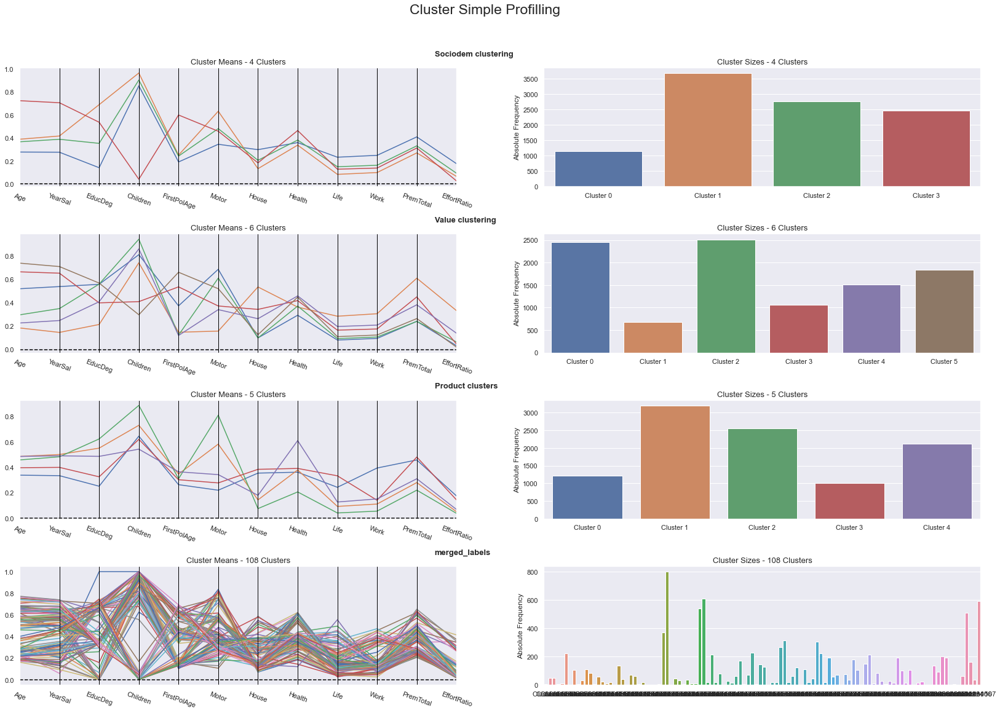

In [202]:
label_names = list(df_clusters.groupby("Composite").size().index)
label_sizes = list(df_clusters.groupby("Composite").size())
size_dict = {}

# create a dictionary with name and size of each clusters
for name, size in zip(label_names, label_sizes):
    size_dict[name] = size

# create a column with the size of the cluster each observation belongs to
df_clusters["Size"] = df_clusters.Composite.apply(lambda x: size_dict.get(x))

print(f"Number of unique clusters: {len(df_clusters.Composite.unique())}")
df_clusters.groupby("Composite").mean().sort_values("Size", ascending = False).head(10)

# scale data for better visual representation
vis_scaler = MinMaxScaler()
all_feats = list(df_clusters.columns)
df_clusters_vis = df_clusters.copy()
df_clusters_vis[all_feats] = vis_scaler.fit_transform(df_clusters)


cluster_profiles(
    df = df_clusters_vis[["Age", "YearSal", "EducDeg", "Children", "FirstPolAge", "Motor", "House", "Health", "Life", "Work", "PremTotal", "EffortRatio", "Sociodem", "Value", "Product", "Composite"]], 
    label_columns = ['Sociodem', 'Value', 'Product', 'Composite'], 
    figsize = (28, 18), 
    compar_titles = ["Sociodem clustering", "Value clustering", "Product clusters", "merged_labels"],
    save_fig = "yes",
    fig_name = "premergingclustersummary",
)

In [203]:
# separate the rows to be relabelled from the labelled rows
orphan_obs_df = df_clusters[df_clusters["Size"] < 300].drop(columns = "Size")
labelled_obs_df = df_clusters[~(df_clusters["Size"] < 300)].drop(columns = "Size")

# use the same features used to obtain the clusters
training_features = [
    "YearSal",
    "EducDeg",
    "Children",
    # "CMV",
    "PremTotal",
    "FirstPolAge",
    # "CustYears",
    "EffortRatio",
    "Motor",
    "House",
    "Health",
    "Life",
    "Work"
]

In [204]:
orphan_obs_df["Composite"]=-1
label_prop_model = LabelSpreading()

all_obs=labelled_obs_df.append(orphan_obs_df)
all_obs.Composite=all_obs.Composite.astype(float)

label_prop_model.fit(all_obs.drop(columns="Composite"), all_obs.Composite)
all_obs.Composite=label_prop_model.transduction_

In [205]:
all_obs.groupby("Composite").mean().sort_values("Age")

,Generation,Age,YearSal,EducDeg,Children,FirstPolAge,CustYears,CMV,ClaimsRate,Motor,...,HealthRatio,Life,LifeRatio,Work,WorkRatio,PremTotal,EffortRatio,Sociodem,Value,Product
Composite,,,,,,,,,,,,,,,,,,,,,
121.0,3.354360,37.092764,22841.727635,3.024119,0.970315,7.341373,29.751391,185.523284,0.681076,344.702096,...,0.277595,23.226753,0.035764,22.886809,0.035048,655.313785,0.030011,1.00000,2.000000,1.000000
221.0,3.208469,39.074919,23852.928627,2.136808,0.973941,8.390879,30.684039,161.386156,0.722020,340.172020,...,0.256930,28.193844,0.042883,29.600098,0.045619,664.939805,0.029127,2.00000,2.000000,1.000000
122.0,3.124183,41.665033,25491.651697,3.062092,0.978758,8.421569,33.243464,203.815719,0.627794,471.060392,...,0.155512,6.765310,0.011058,7.048219,0.011498,611.897712,0.025464,1.00000,2.000000,2.000000
101.0,2.761994,47.776996,28346.524958,2.299578,0.714018,19.928426,27.848570,232.670802,0.687467,250.356940,...,0.231362,53.533588,0.064993,51.930216,0.062806,808.907532,0.038899,1.58431,2.461947,1.966714
202.0,2.547771,51.105096,32043.342006,2.101911,0.964968,23.229299,27.875796,214.338917,0.615064,472.907293,...,0.135119,9.899618,0.016052,11.318153,0.018321,620.044427,0.019852,2.00000,0.000000,2.000000
102.0,2.508750,51.393750,32287.843677,3.152500,1.000000,23.210000,28.183750,212.781900,0.609912,488.373637,...,0.130481,6.522563,0.010657,6.602963,0.010635,609.632038,0.019388,1.00000,0.000000,2.000000
351.0,1.388998,71.573674,45508.413072,2.893910,0.066798,44.019646,27.554028,191.840982,0.681984,332.952770,...,0.276215,25.147957,0.037310,24.646621,0.036606,675.784676,0.015040,3.00000,5.000000,1.000000
354.0,1.366554,72.055743,45559.488120,2.584459,0.008446,44.043919,28.011824,141.328598,0.764932,207.614324,...,0.399442,38.850625,0.056470,38.933041,0.056529,696.945439,0.015462,3.00000,5.000000,4.000000


#### Joining clusters (Classification Tree)

In [206]:
# create a dataframe with the labels obtained from sociodemographic, value, and product clustering
df_clusters = df.copy().drop(columns = "Label")
df_clusters["Sociodem"] = sociodem_labels
df_clusters["Value"] = value_labels
df_clusters["Product"] = product_labels

# combine the clusters into a single label
df_clusters["Composite"] = df_clusters["Sociodem"].astype("str") + df_clusters["Value"].astype("str") + df_clusters["Product"].astype("str")
df_clusters.groupby("Composite").size().sort_values(ascending = False)

df_clusters.head()

,Generation,Age,YearSal,EducDeg,Children,FirstPolAge,CustYears,CMV,ClaimsRate,Motor,...,Life,LifeRatio,Work,WorkRatio,PremTotal,EffortRatio,Sociodem,Value,Product,Composite
CustID,,,,,,,,,,,,,,,,,,,,,
1,4.0,34.0,26124.0,2.0,1.0,3.0,31.0,380.97,0.39,375.85,...,47.01,0.070632,16.89,0.025377,665.56,0.025477,2,2,1,221
2,4.0,35.0,8124.0,2.0,1.0,14.0,21.0,-131.13,1.12,77.46,...,194.48,0.213489,106.13,0.116503,910.96,0.112132,2,1,0,210
3,3.0,46.0,27324.0,1.0,0.0,21.0,25.0,504.67,0.28,206.15,...,86.35,0.116595,99.02,0.133702,740.60,0.027104,0,0,0,000
4,4.0,35.0,13188.0,3.0,1.0,9.0,26.0,-16.99,0.99,182.48,...,35.34,0.058833,28.34,0.047180,600.68,0.045547,1,2,4,124
5,3.0,43.0,21156.0,3.0,1.0,13.0,30.0,35.23,0.90,338.62,...,18.78,0.029846,41.45,0.065873,629.24,0.029743,1,2,1,121


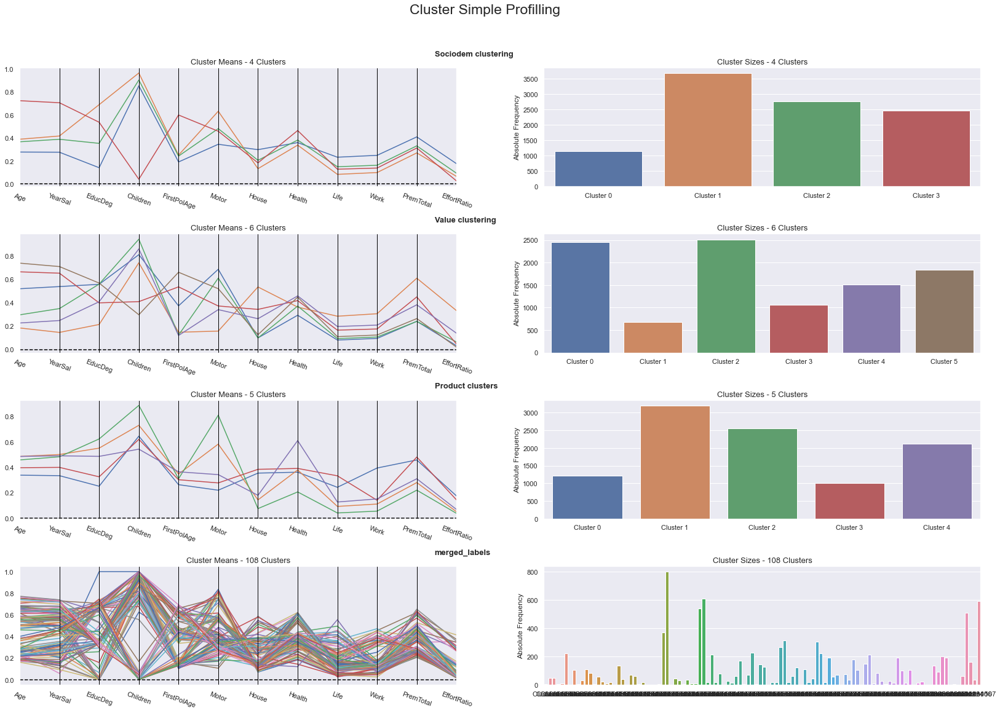

In [207]:
# scale data for better visual representation
vis_scaler = MinMaxScaler()
all_feats = list(df_clusters.columns)
df_clusters_vis = df_clusters.copy()
df_clusters_vis[all_feats] = vis_scaler.fit_transform(df_clusters)


cluster_profiles(
    df = df_clusters_vis[["Age", "YearSal", "EducDeg", "Children", "FirstPolAge", "Motor", "House", "Health", "Life", "Work", "PremTotal", "EffortRatio", "Sociodem", "Value", "Product", "Composite"]], 
    label_columns = ['Sociodem', 'Value', 'Product', 'Composite'], 
    figsize = (28, 18), 
    compar_titles = ["Sociodem clustering", "Value clustering", "Product clusters", "merged_labels"],
    # save_fig = "yes",
    # fig_name = "premergingclustersummary",
)

In [208]:
label_names = list(df_clusters.groupby("Composite").size().index)
label_sizes = list(df_clusters.groupby("Composite").size())
size_dict = {}

# create a dictionary with name and size of each clusters
for name, size in zip(label_names, label_sizes):
    size_dict[name] = size

# create a column with the size of the cluster each observation belongs to
df_clusters["Size"] = df_clusters.Composite.apply(lambda x: size_dict.get(x))

print(f"Number of unique clusters: {len(df_clusters.Composite.unique())}")
df_clusters.groupby("Composite").mean().sort_values("Size", ascending = False).head(10)

Number of unique clusters: 108


,Generation,Age,YearSal,EducDeg,Children,FirstPolAge,CustYears,CMV,ClaimsRate,Motor,...,Life,LifeRatio,Work,WorkRatio,PremTotal,EffortRatio,Sociodem,Value,Product,Size
Composite,,,,,,,,,,,,,,,,,,,,,
102,2.508750,51.393750,32287.843677,3.152500,1.000000,23.210000,28.183750,212.781900,0.609912,488.373637,...,6.522563,0.010657,6.602963,0.010635,609.632038,0.019388,1.0,0.0,2.0,800.0
122,3.124183,41.665033,25491.651697,3.062092,0.978758,8.421569,33.243464,203.815719,0.627794,471.060392,...,6.765310,0.011058,7.048219,0.011498,611.897712,0.025464,1.0,2.0,2.0,612.0
354,1.366554,72.055743,45559.488120,2.584459,0.008446,44.043919,28.011824,141.328598,0.764932,207.614324,...,38.850625,0.056470,38.933041,0.056529,696.945439,0.015462,3.0,5.0,4.0,592.0
121,3.354360,37.092764,22841.727635,3.024119,0.970315,7.341373,29.751391,185.523284,0.681076,344.702096,...,23.226753,0.035764,22.886809,0.035048,655.313785,0.030011,1.0,2.0,1.0,539.0
351,1.388998,71.573674,45508.413072,2.893910,0.066798,44.019646,27.554028,191.840982,0.681984,332.952770,...,25.147957,0.037310,24.646621,0.036606,675.784676,0.015040,3.0,5.0,1.0,509.0
101,2.243243,55.089189,34657.362788,3.081081,0.991892,24.291892,30.797297,210.618892,0.652568,352.830216,...,27.713622,0.041525,27.854865,0.042061,673.852730,0.019912,1.0,0.0,1.0,370.0
202,2.547771,51.105096,32043.342006,2.101911,0.964968,23.229299,27.875796,214.338917,0.615064,472.907293,...,9.899618,0.016052,11.318153,0.018321,620.044427,0.019852,2.0,0.0,2.0,314.0
221,3.208469,39.074919,23852.928627,2.136808,0.973941,8.390879,30.684039,161.386156,0.722020,340.172020,...,28.193844,0.042883,29.600098,0.045619,664.939805,0.029127,2.0,2.0,1.0,307.0
201,2.350746,53.611940,33862.464786,2.000000,0.906716,23.421642,30.190299,183.989851,0.692463,345.613806,...,33.652239,0.050888,35.312948,0.052882,675.738134,0.020534,2.0,0.0,1.0,268.0


In [209]:
# separate the rows to be relabelled from the labelled rows
orphan_obs_df = df_clusters[df_clusters["Size"] < 300].drop(columns = "Size")
labelled_obs_df = df_clusters[~(df_clusters["Size"] < 300)].drop(columns = "Size")

# use the same features used to obtain the clusters
training_features = [
    "YearSal",
    "EducDeg",
    "Children",
    # "CMV",
    "PremTotal",
    "FirstPolAge",
    # "CustYears",
    "EffortRatio",
    "Motor",
    "House",
    "Health",
    "Life",
    "Work"
]

In [210]:
# independent, X, and dependent, y, variables
X = labelled_obs_df[training_features]
y = labelled_obs_df.Composite

# split train and validation data
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.3, random_state = 15)

clf = RandomForestClassifier(
    random_state = 15,
    criterion = "gini"
).fit(X_train, y_train)

y_pred = clf.predict(X_val)

# evaluate predictions
accuracy = round(metrics.accuracy_score(y_val, y_pred)*100, 2)
print(f"Classification Tree Accuracy: {accuracy} %")

Classification Tree Accuracy: 95.96 %


In [211]:
# classify orphan observations
X_test = orphan_obs_df[training_features]
y_pred = clf.predict(X_test)

orphan_obs_df["Composite"] = y_pred

final_final = pd.concat([labelled_obs_df, orphan_obs_df])
final_cluster_sizes=final_final.groupby("Composite").size().rename("Size")

#calculates the size of each cluster
final_final_grouped=final_final.groupby("Composite").mean().merge(final_cluster_sizes,left_index=True,right_index=True)
#calculates the value of each cluster
final_final_grouped["ClusterValue"]=final_final_grouped["CMV"]*final_final_grouped["Size"]
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(final_final_grouped[["YearSal", "EducDeg", "Children", "CMV", "PremTotal", "FirstPolAge", "CustYears", "EffortRatio", "Motor", "House", "Health", "Life", "Work", "Size", "ClusterValue"]].sort_values("YearSal"))

,YearSal,EducDeg,Children,CMV,PremTotal,FirstPolAge,CustYears,EffortRatio,Motor,House,Health,Life,Work,Size,ClusterValue
Composite,,,,,,,,,,,,,,,
121,19966.996401,3.061870,0.898453,214.848964,749.188157,6.965703,27.979153,0.042487,266.745030,200.060962,206.733658,37.727969,37.920538,1487,319480.41
221,20784.748344,1.727368,0.864912,235.878765,857.790712,11.006316,26.724912,0.053479,205.092239,336.199386,179.697123,69.628519,67.173446,2850,672254.48
122,24905.436268,3.183784,0.939189,204.799946,614.789311,8.345946,32.820270,0.026286,470.274041,35.716554,94.804851,6.956459,7.037405,740,151551.96
202,33243.954815,1.926316,0.944361,207.399248,644.982872,23.242105,29.273684,0.019976,437.163774,72.795038,97.151414,17.895774,19.976872,665,137920.50
102,33649.135685,3.159180,0.926758,213.557100,613.198008,25.609375,28.000977,0.018812,484.097725,33.224854,81.182344,7.405117,7.287969,1024,218682.47
101,35243.955194,3.082596,0.871681,225.047271,726.732758,25.364307,31.063422,0.021285,326.192124,170.983260,164.952124,32.439071,32.166180,678,152582.05
351,43282.232499,2.738056,0.277595,202.679349,702.031219,40.582372,27.767710,0.016518,340.378229,142.533567,162.857002,29.446993,26.815428,1214,246052.73
354,44052.526058,2.332390,0.092645,200.463373,800.203352,40.668317,28.955446,0.018453,185.395870,264.511033,244.635545,53.102207,52.558699,1414,283455.21


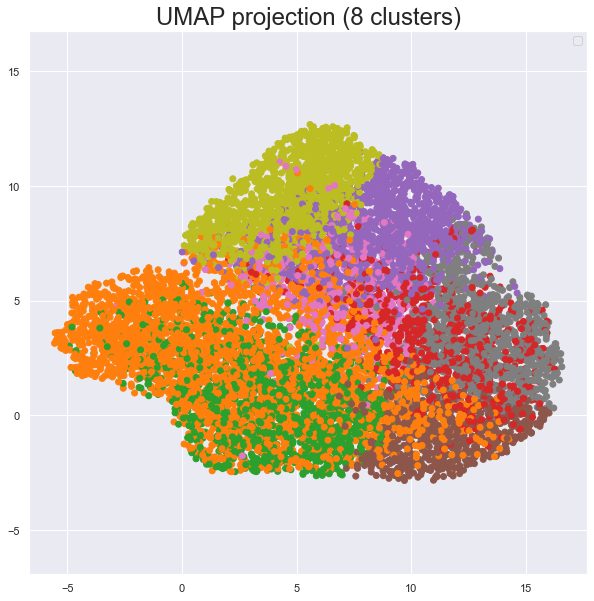

In [212]:
import umap

# create a color dictionary for UMAP, one color per composite label
color_dic = {}
i = 1
for label in final_final.Composite.unique():
    color_dic[label] = i
    i += 1
    
reducer = umap.UMAP(n_neighbors = 30, min_dist = 0.8)
cluster_data = final_final[[
    "YearSal", 
    "PremTotal",
    # "EducDeg",
    # "Children",
    # "CMV",
    "FirstPolAge", 
    # "CustYears", 
    "EffortRatio",
    "Motor", 
    "House", 
    "Health", 
    "Life", 
    "Work"
]].values
scaled_cluster_data = StandardScaler().fit_transform(cluster_data)
embedding = reducer.fit_transform(scaled_cluster_data)


plt.subplots(figsize = (10, 10))
plt.scatter(
    embedding[:, 0],
    embedding[:, 1],
    c = [sns.color_palette("tab10")[color_dic[x]] for x in final_final.Composite]
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection (8 clusters)', fontsize=24)
plt.legend().set_visible(True)

# plt.savefig('UMAP_finalclusters.jpeg', dpi=300, bbox_inches='tight')

In [213]:
# manually merge some clusters
# the micromanagement approach
final_final.loc[final_final.Composite == "121", "Composite"] = "122"
final_final.loc[final_final.Composite == "102", "Composite"] = "101"
final_final.loc[final_final.Composite == "202", "Composite"] = "101"
final_final.loc[final_final.Composite == "351", "Composite"] = "354"


final_final.groupby("Composite")[["Age", "YearSal", "EducDeg", "Children", "CMV", "PremTotal", "FirstPolAge", "EffortRatio", "Motor", "House", "Health", "Life", "Work"]].mean().sort_values("YearSal")

,Age,YearSal,EducDeg,Children,CMV,PremTotal,FirstPolAge,EffortRatio,Motor,House,Health,Life,Work
Composite,,,,,,,,,,,,,
221,37.731228,20784.748344,1.727368,0.864912,235.878765,857.790712,11.006316,0.053479,205.092239,336.199386,179.697123,69.628519,67.173446
122,37.012124,21607.968786,3.102380,0.911989,211.509820,704.529358,7.424338,0.037104,334.374787,145.451684,169.541329,27.503040,27.658518
101,54.109844,33992.119356,2.790875,0.915927,215.118302,654.648576,24.874102,0.019847,425.681555,83.801267,109.663688,17.523118,17.978948
354,69.035388,43696.690297,2.519787,0.178082,201.487040,754.852907,40.628615,0.017559,256.989699,208.163756,206.858090,42.174722,40.666640


In [214]:
final_final.groupby("Composite").size()

Composite
101    2367
122    2227
221    2850
354    2628
dtype: int64

In [215]:
r2_variables(final_final[["YearSal", "EducDeg", "Children", "PremTotal", "FirstPolAge", "EffortRatio", "Motor", "House", "Health", "Life", "Work", "Composite"]], 'Composite').drop("Composite")

Children       0.481863
EducDeg        0.430008
EffortRatio    0.290540
FirstPolAge    0.777205
Health         0.222910
House          0.183742
Life           0.186535
Motor          0.372569
PremTotal      0.180091
Work           0.177327
YearSal        0.668616
dtype: float64

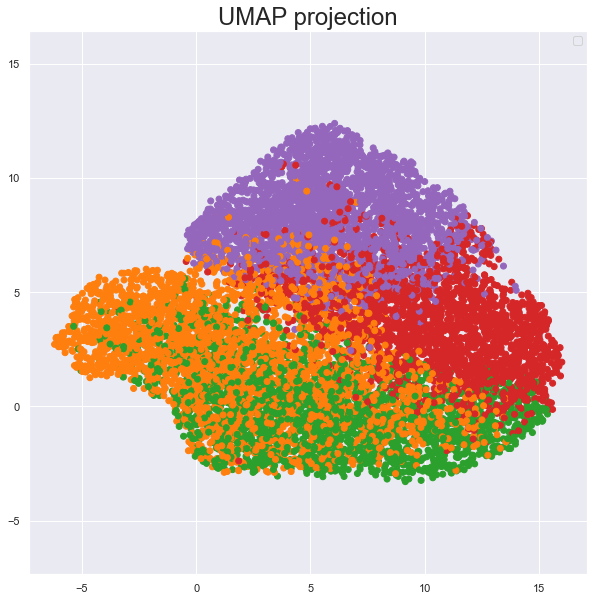

In [216]:
import umap

# create a color dictionary for UMAP, one color per composite label
color_dic = {}
i = 1
for label in final_final.Composite.unique():
    color_dic[label] = i
    i += 1
    
reducer = umap.UMAP(n_neighbors = 30, min_dist = 0.8)
cluster_data = final_final[[
    "YearSal", 
    "PremTotal",
    # "EducDeg",
    # "Children",
    # "CMV",
    "FirstPolAge", 
    # "CustYears", 
    "EffortRatio",
    "Motor", 
    "House", 
    "Health", 
    "Life", 
    "Work"
]].values
scaled_cluster_data = StandardScaler().fit_transform(cluster_data)
embedding = reducer.fit_transform(scaled_cluster_data)


plt.subplots(figsize = (10, 10))
plt.scatter(
    embedding[:, 0],
    embedding[:, 1],
    c = [sns.color_palette("tab10")[color_dic[x]] for x in final_final.Composite]
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection', fontsize=24)
plt.legend().set_visible(True)

# plt.savefig('UMAP_finalclusters.jpeg', dpi=300, bbox_inches='tight')

In [217]:
#analysis of cancelled insurances
df_temp=df.copy()
#health and motor are removed as its only one person
for premium in ["Work","Life","House"]:
    df_temp["Canceled"]=df_temp[premium]<0
    print(premium)
    with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
        display(df_temp.groupby("Canceled").mean())
print("Any cancelation")
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    df_temp["Canceled"]=(df.Health<0) | (df.Life<0) | (df.Work<0) | (df.House<0) | (df.Motor<0)
    display(df_temp.groupby("Canceled").mean())

Work


,Generation,Age,YearSal,EducDeg,Children,FirstPolAge,CustYears,CMV,ClaimsRate,Motor,MotorRatio,House,HouseRatio,Health,HealthRatio,Life,LifeRatio,Work,WorkRatio,PremTotal,EffortRatio,Label
Canceled,,,,,,,,,,,,,,,,,,,,,,
False,2.657757,49.510364,29942.299712,2.449924,0.698560,21.259110,28.251255,218.587754,0.682786,286.723157,0.419423,212.342079,0.234715,172.524388,0.235508,43.073313,0.054210,44.350841,0.056144,759.013779,0.033477,1.961161
True,2.583885,50.387417,31126.499696,2.874172,0.804636,20.629139,29.758278,196.914415,0.656380,423.861192,0.683795,89.595585,0.109656,123.116788,0.186942,18.976766,0.026704,-4.472263,-0.007096,651.078068,0.023530,1.969095


Life


,Generation,Age,YearSal,EducDeg,Children,FirstPolAge,CustYears,CMV,ClaimsRate,Motor,MotorRatio,House,HouseRatio,Health,HealthRatio,Life,LifeRatio,Work,WorkRatio,PremTotal,EffortRatio,Label
Canceled,,,,,,,,,,,,,,,,,,,,,,
False,2.650982,49.597557,30028.627729,2.459267,0.697716,21.308763,28.288794,216.719723,0.683945,289.721231,0.425654,209.312454,0.231502,171.517739,0.234810,43.967362,0.055671,41.575979,0.052364,756.094764,0.033186,1.964525
True,2.652968,49.470320,30338.200634,2.901065,0.856925,19.678843,29.791476,215.469741,0.629772,432.872618,0.694688,86.490639,0.108310,118.817108,0.178541,-2.967686,-0.004652,16.788584,0.023113,652.001263,0.023937,1.923896


House


,Generation,Age,YearSal,EducDeg,Children,FirstPolAge,CustYears,CMV,ClaimsRate,Motor,MotorRatio,House,HouseRatio,Health,HealthRatio,Life,LifeRatio,Work,WorkRatio,PremTotal,EffortRatio,Label
Canceled,,,,,,,,,,,,,,,,,,,,,,
False,2.654582,49.534698,29923.524453,2.445396,0.694617,21.312278,28.222420,225.962590,0.677472,284.770792,0.40563,228.940864,0.256709,173.032467,0.231487,43.479572,0.053751,42.471118,0.052424,772.694812,0.034114,1.961521
True,2.622222,50.043519,31092.033333,2.843519,0.820370,20.287963,29.755556,139.003889,0.704880,418.021981,0.75604,-28.828843,-0.053313,126.846676,0.228241,19.476509,0.034962,19.044120,0.034070,554.560444,0.019829,1.964815


Any cancelation


,Generation,Age,YearSal,EducDeg,Children,FirstPolAge,CustYears,CMV,ClaimsRate,Motor,MotorRatio,House,HouseRatio,Health,HealthRatio,Life,LifeRatio,Work,WorkRatio,PremTotal,EffortRatio,Label
Canceled,,,,,,,,,,,,,,,,,,,,,,
False,2.661211,49.449816,29814.721145,2.393605,0.679736,21.400584,28.049232,227.029157,0.682623,268.320297,0.376475,243.109650,0.269915,178.114030,0.236183,47.768282,0.058839,47.495220,0.058588,784.807479,0.035317,1.965867
True,2.614788,50.090826,30890.876559,2.827932,0.810132,20.489731,29.601095,179.261990,0.672455,409.625942,0.683225,50.914628,0.056387,131.987987,0.212998,16.221410,0.026187,12.851716,0.021203,621.601684,0.022746,1.947513


#### Reassigning outliers

##### RandomForest

In [218]:
#reassigning outliers using randomforest
clf = RandomForestClassifier(
    random_state = 15,
    criterion = "gini"
).fit(final_final.drop(columns=["Composite","Sociodem","Value","Product"]), final_final.Composite)

y_pred = clf.predict(df_outliers)
df_outliers["Composite"]=y_pred

In [219]:
final_final_w_outliers=final_final.drop(columns=["Sociodem","Value","Product"]).append(df_outliers.drop(columns="Composite"))
final_final_w_outliers.groupby("Composite").mean().sort_values("Age")

,Generation,Age,YearSal,EducDeg,Children,FirstPolAge,CustYears,CMV,ClaimsRate,Motor,...,House,HouseRatio,Health,HealthRatio,Life,LifeRatio,Work,WorkRatio,PremTotal,EffortRatio
Composite,,,,,,,,,,,,,,,,,,,,,
122,3.396048,37.012124,21607.968786,3.102380,0.911989,7.424338,29.587786,211.509820,0.667247,334.374787,...,145.451684,0.173394,169.541329,0.242936,27.503040,0.037312,27.658518,0.037244,704.529358,0.037104
221,3.321754,37.731228,20784.748344,1.727368,0.864912,11.006316,26.724912,235.878765,0.705779,205.092239,...,336.199386,0.339681,179.697123,0.226354,69.628519,0.080969,67.173446,0.077723,857.790712,0.053479
101,2.347275,54.109844,33992.119356,2.790875,0.915927,24.874102,29.235741,215.118302,0.633946,425.681555,...,83.801267,0.108893,109.663688,0.167173,17.523118,0.025758,17.978948,0.026317,654.648576,0.019847
354,1.566210,69.035388,43696.690297,2.519787,0.178082,40.628615,28.406773,201.487040,0.705906,256.989699,...,208.163756,0.243059,206.858090,0.283945,42.174722,0.055656,40.666640,0.053822,754.852907,0.017559


##### Labelspreading

In [220]:
label_prop_model = LabelSpreading()

df_outliers["Composite"]=-1
final_final_w_outliers=final_final.drop(columns=["Sociodem","Value","Product"]).append(df_outliers)
final_final_w_outliers.Composite=final_final_w_outliers.Composite.astype(int)

label_prop_model.fit(final_final_w_outliers.drop(columns="Composite"), final_final_w_outliers.Composite)
final_final_w_outliers.Composite=label_prop_model.transduction_

In [221]:
final_final_w_outliers.groupby("Composite").mean().sort_values("Age")

,Generation,Age,YearSal,EducDeg,Children,FirstPolAge,CustYears,CMV,ClaimsRate,Motor,...,House,HouseRatio,Health,HealthRatio,Life,LifeRatio,Work,WorkRatio,PremTotal,EffortRatio
Composite,,,,,,,,,,,,,,,,,,,,,
122,3.396048,37.012124,21607.968786,3.102380,0.911989,7.424338,29.587786,211.509820,0.667247,334.374787,...,145.451684,0.173394,169.541329,0.242936,27.503040,0.037312,27.658518,0.037244,704.529358,0.037104
221,3.321754,37.731228,20784.748344,1.727368,0.864912,11.006316,26.724912,235.878765,0.705779,205.092239,...,336.199386,0.339681,179.697123,0.226354,69.628519,0.080969,67.173446,0.077723,857.790712,0.053479
101,2.379051,53.592885,33839.731696,2.735573,0.898419,45.053360,8.539526,59.031854,0.893945,420.499253,...,129.878557,0.129730,125.625526,0.168553,21.335407,0.030391,23.618261,0.032080,720.957004,0.025115
354,1.566210,69.035388,43696.690297,2.519787,0.178082,40.628615,28.406773,201.487040,0.705906,256.989699,...,208.163756,0.243059,206.858090,0.283945,42.174722,0.055656,40.666640,0.053822,754.852907,0.017559
